In [1]:
import os
import os.path as osp
import zipfile
import csv
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, WeightedRandomSampler
from torchvision import transforms
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight

from torch.optim.lr_scheduler import OneCycleLR, CosineAnnealingWarmRestarts
from torch.amp import autocast, GradScaler

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import warnings
import random
from collections import Counter

#import kagglehub
#test_set_path = kagglehub.dataset_download('albertodugo2/test-set')
#trainer_path = kagglehub.dataset_download('albertodugo2/trainer')
train_dir = "/kaggle/input/unipd-deep-learning-2025-challenge-1/train_dataset"
test_dir  = "/kaggle/input/unipd-deep-learning-2025-challenge-1/test_dataset"

In [2]:
#Dataset mean: [0.5131654143333435, 0.46465885639190674, 0.4044109880924225]
#Dataset std: [0.2625938653945923, 0.25588247179985046, 0.27475273609161377]

import torchvision.transforms as T
from torch.utils.data import DataLoader, random_split

import os
import os.path as osp
import csv
import random
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split, Sampler
import torchvision.transforms as T

# --------------------------
# 1. ImageDataset (Fixed)
# --------------------------
class ImageDataset(Dataset):
    def __init__(self, root: str, test: bool=False, transform=None):
        super().__init__()
        self.root = root
        self.test = test
        self.transform = transform
        self.img_path = osp.join(root,'images') if osp.exists(osp.join(root,'images')) else root
        self.ids, self.targets = [], []

        if not test:
            with open(osp.join(root,'labels.csv')) as f:
                reader = csv.DictReader(f)
                for r in reader:
                    self.ids.append(r['id'].zfill(5))
                    self.targets.append(int(r['label']))
        else:
            for fn in sorted(os.listdir(self.img_path)):
                if fn.lower().endswith('.jpeg'):
                    self.ids.append(osp.splitext(fn)[0])

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img = Image.open(osp.join(self.img_path,f"{img_id}.jpeg")).convert('RGB')

        # Fixed transform logic
        if self.transform:
            if isinstance(self.transform, dict) and not self.test:
                label = self.targets[idx]
                class_name = f"class_{label}"  # Use actual class names if available
                tf = self.transform.get(class_name, self.transform.get('default'))
                if tf: img = tf(img)
            else:
                img = self.transform(img)

        return (img, img_id) if self.test else (img, self.targets[idx])

# --------------------------
# 2. BalancedSampler (Fixed as Sampler)
# --------------------------
class BalancedSampler(Sampler):
    def __init__(self, dataset, target_count):
        self.dataset = dataset
        self.target_count = target_count

        # Get labels through subset if needed
        if hasattr(dataset, 'dataset') and hasattr(dataset.dataset, 'targets'):
            self.labels = [dataset.dataset.targets[i] for i in dataset.indices]
        else:
            self.labels = [label for _, label in dataset]

        # Group indices by class
        self.class_indices = {}
        for idx, label in enumerate(self.labels):
            self.class_indices.setdefault(label, []).append(idx)

        # Balance classes
        self.balanced_indices = []
        for label, indices in self.class_indices.items():
            current_count = len(indices)

            if current_count < target_count:
                # Oversample with transform-aware duplication
                self.balanced_indices.extend(indices)  # Original samples

                # Critical fix: Store augmented indices separately
                self.augmented_indices = random.choices(indices, k=target_count-current_count)
                self.balanced_indices.extend(self.augmented_indices)
            else:
                # Undersample
                self.balanced_indices.extend(random.sample(indices, k=target_count))

        random.shuffle(self.balanced_indices)

    def __iter__(self):
        return iter(self.balanced_indices)

    def __len__(self):
        return len(self.balanced_indices)

class TransformedSubset(Dataset):
    def __init__(self, subset, transform=None, augmented_indices=None, aug_transform=None):
        self.subset = subset
        self.transform = transform
        self.augmented_indices = set(augmented_indices) if augmented_indices else set()
        self.aug_transform = aug_transform or transform  # Fallback to default transform

    def __getitem__(self, index):
        x, y = self.subset[index]

        # Apply different transform for augmented samples
        if index in self.augmented_indices and self.aug_transform:
            x = self.aug_transform(x)
        elif self.transform:
            x = self.transform(x)

        return x, y

    def __len__(self):
        return len(self.subset)

# --------------------------
# 3. TransformedSubset (Helper Class)
# --------------------------
class TransformedSubset(Dataset):
    def __init__(self, subset, transform=None, aug_transform=None):
        self.subset = subset
        self.transform = transform
        self.aug_transform = aug_transform  # Separate augmentation transform

    def __getitem__(self, index):
        x, y = self.subset[index]

        # Apply augmentation transform randomly (50% chance)
        if self.aug_transform and random.random() < 0.5:
            x = self.aug_transform(x)
        elif self.transform:
            x = self.transform(x)

        return x, y

    def __len__(self):
        return len(self.subset)


# --------------------------
# 4. Data Preparation
# --------------------------
base_dataset = ImageDataset(root=train_dir, transform=None)
mean = [0.5131654143333435, 0.46465885639190674, 0.4044109880924225]
std = [0.2625938653945923, 0.25588247179985046, 0.27475273609161377]
# Create transforms
train_transform = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])

val_transform = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])

train_size = int(0.9 * len(base_dataset))
val_size = len(base_dataset) - train_size
train_subset, val_subset = random_split(base_dataset, [train_size, val_size],
                                generator=torch.Generator().manual_seed(42))
train_subset2, val_subset2 = random_split(base_dataset, [train_size, val_size],
                                generator=torch.Generator().manual_seed(20))
train_subset3, val_subset3 = random_split(base_dataset, [train_size, val_size],
                                generator=torch.Generator().manual_seed(90))
train_subset4, val_subset4 = random_split(base_dataset, [train_size, val_size],
                                generator=torch.Generator().manual_seed(93))

# Apply transforms
#train_dataset = TransformedSubset(train_subset, transform=train_transform)
val_dataset = TransformedSubset(val_subset, transform=val_transform)
val_dataset2 = TransformedSubset(val_subset2, transform=val_transform)
val_dataset3 = TransformedSubset(val_subset3, transform=val_transform)
val_dataset4 = TransformedSubset(val_subset4, transform=val_transform)

# Create sampler (no need to track augmented indices)
train_sampler = BalancedSampler(train_subset, target_count=2300)
train_sampler2 = BalancedSampler(train_subset2, target_count=2300)
train_sampler3 = BalancedSampler(train_subset3, target_count=2300)
train_sampler4 = BalancedSampler(train_subset4, target_count=2300)

# Define augmentation transforms separately
aug_transform = transforms.Compose([
    transforms.RandAugment(num_ops=2, magnitude=9),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1)),
    transforms.ColorJitter(0.3, 0.3, 0.3, 0.1),
    transforms.ToTensor(),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.2)),
    transforms.Normalize(mean=mean, std=std)
])


train_dataset = TransformedSubset(
    train_subset,
    transform=train_transform,       # Standard transforms
    aug_transform=aug_transform      # Stronger augmentation
)
train_dataset2 = TransformedSubset(
    train_subset2,
    transform=train_transform,       # Standard transforms
    aug_transform=aug_transform      # Stronger augmentation
)
train_dataset3 = TransformedSubset(
    train_subset3,
    transform=train_transform,       # Standard transforms
    aug_transform=aug_transform      # Stronger augmentation
)
train_dataset4 = TransformedSubset(
    train_subset4,
    transform=train_transform,       # Standard transforms
    aug_transform=aug_transform      # Stronger augmentation
)
# Create DataLoader
train_loader = DataLoader(
    train_dataset,
    batch_size=64,
    sampler=train_sampler,
    shuffle=False
)
train_loader2 = DataLoader(
    train_dataset2,
    batch_size=64,
    sampler=train_sampler2,
    shuffle=False
)
train_loader3 = DataLoader(
    train_dataset3,
    batch_size=64,
    sampler=train_sampler3,
    shuffle=False
)
train_loader4 = DataLoader(
    train_dataset4,
    batch_size=64,
    sampler=train_sampler4,
    shuffle=False
)
val_loader = DataLoader(val_dataset, batch_size=64)
val_loader2 = DataLoader(val_dataset2, batch_size=64)
val_loader3 = DataLoader(val_dataset3, batch_size=64)
val_loader4 = DataLoader(val_dataset4, batch_size=64)

# Test dataset
test_ds = ImageDataset(test_dir, test=True, transform=val_transform)  # Pass transform directly, not in dict
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=2)


In [3]:
#####model
class VGGStyleClassifier(nn.Module):
    def __init__(self, num_classes=20, dropout=0.5):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3,64,3,padding=1),  nn.BatchNorm2d(64),  nn.LeakyReLU(inplace=True),
            nn.Conv2d(64,64,3,padding=1), nn.BatchNorm2d(64),  nn.LeakyReLU(inplace=True),
            nn.Dropout2d(0.10),
            nn.MaxPool2d(2),

            nn.Conv2d(64,128,3,padding=1),  nn.BatchNorm2d(128), nn.LeakyReLU(inplace=True),
            nn.Conv2d(128,128,3,padding=1), nn.BatchNorm2d(128), nn.LeakyReLU(inplace=True),
            nn.Dropout2d(0.20),

            nn.Conv2d(128,256,3,padding=1),  nn.BatchNorm2d(256), nn.LeakyReLU(inplace=True),
            nn.Conv2d(256,256,3,padding=1), nn.BatchNorm2d(256), nn.LeakyReLU(inplace=True),
            nn.Dropout2d(0.27),
            nn.MaxPool2d(2),

            nn.Conv2d(256,512,3,padding=1),  nn.BatchNorm2d(512), nn.LeakyReLU(inplace=True),
            nn.Conv2d(512,512,3,padding=1), nn.BatchNorm2d(512), nn.LeakyReLU(inplace=True),
            nn.Dropout2d(0.30),

            nn.AdaptiveAvgPool2d(1)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 20)  # Input: (batch_size, 512), Output: (batch_size, 256)
        )

    def forward(self, x):
        return self.classifier(self.features(x))

# weight init
import torch.nn.init as init

def init_weights(m):
    if isinstance(m, nn.Conv2d):
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm1d)):
        init.constant_(m.weight, 1)
        init.constant_(m.bias, 0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
vggmodel  = VGGStyleClassifier(num_classes=20, dropout=0.50).to(device)
vggmodel.apply(init_weights)

class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing=0.1):
        super().__init__()
        self.smoothing = smoothing

    def forward(self, x, target):
        log_probs   = F.log_softmax(x, dim=-1)
        nll_loss    = -log_probs.gather(dim=-1, index=target.unsqueeze(1)).squeeze(1)
        smooth_loss = -log_probs.mean(dim=-1)
        return ((1-self.smoothing)*nll_loss + self.smoothing*smooth_loss).mean()

In [4]:
class Drop(nn.Module):
    def __init__(self, block_size=5, drop_prob=0.18):
        super().__init__()
        self.block_size = block_size
        self.drop_prob  = drop_prob

    def forward(self, x):
        if not self.training or self.drop_prob == 0.: return x
        h, w   = x.shape[2], x.shape[3]
        gamma  = self.drop_prob * (h*w) / (self.block_size**2) / \
                 ((h - self.block_size + 1)*(w - self.block_size + 1))
        mask   = (torch.rand(x.shape[0],1,h,w,device=x.device) < gamma).float()
        mask   = F.max_pool2d(mask, kernel_size=self.block_size, stride=1, padding=self.block_size//2)
        mask   = 1 - mask
        return x * mask * (mask.numel() / mask.sum())

class Block(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels//reduction, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels//reduction, channels, 1),
            nn.Sigmoid()
        )
    def forward(self, x): return x * self.fc(x)

class ResidualBlock(nn.Module):
    def __init__(self, in_c, out_c, stride=1):
        super().__init__()
        self.conv1   = nn.Conv2d(in_c, out_c, 3, stride, 1, bias=False)
        self.bn1     = nn.BatchNorm2d(out_c)
        self.conv2   = nn.Conv2d(out_c, out_c, 3, 1, 1, bias=False)
        self.bn2     = nn.BatchNorm2d(out_c)
        self.se      = Block(out_c)
        self.shortcut= nn.Sequential()
        if stride!=1 or in_c!=out_c:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_c, out_c, 1, stride, bias=False),
                nn.BatchNorm2d(out_c)
            )
    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out = self.se(out)
        out += self.shortcut(x)
        return F.relu(out)

class Resnet(nn.Module):
    def __init__(self, num_classes=20):
        super().__init__()
        self.conv1   = nn.Conv2d(3,32,3,1,1,bias=False)
        self.bn1     = nn.BatchNorm2d(32)
        self.layer1  = self._make_layer(32,64,2,stride=1)
        self.layer2  = self._make_layer(64,128,2,stride=2)
        self.layer3  = self._make_layer(128,256,2,stride=2)
        self.layer4  = self._make_layer(256,512,2,stride=1)
        self.dropblk = Drop(block_size=5, drop_prob=0.2)
        self.fc      = nn.Linear(512, num_classes)

    def _make_layer(self, in_c, out_c, blocks, stride):
        layers = [ResidualBlock(in_c,out_c,stride)]
        for _ in range(1,blocks): layers.append(ResidualBlock(out_c,out_c,1))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = F.adaptive_avg_pool2d(x,(1,1))
        x = self.dropblk(x)
        x = torch.flatten(x,1)
        return self.fc(x)
        
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnetModel = Resnet().to('cuda')
resnetModel.apply(init_weights)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnetModel2 = Resnet().to('cuda')
resnetModel2.apply(init_weights)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnetModel3 = Resnet().to('cuda')
resnetModel3.apply(init_weights)

Resnet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (se): Block(
        (fc): Sequential(
          (0): AdaptiveAvgPool2d(output_size=1)
          (1): Conv2d(64, 4, kernel_size=(1, 1), stride=(1, 1))
          (2): ReLU(inplace=True)
          (3): Conv2d(4, 64, kernel_size=(1, 1), stride=(1, 1))
          (4): Sigmoid()
        )
      )
      (shortcut): Sequential(
        (0): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias

In [5]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def mixup_data(x, y, alpha=1.0, device='cuda'):
    '''Applies MixUp to a batch.'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.

    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(device)

    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, preds, y_a, y_b, lam):
    return lam * criterion(preds, y_a) + (1 - lam) * criterion(preds, y_b)

In [6]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
MAX_NORM = 1.50
def train_one_epoch(model, dataloader, optimizer, criterion, device, scaler=None):
    model.train()
    epoch_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    all_predictions = []

    for i, (inputs, targets) in enumerate(dataloader):
        inputs = inputs.to(device)
        targets = targets.to(device)
        optimizer.zero_grad()
        #inputs, targets_a, targets_b, lam = mixup_data(inputs, targets, alpha=0.2, device=device)


        # Forward pass with mixed precision if enabled
        use_amp = scaler is not None
        if use_amp:
            with torch.cuda.amp.autocast():
                outputs = model(inputs)
                #loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
                loss = criterion(outputs, targets)

            # Backward pass with gradient scaling
            scaler.scale(loss).backward()

            # Gradient clipping to prevent exploding gradients
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=MAX_NORM)

            # Update weights
            scaler.step(optimizer)
            scaler.update()
        else:
            # Standard forward and backward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()

            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=MAX_NORM)

            # Update weights
            optimizer.step()

        # Update metrics
        epoch_loss += loss.item()

        # Get predictions and calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())

        batch_size = targets.size(0)
        total_samples += batch_size
        correct_predictions += (predicted == targets).sum().item()

        # Print progress (if not using tqdm)
        if (i+1) % 10 == 0:
            accuracy = 100 * correct_predictions / total_samples
            print(f"Batch {i+1}/{len(dataloader)}, Loss: {loss.item():.4f}, Accuracy: {accuracy:.2f}%")

    # Calculate average metrics
    avg_loss = epoch_loss / len(dataloader)
    avg_accuracy = correct_predictions / total_samples

    # Debug: Check if model is predicting the same class for everything
    if len(all_predictions) > 0:
        unique_preds, counts = np.unique(all_predictions, return_counts=True)
        print(f"Prediction distribution: {dict(zip(unique_preds, counts))}")
    del inputs, targets, outputs, predicted
    torch.cuda.empty_cache()

    return avg_loss, avg_accuracy


# Validation function for classification
def validate_one_epoch(model, dataloader, criterion, device):
    """
    Validate the CNN classification model for one epoch

    Args:
        model: The CNN model
        dataloader: DataLoader containing validation data
        criterion: Loss function (e.g., CrossEntropyLoss)
        device: Device to run validation on (cuda or cpu)

    Returns:
        tuple: (average_loss, average_accuracy) for the epoch
    """
    model.eval()
    epoch_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    batch_count = 0
    all_preds = []
    all_targets = []


    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Update loss
            epoch_loss += loss.item()

            # Get predictions and calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            batch_size = targets.size(0)
            total_samples += batch_size
            correct_predictions += (predicted == targets).sum().item()
            batch_count += 1

            # Store predictions and targets for additional metrics
            all_preds.extend(predicted.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

            # Free up memory
            del inputs, targets, outputs, predicted
            torch.cuda.empty_cache()

    # Calculate average metrics
    avg_loss = epoch_loss / batch_count
    avg_accuracy = correct_predictions / total_samples
    #TODO add the precision recall and f1
    # Calculate additional metrics if sklearn is available
    precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    return avg_loss, avg_accuracy, precision, recall, f1, all_preds, all_targets


# Main training loop
def train_classification_model(model, train_loader, val_loader, start_epoch, optimizer, criterion,
                               scheduler=None, num_epochs=25, device='cuda',
                               use_mixed_precision=False, patience=7, model_name = "name_model"):
    from datetime import datetime

    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [],
        'precision': [], 'recall': [], 'f1': [] , 'lr':[]
    }
    best_val_acc = 0.0
    early_stopping = EarlyStopping(patience=patience)

    scaler = None
    if use_mixed_precision and torch.cuda.is_available():
        scaler = torch.cuda.amp.GradScaler()
    for epoch in range(start_epoch, num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        current_lr = optimizer.param_groups[0]['lr']
        print(f"\nEpoch {epoch+1}/{num_epochs} - Learning Rate: {current_lr:.6f}")

        train_loss, train_acc = train_one_epoch(
            model, train_loader, optimizer, criterion, device, scaler
        )

        val_results = validate_one_epoch(model, val_loader, criterion, device)
        val_loss, val_acc, precision, recall, f1, all_preds, all_targets = val_results
        
        cm = confusion_matrix(all_targets, all_preds)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix - Epoch {epoch+1}")
        plt.show()

        if scheduler is not None and isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_loss)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['precision'].append(precision)
        history['recall'].append(recall)
        history['f1'].append(f1)
        history['lr'].append(current_lr)

        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, precision: {precision:.4f}, recall: {recall:.4f}, f1: {f1:.4f}")

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            checkpoint_dir = "/kaggle/working/"
            best_model_path = os.path.join(checkpoint_dir, model_name+'.pt')
            # Save model state dictionary and optimizer state
            checkpoint = {
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
                'train_loss': train_loss,
                'val_loss': val_loss,
                'train_acc': train_acc,
                'val_acc': val_acc,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'best_val_acc': best_val_acc,
                'learning_rate': current_lr
            }
            torch.save(checkpoint, best_model_path)

            # Upload checkpoint to Hugging Face
            print(f"Best model saved with val accuracy: {best_val_acc:.4f}!")

        # Check for early stopping
        early_stopping(val_acc)
        
        if early_stopping.early_stop:
            return history, model

        torch.cuda.empty_cache()
    return history, model


# Early stopping implementation
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.01):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_score is None:
            self.best_score = val_loss
        elif val_loss < self.best_score + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = val_loss
            self.counter = 0

Total parameters: 11,250,988
Epoch [1/45]

Epoch 1/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.8410, Accuracy: 10.62%
Batch 20/719, Loss: 2.7284, Accuracy: 12.81%
Batch 30/719, Loss: 2.5532, Accuracy: 15.26%
Batch 40/719, Loss: 2.6136, Accuracy: 16.48%
Batch 50/719, Loss: 2.6345, Accuracy: 17.59%
Batch 60/719, Loss: 2.4603, Accuracy: 18.23%
Batch 70/719, Loss: 2.4476, Accuracy: 19.20%
Batch 80/719, Loss: 2.5840, Accuracy: 19.73%
Batch 90/719, Loss: 2.3754, Accuracy: 20.49%
Batch 100/719, Loss: 2.6532, Accuracy: 20.88%
Batch 110/719, Loss: 2.3172, Accuracy: 21.73%
Batch 120/719, Loss: 2.2731, Accuracy: 22.51%
Batch 130/719, Loss: 2.3764, Accuracy: 23.03%
Batch 140/719, Loss: 2.3255, Accuracy: 23.65%
Batch 150/719, Loss: 2.4022, Accuracy: 24.00%
Batch 160/719, Loss: 2.4116, Accuracy: 24.41%
Batch 170/719, Loss: 2.1448, Accuracy: 24.92%
Batch 180/719, Loss: 2.2551, Accuracy: 25.47%
Batch 190/719, Loss: 2.2321, Accuracy: 26.03%
Batch 200/719, Loss: 2.1610, Accuracy: 26.48%
Batch 210

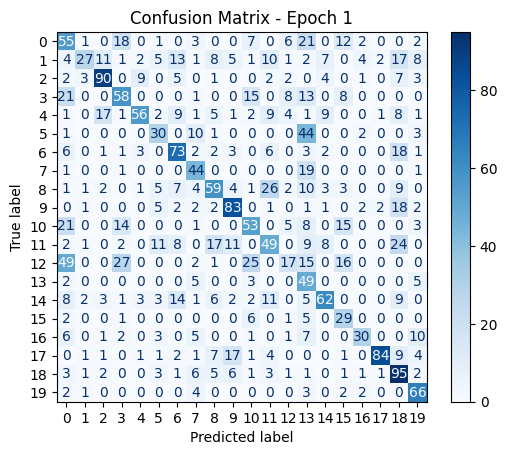

Epoch 1/45 - Train Loss: 2.1357, Train Acc: 0.3858, Val Loss: 1.8414, Val Acc: 0.4944, precision: 0.5280, recall: 0.5182, f1: 0.4933
Best model saved with val accuracy: 0.4944!
Epoch [2/45]

Epoch 2/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.0670, Accuracy: 52.34%
Batch 20/719, Loss: 1.5973, Accuracy: 50.16%
Batch 30/719, Loss: 1.7880, Accuracy: 50.10%
Batch 40/719, Loss: 1.8561, Accuracy: 49.69%
Batch 50/719, Loss: 1.8077, Accuracy: 50.31%
Batch 60/719, Loss: 1.8543, Accuracy: 49.84%
Batch 70/719, Loss: 1.5995, Accuracy: 49.91%
Batch 80/719, Loss: 1.8602, Accuracy: 49.90%
Batch 90/719, Loss: 1.7181, Accuracy: 49.95%
Batch 100/719, Loss: 2.0007, Accuracy: 49.69%
Batch 110/719, Loss: 1.8577, Accuracy: 49.86%
Batch 120/719, Loss: 1.6614, Accuracy: 50.08%
Batch 130/719, Loss: 1.7278, Accuracy: 50.16%
Batch 140/719, Loss: 1.8513, Accuracy: 50.32%
Batch 150/719, Loss: 1.7620, Accuracy: 50.34%
Batch 160/719, Loss: 1.7227, Accuracy: 50.57%
Batch 170/719, Loss: 1.5710, Accuracy: 50.48%

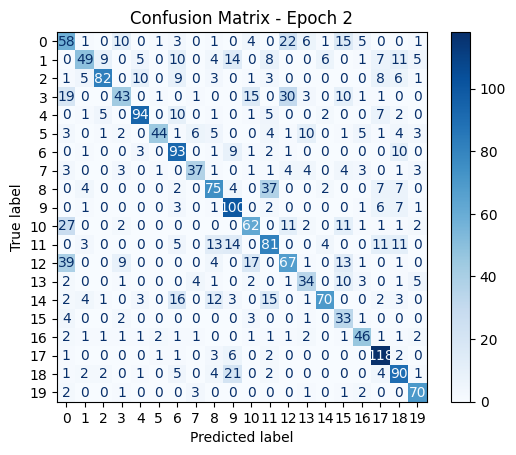

Epoch 2/45 - Train Loss: 1.7141, Train Acc: 0.5467, Val Loss: 1.5660, Val Acc: 0.6001, precision: 0.6230, recall: 0.6097, f1: 0.5998
Best model saved with val accuracy: 0.6001!
Epoch [3/45]

Epoch 3/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6788, Accuracy: 60.31%
Batch 20/719, Loss: 1.5244, Accuracy: 59.84%
Batch 30/719, Loss: 1.4156, Accuracy: 60.16%
Batch 40/719, Loss: 1.4740, Accuracy: 59.80%
Batch 50/719, Loss: 1.6739, Accuracy: 59.81%
Batch 60/719, Loss: 1.5671, Accuracy: 59.77%
Batch 70/719, Loss: 1.3776, Accuracy: 59.29%
Batch 80/719, Loss: 1.5850, Accuracy: 58.98%
Batch 90/719, Loss: 1.6992, Accuracy: 58.94%
Batch 100/719, Loss: 1.6822, Accuracy: 58.80%
Batch 110/719, Loss: 1.6227, Accuracy: 59.05%
Batch 120/719, Loss: 1.5303, Accuracy: 59.32%
Batch 130/719, Loss: 1.5682, Accuracy: 59.47%
Batch 140/719, Loss: 1.5878, Accuracy: 59.99%
Batch 150/719, Loss: 1.5388, Accuracy: 60.12%
Batch 160/719, Loss: 1.4711, Accuracy: 60.26%
Batch 170/719, Loss: 1.4431, Accuracy: 60.37%

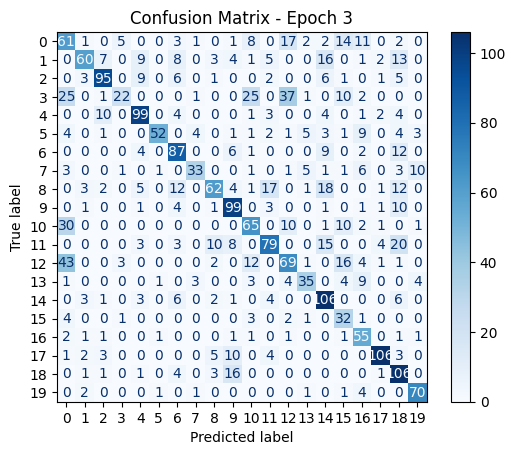

Epoch 3/45 - Train Loss: 1.5187, Train Acc: 0.6281, Val Loss: 1.5199, Val Acc: 0.6210, precision: 0.6504, recall: 0.6303, f1: 0.6165
Best model saved with val accuracy: 0.6210!
Epoch [4/45]

Epoch 4/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5204, Accuracy: 67.81%
Batch 20/719, Loss: 1.4635, Accuracy: 65.70%
Batch 30/719, Loss: 1.4789, Accuracy: 66.82%
Batch 40/719, Loss: 1.4596, Accuracy: 66.52%
Batch 50/719, Loss: 1.4399, Accuracy: 66.59%
Batch 60/719, Loss: 1.5461, Accuracy: 66.74%
Batch 70/719, Loss: 1.3073, Accuracy: 66.61%
Batch 80/719, Loss: 1.4652, Accuracy: 66.17%
Batch 90/719, Loss: 1.3151, Accuracy: 66.02%
Batch 100/719, Loss: 1.6643, Accuracy: 65.59%
Batch 110/719, Loss: 1.2999, Accuracy: 65.78%
Batch 120/719, Loss: 1.3050, Accuracy: 65.72%
Batch 130/719, Loss: 1.2086, Accuracy: 65.77%
Batch 140/719, Loss: 1.4819, Accuracy: 65.92%
Batch 150/719, Loss: 1.2520, Accuracy: 66.25%
Batch 160/719, Loss: 1.2489, Accuracy: 66.40%
Batch 170/719, Loss: 1.3651, Accuracy: 66.42%

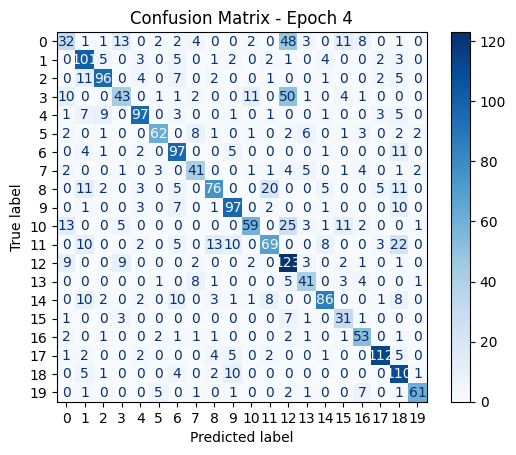

Epoch 4/45 - Train Loss: 1.4020, Train Acc: 0.6803, Val Loss: 1.4134, Val Acc: 0.6630, precision: 0.6771, recall: 0.6672, f1: 0.6594
Best model saved with val accuracy: 0.6630!
Epoch [5/45]

Epoch 5/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2844, Accuracy: 71.88%
Batch 20/719, Loss: 1.2959, Accuracy: 69.14%
Batch 30/719, Loss: 1.1813, Accuracy: 69.17%
Batch 40/719, Loss: 1.2799, Accuracy: 69.26%
Batch 50/719, Loss: 1.2812, Accuracy: 69.62%
Batch 60/719, Loss: 1.5423, Accuracy: 69.43%
Batch 70/719, Loss: 1.2127, Accuracy: 69.38%
Batch 80/719, Loss: 1.3497, Accuracy: 69.30%
Batch 90/719, Loss: 1.3636, Accuracy: 69.38%
Batch 100/719, Loss: 1.5854, Accuracy: 69.23%
Batch 110/719, Loss: 1.2838, Accuracy: 69.30%
Batch 120/719, Loss: 1.2526, Accuracy: 69.31%
Batch 130/719, Loss: 1.2363, Accuracy: 69.47%
Batch 140/719, Loss: 1.2460, Accuracy: 69.72%
Batch 150/719, Loss: 1.2545, Accuracy: 69.94%
Batch 160/719, Loss: 1.2069, Accuracy: 70.28%
Batch 170/719, Loss: 1.3016, Accuracy: 70.20%

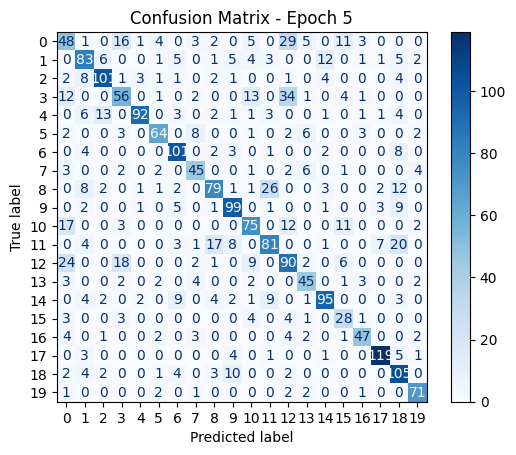

Epoch 5/45 - Train Loss: 1.3045, Train Acc: 0.7197, Val Loss: 1.3586, Val Acc: 0.6794, precision: 0.6841, recall: 0.6850, f1: 0.6810
Best model saved with val accuracy: 0.6794!
Epoch [6/45]

Epoch 6/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3751, Accuracy: 73.12%
Batch 20/719, Loss: 1.3266, Accuracy: 74.45%
Batch 30/719, Loss: 1.1728, Accuracy: 74.32%
Batch 40/719, Loss: 1.2557, Accuracy: 74.57%
Batch 50/719, Loss: 1.1442, Accuracy: 74.12%
Batch 60/719, Loss: 1.2514, Accuracy: 74.40%
Batch 70/719, Loss: 1.3465, Accuracy: 74.64%
Batch 80/719, Loss: 1.1265, Accuracy: 74.65%
Batch 90/719, Loss: 1.4327, Accuracy: 74.36%
Batch 100/719, Loss: 1.3931, Accuracy: 74.05%
Batch 110/719, Loss: 1.2755, Accuracy: 73.84%
Batch 120/719, Loss: 1.0976, Accuracy: 73.82%
Batch 130/719, Loss: 1.1899, Accuracy: 73.98%
Batch 140/719, Loss: 1.4055, Accuracy: 74.15%
Batch 150/719, Loss: 1.0935, Accuracy: 74.38%
Batch 160/719, Loss: 1.0807, Accuracy: 74.56%
Batch 170/719, Loss: 1.2715, Accuracy: 74.72%

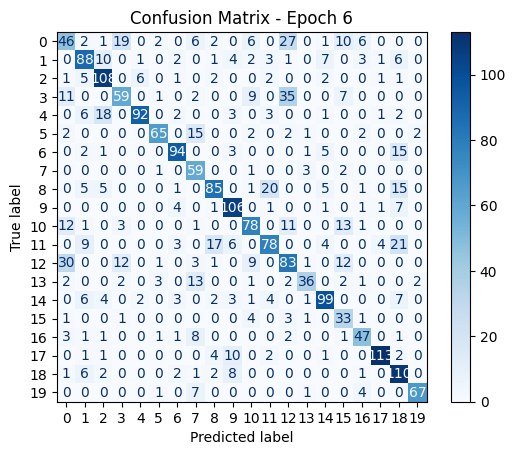

Epoch 6/45 - Train Loss: 1.2286, Train Acc: 0.7538, Val Loss: 1.3487, Val Acc: 0.6893, precision: 0.7019, recall: 0.6986, f1: 0.6901
Best model saved with val accuracy: 0.6893!
Epoch [7/45]

Epoch 7/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1554, Accuracy: 77.19%
Batch 20/719, Loss: 1.2379, Accuracy: 75.31%
Batch 30/719, Loss: 1.1047, Accuracy: 76.35%
Batch 40/719, Loss: 1.1986, Accuracy: 76.48%
Batch 50/719, Loss: 1.2141, Accuracy: 75.97%
Batch 60/719, Loss: 1.2277, Accuracy: 75.81%
Batch 70/719, Loss: 1.1518, Accuracy: 75.76%
Batch 80/719, Loss: 1.0740, Accuracy: 75.70%
Batch 90/719, Loss: 1.0587, Accuracy: 75.92%
Batch 100/719, Loss: 1.3910, Accuracy: 75.89%
Batch 110/719, Loss: 1.1816, Accuracy: 75.89%
Batch 120/719, Loss: 0.9168, Accuracy: 76.08%
Batch 130/719, Loss: 1.1545, Accuracy: 75.93%
Batch 140/719, Loss: 1.1706, Accuracy: 76.27%
Batch 150/719, Loss: 1.2156, Accuracy: 76.24%
Batch 160/719, Loss: 1.0317, Accuracy: 76.48%
Batch 170/719, Loss: 1.1356, Accuracy: 76.53%

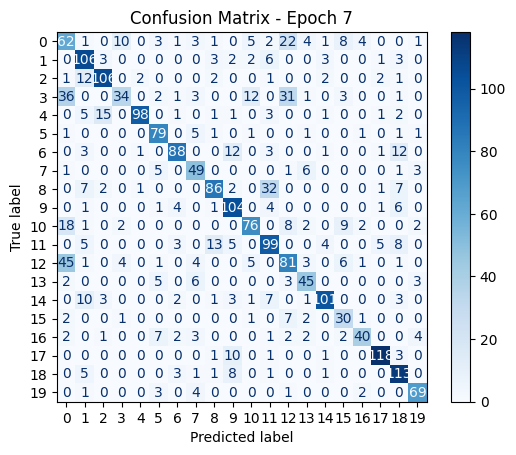

Epoch 7/45 - Train Loss: 1.1768, Train Acc: 0.7723, Val Loss: 1.3109, Val Acc: 0.7062, precision: 0.7168, recall: 0.7097, f1: 0.7043
Best model saved with val accuracy: 0.7062!
Epoch [8/45]

Epoch 8/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1006, Accuracy: 81.09%
Batch 20/719, Loss: 1.2102, Accuracy: 79.14%
Batch 30/719, Loss: 0.9779, Accuracy: 79.53%
Batch 40/719, Loss: 1.0794, Accuracy: 79.30%
Batch 50/719, Loss: 1.0389, Accuracy: 79.22%
Batch 60/719, Loss: 1.1627, Accuracy: 79.27%
Batch 70/719, Loss: 1.1567, Accuracy: 79.20%
Batch 80/719, Loss: 1.1414, Accuracy: 78.77%
Batch 90/719, Loss: 1.0620, Accuracy: 78.77%
Batch 100/719, Loss: 1.2325, Accuracy: 78.59%
Batch 110/719, Loss: 1.0595, Accuracy: 78.72%
Batch 120/719, Loss: 1.0897, Accuracy: 78.85%
Batch 130/719, Loss: 1.1302, Accuracy: 78.85%
Batch 140/719, Loss: 1.0614, Accuracy: 78.90%
Batch 150/719, Loss: 1.1400, Accuracy: 78.89%
Batch 160/719, Loss: 1.2124, Accuracy: 78.92%
Batch 170/719, Loss: 1.0253, Accuracy: 78.88%

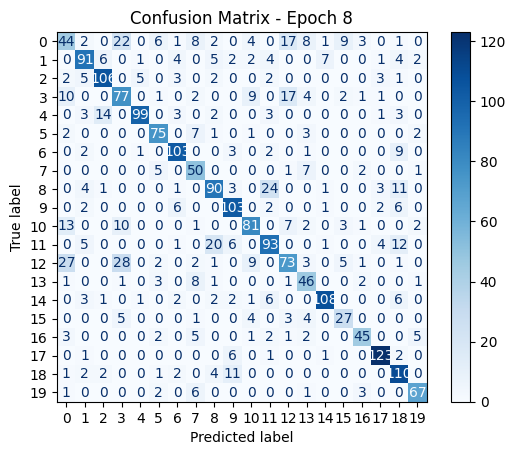

Epoch 8/45 - Train Loss: 1.1216, Train Acc: 0.7947, Val Loss: 1.2843, Val Acc: 0.7182, precision: 0.7140, recall: 0.7210, f1: 0.7142
Best model saved with val accuracy: 0.7182!
Epoch [9/45]

Epoch 9/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2103, Accuracy: 80.62%
Batch 20/719, Loss: 1.0466, Accuracy: 80.47%
Batch 30/719, Loss: 1.0363, Accuracy: 81.09%
Batch 40/719, Loss: 1.0316, Accuracy: 80.94%
Batch 50/719, Loss: 1.0046, Accuracy: 80.69%
Batch 60/719, Loss: 0.9523, Accuracy: 80.73%
Batch 70/719, Loss: 1.1580, Accuracy: 80.80%
Batch 80/719, Loss: 1.1115, Accuracy: 80.94%
Batch 90/719, Loss: 1.0303, Accuracy: 80.78%
Batch 100/719, Loss: 1.1320, Accuracy: 80.77%
Batch 110/719, Loss: 1.0666, Accuracy: 80.82%
Batch 120/719, Loss: 1.0071, Accuracy: 80.81%
Batch 130/719, Loss: 0.9459, Accuracy: 80.82%
Batch 140/719, Loss: 1.0835, Accuracy: 81.02%
Batch 150/719, Loss: 1.2423, Accuracy: 81.03%
Batch 160/719, Loss: 1.1060, Accuracy: 81.08%
Batch 170/719, Loss: 1.0660, Accuracy: 81.19%

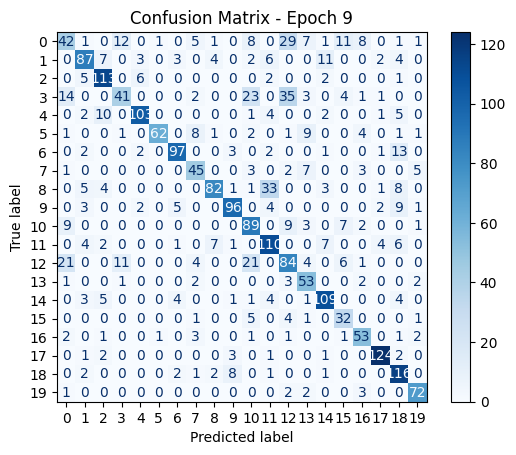

Epoch 9/45 - Train Loss: 1.0715, Train Acc: 0.8172, Val Loss: 1.3063, Val Acc: 0.7178, precision: 0.7205, recall: 0.7255, f1: 0.7138
Epoch [10/45]

Epoch 10/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9295, Accuracy: 83.59%
Batch 20/719, Loss: 1.0834, Accuracy: 81.48%
Batch 30/719, Loss: 0.8831, Accuracy: 81.98%
Batch 40/719, Loss: 1.0018, Accuracy: 81.99%
Batch 50/719, Loss: 0.9297, Accuracy: 81.97%
Batch 60/719, Loss: 1.1853, Accuracy: 82.06%
Batch 70/719, Loss: 1.0580, Accuracy: 81.90%
Batch 80/719, Loss: 0.9837, Accuracy: 81.80%
Batch 90/719, Loss: 0.9373, Accuracy: 82.10%
Batch 100/719, Loss: 1.3456, Accuracy: 81.97%
Batch 110/719, Loss: 1.0114, Accuracy: 82.16%
Batch 120/719, Loss: 1.0913, Accuracy: 81.98%
Batch 130/719, Loss: 0.9541, Accuracy: 82.09%
Batch 140/719, Loss: 1.0477, Accuracy: 82.17%
Batch 150/719, Loss: 0.9752, Accuracy: 82.38%
Batch 160/719, Loss: 0.9804, Accuracy: 82.46%
Batch 170/719, Loss: 1.0175, Accuracy: 82.45%
Batch 180/719, Loss: 0.9364, Accuracy: 82

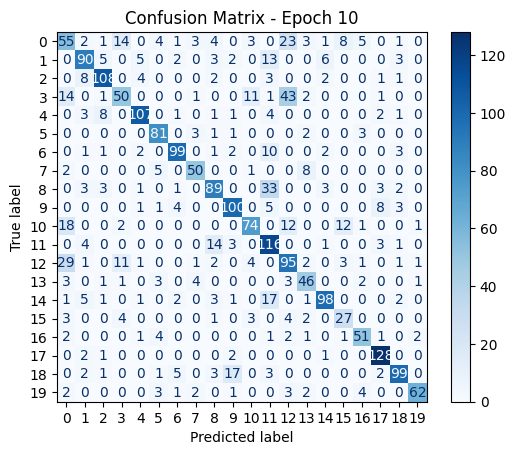

Epoch 10/45 - Train Loss: 1.0424, Train Acc: 0.8303, Val Loss: 1.3056, Val Acc: 0.7245, precision: 0.7343, recall: 0.7257, f1: 0.7257
Best model saved with val accuracy: 0.7245!
Epoch [11/45]

Epoch 11/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0739, Accuracy: 83.44%
Batch 20/719, Loss: 0.9484, Accuracy: 82.97%
Batch 30/719, Loss: 0.8702, Accuracy: 83.23%
Batch 40/719, Loss: 1.0031, Accuracy: 83.24%
Batch 50/719, Loss: 0.9273, Accuracy: 83.38%
Batch 60/719, Loss: 1.0551, Accuracy: 83.52%
Batch 70/719, Loss: 0.9722, Accuracy: 83.57%
Batch 80/719, Loss: 0.8675, Accuracy: 83.59%
Batch 90/719, Loss: 0.9098, Accuracy: 83.65%
Batch 100/719, Loss: 1.2715, Accuracy: 83.78%
Batch 110/719, Loss: 1.0381, Accuracy: 83.85%
Batch 120/719, Loss: 0.9535, Accuracy: 83.85%
Batch 130/719, Loss: 1.0631, Accuracy: 83.94%
Batch 140/719, Loss: 0.9593, Accuracy: 84.22%
Batch 150/719, Loss: 1.1350, Accuracy: 84.29%
Batch 160/719, Loss: 0.9420, Accuracy: 84.27%
Batch 170/719, Loss: 0.9901, Accuracy: 84.

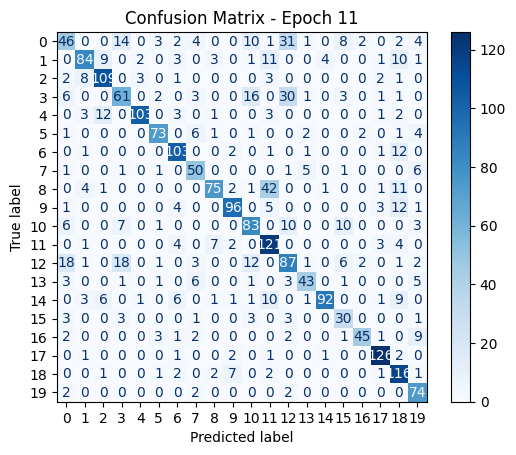

Epoch 11/45 - Train Loss: 1.0091, Train Acc: 0.8417, Val Loss: 1.3158, Val Acc: 0.7209, precision: 0.7323, recall: 0.7240, f1: 0.7191
Epoch [12/45]

Epoch 12/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0002, Accuracy: 84.69%
Batch 20/719, Loss: 0.9581, Accuracy: 84.38%
Batch 30/719, Loss: 0.9170, Accuracy: 84.32%
Batch 40/719, Loss: 1.0257, Accuracy: 84.53%
Batch 50/719, Loss: 0.9503, Accuracy: 84.34%
Batch 60/719, Loss: 0.9965, Accuracy: 84.45%
Batch 70/719, Loss: 0.9917, Accuracy: 84.11%
Batch 80/719, Loss: 0.9350, Accuracy: 83.95%
Batch 90/719, Loss: 1.0236, Accuracy: 83.87%
Batch 100/719, Loss: 1.0608, Accuracy: 84.17%
Batch 110/719, Loss: 1.0108, Accuracy: 84.39%
Batch 120/719, Loss: 0.8503, Accuracy: 84.35%
Batch 130/719, Loss: 0.8736, Accuracy: 84.42%
Batch 140/719, Loss: 0.9548, Accuracy: 84.65%
Batch 150/719, Loss: 0.9404, Accuracy: 84.82%
Batch 160/719, Loss: 0.8625, Accuracy: 84.98%
Batch 170/719, Loss: 1.0106, Accuracy: 85.10%
Batch 180/719, Loss: 1.0033, Accuracy: 8

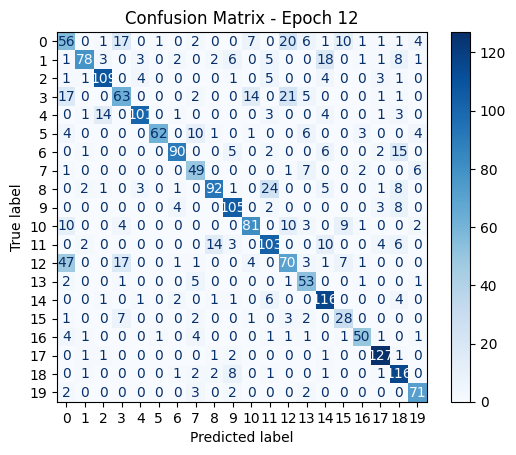

Epoch 12/45 - Train Loss: 0.9850, Train Acc: 0.8528, Val Loss: 1.2903, Val Acc: 0.7222, precision: 0.7300, recall: 0.7274, f1: 0.7216
Epoch [13/45]

Epoch 13/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9543, Accuracy: 86.88%
Batch 20/719, Loss: 1.1115, Accuracy: 86.33%
Batch 30/719, Loss: 0.9260, Accuracy: 87.29%
Batch 40/719, Loss: 0.8618, Accuracy: 87.19%
Batch 50/719, Loss: 0.8469, Accuracy: 87.03%
Batch 60/719, Loss: 1.0105, Accuracy: 86.59%
Batch 70/719, Loss: 0.8801, Accuracy: 86.27%
Batch 80/719, Loss: 1.1075, Accuracy: 86.15%
Batch 90/719, Loss: 0.8388, Accuracy: 86.37%
Batch 100/719, Loss: 1.0520, Accuracy: 86.22%
Batch 110/719, Loss: 1.0596, Accuracy: 86.22%
Batch 120/719, Loss: 0.8968, Accuracy: 86.16%
Batch 130/719, Loss: 0.9003, Accuracy: 86.00%
Batch 140/719, Loss: 1.0454, Accuracy: 86.04%
Batch 150/719, Loss: 0.9966, Accuracy: 86.23%
Batch 160/719, Loss: 0.9714, Accuracy: 86.28%
Batch 170/719, Loss: 0.9477, Accuracy: 86.34%
Batch 180/719, Loss: 0.9226, Accuracy: 8

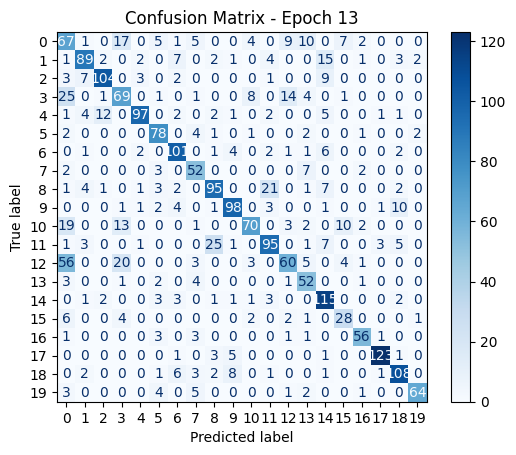

Epoch 13/45 - Train Loss: 0.9599, Train Acc: 0.8623, Val Loss: 1.3171, Val Acc: 0.7227, precision: 0.7334, recall: 0.7325, f1: 0.7267
Epoch [14/45]

Epoch 14/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0595, Accuracy: 86.25%
Batch 20/719, Loss: 0.9756, Accuracy: 85.86%
Batch 30/719, Loss: 1.0030, Accuracy: 85.62%
Batch 40/719, Loss: 1.0523, Accuracy: 85.78%
Batch 50/719, Loss: 0.8611, Accuracy: 85.72%
Batch 60/719, Loss: 0.8906, Accuracy: 86.25%
Batch 70/719, Loss: 0.8519, Accuracy: 86.41%
Batch 80/719, Loss: 0.9157, Accuracy: 86.39%
Batch 90/719, Loss: 0.8620, Accuracy: 86.30%
Batch 100/719, Loss: 1.0241, Accuracy: 86.31%
Batch 110/719, Loss: 0.8543, Accuracy: 86.41%
Batch 120/719, Loss: 0.8789, Accuracy: 86.48%
Batch 130/719, Loss: 0.9717, Accuracy: 86.53%
Batch 140/719, Loss: 1.0231, Accuracy: 86.47%
Batch 150/719, Loss: 0.9809, Accuracy: 86.51%
Batch 160/719, Loss: 0.7493, Accuracy: 86.68%
Batch 170/719, Loss: 0.8998, Accuracy: 86.67%
Batch 180/719, Loss: 0.9345, Accuracy: 8

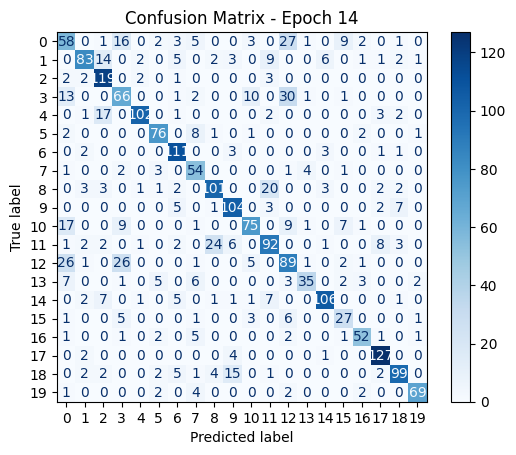

Epoch 14/45 - Train Loss: 0.9407, Train Acc: 0.8704, Val Loss: 1.2862, Val Acc: 0.7334, precision: 0.7415, recall: 0.7334, f1: 0.7326
Best model saved with val accuracy: 0.7334!
Epoch [15/45]

Epoch 15/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9575, Accuracy: 88.59%
Batch 20/719, Loss: 1.1925, Accuracy: 86.56%
Batch 30/719, Loss: 0.8971, Accuracy: 86.72%
Batch 40/719, Loss: 0.7818, Accuracy: 87.38%
Batch 50/719, Loss: 0.8862, Accuracy: 87.62%
Batch 60/719, Loss: 0.9615, Accuracy: 87.40%
Batch 70/719, Loss: 0.9213, Accuracy: 87.50%
Batch 80/719, Loss: 1.0109, Accuracy: 87.38%
Batch 90/719, Loss: 0.9161, Accuracy: 87.50%
Batch 100/719, Loss: 1.1012, Accuracy: 87.44%
Batch 110/719, Loss: 0.9001, Accuracy: 87.23%
Batch 120/719, Loss: 0.7851, Accuracy: 87.30%
Batch 130/719, Loss: 0.9020, Accuracy: 87.34%
Batch 140/719, Loss: 0.8643, Accuracy: 87.59%
Batch 150/719, Loss: 0.8890, Accuracy: 87.67%
Batch 160/719, Loss: 0.8279, Accuracy: 87.78%
Batch 170/719, Loss: 0.8147, Accuracy: 87.

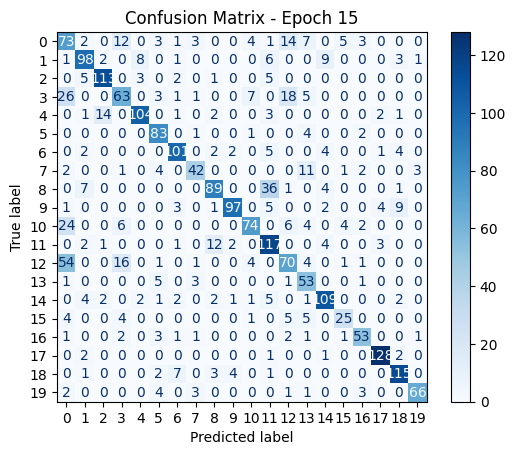

Epoch 15/45 - Train Loss: 0.9194, Train Acc: 0.8784, Val Loss: 1.2803, Val Acc: 0.7459, precision: 0.7581, recall: 0.7460, f1: 0.7462
Best model saved with val accuracy: 0.7459!
Epoch [16/45]

Epoch 16/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0577, Accuracy: 84.84%
Batch 20/719, Loss: 0.9887, Accuracy: 84.92%
Batch 30/719, Loss: 0.8062, Accuracy: 86.04%
Batch 40/719, Loss: 0.8619, Accuracy: 86.64%
Batch 50/719, Loss: 0.8708, Accuracy: 87.19%
Batch 60/719, Loss: 0.9293, Accuracy: 87.21%
Batch 70/719, Loss: 0.8255, Accuracy: 87.70%
Batch 80/719, Loss: 0.9091, Accuracy: 87.66%
Batch 90/719, Loss: 1.0152, Accuracy: 87.64%
Batch 100/719, Loss: 1.0646, Accuracy: 87.56%
Batch 110/719, Loss: 0.8343, Accuracy: 87.60%
Batch 120/719, Loss: 0.7179, Accuracy: 87.62%
Batch 130/719, Loss: 0.7787, Accuracy: 87.62%
Batch 140/719, Loss: 0.9044, Accuracy: 87.70%
Batch 150/719, Loss: 0.9854, Accuracy: 87.65%
Batch 160/719, Loss: 0.9146, Accuracy: 87.80%
Batch 170/719, Loss: 1.0349, Accuracy: 87.

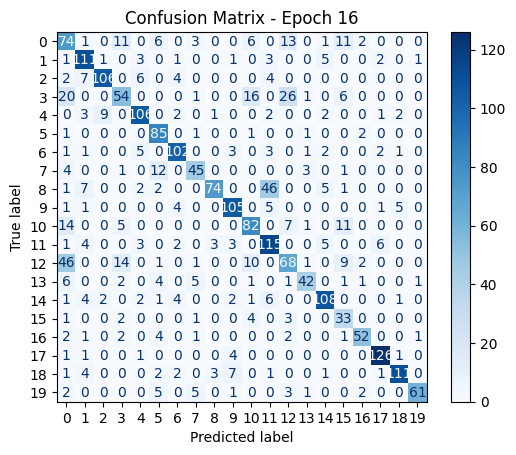

Epoch 16/45 - Train Loss: 0.9052, Train Acc: 0.8827, Val Loss: 1.2858, Val Acc: 0.7401, precision: 0.7543, recall: 0.7435, f1: 0.7400
Epoch [17/45]

Epoch 17/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0716, Accuracy: 88.12%
Batch 20/719, Loss: 0.9457, Accuracy: 87.19%
Batch 30/719, Loss: 0.8514, Accuracy: 87.66%
Batch 40/719, Loss: 0.9765, Accuracy: 88.05%
Batch 50/719, Loss: 0.7907, Accuracy: 87.94%
Batch 60/719, Loss: 0.8688, Accuracy: 88.02%
Batch 70/719, Loss: 0.7892, Accuracy: 88.59%
Batch 80/719, Loss: 0.8564, Accuracy: 88.65%
Batch 90/719, Loss: 0.8188, Accuracy: 88.92%
Batch 100/719, Loss: 1.0050, Accuracy: 88.80%
Batch 110/719, Loss: 0.9194, Accuracy: 89.03%
Batch 120/719, Loss: 0.8175, Accuracy: 89.18%
Batch 130/719, Loss: 0.8067, Accuracy: 88.98%
Batch 140/719, Loss: 0.8417, Accuracy: 89.06%
Batch 150/719, Loss: 0.8668, Accuracy: 89.15%
Batch 160/719, Loss: 0.8622, Accuracy: 89.21%
Batch 170/719, Loss: 0.8669, Accuracy: 89.21%
Batch 180/719, Loss: 0.8849, Accuracy: 8

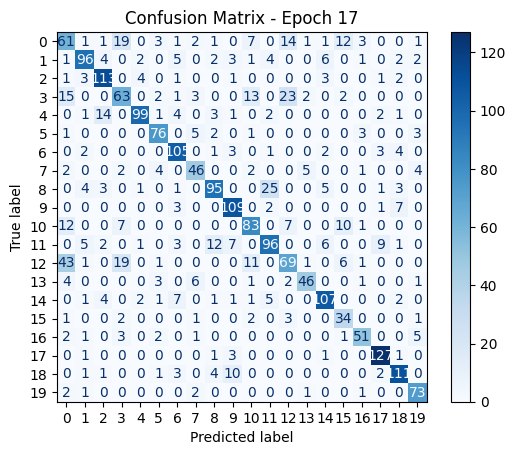

Epoch 17/45 - Train Loss: 0.8884, Train Acc: 0.8893, Val Loss: 1.2663, Val Acc: 0.7401, precision: 0.7400, recall: 0.7476, f1: 0.7407
Epoch [18/45]

Epoch 18/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8091, Accuracy: 90.62%
Batch 20/719, Loss: 0.9429, Accuracy: 88.98%
Batch 30/719, Loss: 0.9344, Accuracy: 89.22%
Batch 40/719, Loss: 0.7798, Accuracy: 89.53%
Batch 50/719, Loss: 0.9397, Accuracy: 89.34%
Batch 60/719, Loss: 0.9232, Accuracy: 89.24%
Batch 70/719, Loss: 0.7609, Accuracy: 89.17%
Batch 80/719, Loss: 0.7555, Accuracy: 89.18%
Batch 90/719, Loss: 0.9609, Accuracy: 89.06%
Batch 100/719, Loss: 1.0450, Accuracy: 88.97%
Batch 110/719, Loss: 0.8347, Accuracy: 88.91%
Batch 120/719, Loss: 0.8571, Accuracy: 88.87%
Batch 130/719, Loss: 0.8889, Accuracy: 88.86%
Batch 140/719, Loss: 0.8016, Accuracy: 89.00%
Batch 150/719, Loss: 0.8427, Accuracy: 89.02%
Batch 160/719, Loss: 0.7432, Accuracy: 89.20%
Batch 170/719, Loss: 0.8984, Accuracy: 89.27%
Batch 180/719, Loss: 0.8332, Accuracy: 8

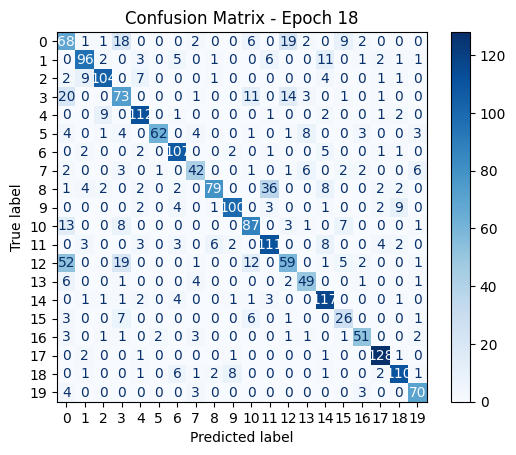

Epoch 18/45 - Train Loss: 0.8740, Train Acc: 0.8941, Val Loss: 1.3122, Val Acc: 0.7361, precision: 0.7433, recall: 0.7354, f1: 0.7338
Epoch [19/45]

Epoch 19/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8102, Accuracy: 90.62%
Batch 20/719, Loss: 0.8731, Accuracy: 90.31%
Batch 30/719, Loss: 0.7990, Accuracy: 90.31%
Batch 40/719, Loss: 0.8816, Accuracy: 90.31%
Batch 50/719, Loss: 0.8557, Accuracy: 89.97%
Batch 60/719, Loss: 0.9247, Accuracy: 89.69%
Batch 70/719, Loss: 0.8001, Accuracy: 89.87%
Batch 80/719, Loss: 0.7931, Accuracy: 89.75%
Batch 90/719, Loss: 0.7194, Accuracy: 89.58%
Batch 100/719, Loss: 1.0528, Accuracy: 89.42%
Batch 110/719, Loss: 0.8171, Accuracy: 89.53%
Batch 120/719, Loss: 0.8226, Accuracy: 89.56%
Batch 130/719, Loss: 0.7683, Accuracy: 89.63%
Batch 140/719, Loss: 0.8990, Accuracy: 89.65%
Batch 150/719, Loss: 0.9127, Accuracy: 89.70%
Batch 160/719, Loss: 0.7857, Accuracy: 89.69%
Batch 170/719, Loss: 0.7525, Accuracy: 89.72%
Batch 180/719, Loss: 0.9442, Accuracy: 8

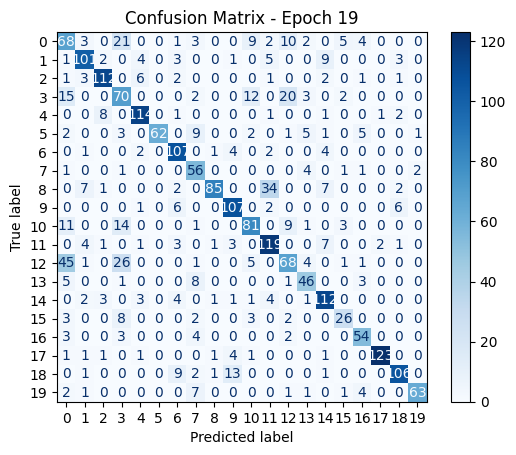

Epoch 19/45 - Train Loss: 0.8628, Train Acc: 0.8990, Val Loss: 1.2897, Val Acc: 0.7490, precision: 0.7623, recall: 0.7492, f1: 0.7489
Best model saved with val accuracy: 0.7490!
Epoch [20/45]

Epoch 20/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7896, Accuracy: 91.25%
Batch 20/719, Loss: 0.8266, Accuracy: 91.02%
Batch 30/719, Loss: 0.8672, Accuracy: 90.78%
Batch 40/719, Loss: 0.8298, Accuracy: 90.94%
Batch 50/719, Loss: 0.6873, Accuracy: 90.84%
Batch 60/719, Loss: 0.8704, Accuracy: 90.76%
Batch 70/719, Loss: 0.7917, Accuracy: 90.71%
Batch 80/719, Loss: 0.7453, Accuracy: 90.68%
Batch 90/719, Loss: 0.8761, Accuracy: 90.68%
Batch 100/719, Loss: 0.9871, Accuracy: 90.53%
Batch 110/719, Loss: 0.7405, Accuracy: 90.60%
Batch 120/719, Loss: 0.8563, Accuracy: 90.53%
Batch 130/719, Loss: 0.7945, Accuracy: 90.50%
Batch 140/719, Loss: 1.0509, Accuracy: 90.48%
Batch 150/719, Loss: 0.9511, Accuracy: 90.50%
Batch 160/719, Loss: 0.7896, Accuracy: 90.51%
Batch 170/719, Loss: 0.8024, Accuracy: 90.

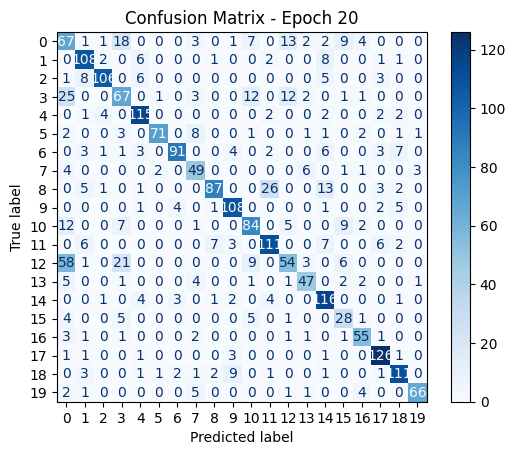

Epoch 20/45 - Train Loss: 0.8509, Train Acc: 0.9035, Val Loss: 1.3046, Val Acc: 0.7432, precision: 0.7519, recall: 0.7466, f1: 0.7433
Epoch [21/45]

Epoch 21/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8385, Accuracy: 91.72%
Batch 20/719, Loss: 0.8231, Accuracy: 90.47%
Batch 30/719, Loss: 0.7924, Accuracy: 90.16%
Batch 40/719, Loss: 0.7362, Accuracy: 90.31%
Batch 50/719, Loss: 0.8580, Accuracy: 90.19%
Batch 60/719, Loss: 0.9217, Accuracy: 90.26%
Batch 70/719, Loss: 0.7791, Accuracy: 90.25%
Batch 80/719, Loss: 0.8006, Accuracy: 90.41%
Batch 90/719, Loss: 0.7659, Accuracy: 90.54%
Batch 100/719, Loss: 0.9683, Accuracy: 90.50%
Batch 110/719, Loss: 0.9227, Accuracy: 90.45%
Batch 120/719, Loss: 0.9590, Accuracy: 90.44%
Batch 130/719, Loss: 0.8300, Accuracy: 90.46%
Batch 140/719, Loss: 0.7685, Accuracy: 90.49%
Batch 150/719, Loss: 0.8240, Accuracy: 90.61%
Batch 160/719, Loss: 0.7899, Accuracy: 90.62%
Batch 170/719, Loss: 0.8129, Accuracy: 90.56%
Batch 180/719, Loss: 0.8557, Accuracy: 9

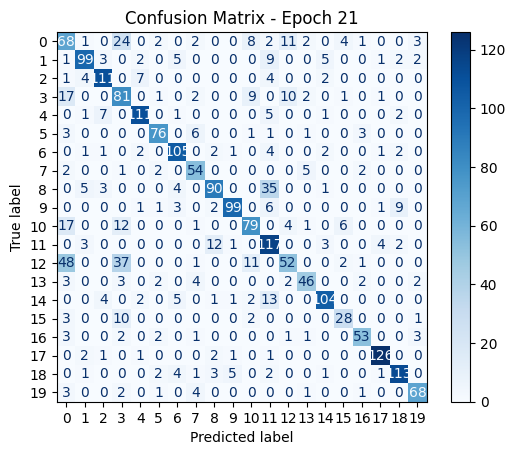

Epoch 21/45 - Train Loss: 0.8398, Train Acc: 0.9083, Val Loss: 1.2970, Val Acc: 0.7490, precision: 0.7675, recall: 0.7537, f1: 0.7549
Epoch [22/45]

Epoch 22/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7821, Accuracy: 92.34%
Batch 20/719, Loss: 0.8287, Accuracy: 91.48%
Batch 30/719, Loss: 0.7782, Accuracy: 91.25%
Batch 40/719, Loss: 0.8577, Accuracy: 90.94%
Batch 50/719, Loss: 0.7937, Accuracy: 90.88%
Batch 60/719, Loss: 0.8448, Accuracy: 90.52%
Batch 70/719, Loss: 0.7456, Accuracy: 90.98%
Batch 80/719, Loss: 0.8323, Accuracy: 91.00%
Batch 90/719, Loss: 0.7867, Accuracy: 91.08%
Batch 100/719, Loss: 1.0687, Accuracy: 90.75%
Batch 110/719, Loss: 0.8899, Accuracy: 90.65%
Batch 120/719, Loss: 0.7146, Accuracy: 90.81%
Batch 130/719, Loss: 0.8301, Accuracy: 90.78%
Batch 140/719, Loss: 0.7514, Accuracy: 90.87%
Batch 150/719, Loss: 0.8583, Accuracy: 90.93%
Batch 160/719, Loss: 0.9791, Accuracy: 90.99%
Batch 170/719, Loss: 0.8306, Accuracy: 90.96%
Batch 180/719, Loss: 0.7474, Accuracy: 9

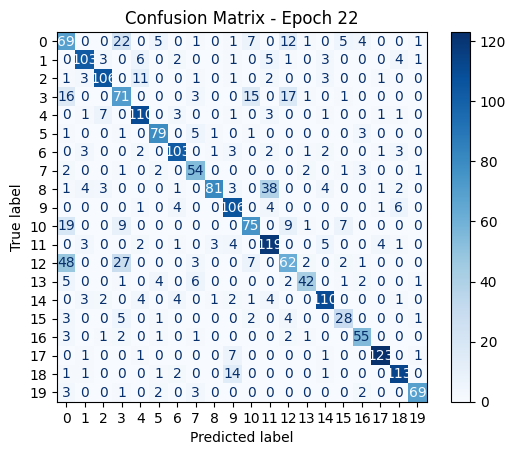

Epoch 22/45 - Train Loss: 0.8327, Train Acc: 0.9111, Val Loss: 1.3022, Val Acc: 0.7481, precision: 0.7608, recall: 0.7522, f1: 0.7516
Epoch [23/45]

Epoch 23/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9664, Accuracy: 91.88%
Batch 20/719, Loss: 0.8173, Accuracy: 91.72%
Batch 30/719, Loss: 0.8108, Accuracy: 91.46%
Batch 40/719, Loss: 0.8131, Accuracy: 91.48%
Batch 50/719, Loss: 0.7979, Accuracy: 91.34%
Batch 60/719, Loss: 0.7954, Accuracy: 91.46%
Batch 70/719, Loss: 0.8371, Accuracy: 91.34%
Batch 80/719, Loss: 0.8729, Accuracy: 91.35%
Batch 90/719, Loss: 0.8580, Accuracy: 91.46%
Batch 100/719, Loss: 0.9535, Accuracy: 91.27%
Batch 110/719, Loss: 0.7382, Accuracy: 91.24%
Batch 120/719, Loss: 0.7860, Accuracy: 91.20%
Batch 130/719, Loss: 0.7494, Accuracy: 91.25%
Batch 140/719, Loss: 0.7476, Accuracy: 91.24%
Batch 150/719, Loss: 0.8798, Accuracy: 91.34%
Batch 160/719, Loss: 0.7285, Accuracy: 91.42%
Batch 170/719, Loss: 0.8895, Accuracy: 91.42%
Batch 180/719, Loss: 0.7806, Accuracy: 9

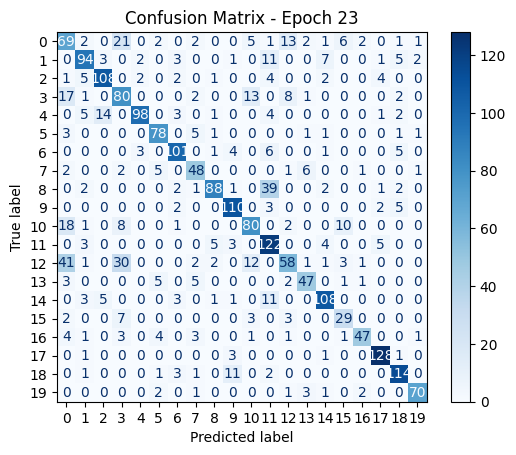

Epoch 23/45 - Train Loss: 0.8250, Train Acc: 0.9131, Val Loss: 1.3164, Val Acc: 0.7477, precision: 0.7601, recall: 0.7496, f1: 0.7491
Epoch [24/45]

Epoch 24/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7894, Accuracy: 92.81%
Batch 20/719, Loss: 0.8073, Accuracy: 91.80%
Batch 30/719, Loss: 0.7193, Accuracy: 91.88%
Batch 40/719, Loss: 0.8207, Accuracy: 91.88%
Batch 50/719, Loss: 0.7299, Accuracy: 91.69%
Batch 60/719, Loss: 0.8641, Accuracy: 91.74%
Batch 70/719, Loss: 0.7489, Accuracy: 91.81%
Batch 80/719, Loss: 0.6928, Accuracy: 91.88%
Batch 90/719, Loss: 0.7810, Accuracy: 91.94%
Batch 100/719, Loss: 0.9387, Accuracy: 91.88%
Batch 110/719, Loss: 0.9200, Accuracy: 92.07%
Batch 120/719, Loss: 0.7388, Accuracy: 92.14%
Batch 130/719, Loss: 0.7073, Accuracy: 92.02%
Batch 140/719, Loss: 0.9184, Accuracy: 92.08%
Batch 150/719, Loss: 0.9182, Accuracy: 92.09%
Batch 160/719, Loss: 0.7934, Accuracy: 92.14%
Batch 170/719, Loss: 0.8099, Accuracy: 92.14%
Batch 180/719, Loss: 0.8108, Accuracy: 9

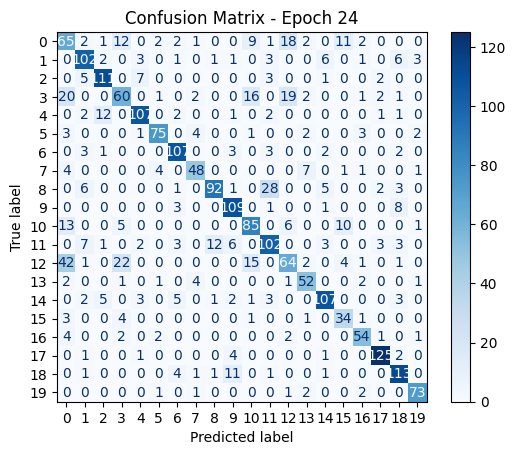

Epoch 24/45 - Train Loss: 0.8125, Train Acc: 0.9186, Val Loss: 1.2690, Val Acc: 0.7512, precision: 0.7539, recall: 0.7616, f1: 0.7548
Best model saved with val accuracy: 0.7512!
Epoch [25/45]

Epoch 25/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8761, Accuracy: 94.06%
Batch 20/719, Loss: 0.7917, Accuracy: 93.20%
Batch 30/719, Loss: 0.7713, Accuracy: 92.50%
Batch 40/719, Loss: 0.7930, Accuracy: 92.27%
Batch 50/719, Loss: 0.7193, Accuracy: 92.59%
Batch 60/719, Loss: 0.9241, Accuracy: 92.40%
Batch 70/719, Loss: 0.7942, Accuracy: 92.39%
Batch 80/719, Loss: 0.8202, Accuracy: 92.34%
Batch 90/719, Loss: 0.7724, Accuracy: 92.33%
Batch 100/719, Loss: 0.9184, Accuracy: 92.17%
Batch 110/719, Loss: 0.8617, Accuracy: 92.09%
Batch 120/719, Loss: 0.8562, Accuracy: 92.21%
Batch 130/719, Loss: 0.9148, Accuracy: 92.12%
Batch 140/719, Loss: 0.7937, Accuracy: 92.13%
Batch 150/719, Loss: 0.7738, Accuracy: 92.12%
Batch 160/719, Loss: 0.8446, Accuracy: 92.03%
Batch 170/719, Loss: 0.7260, Accuracy: 92.

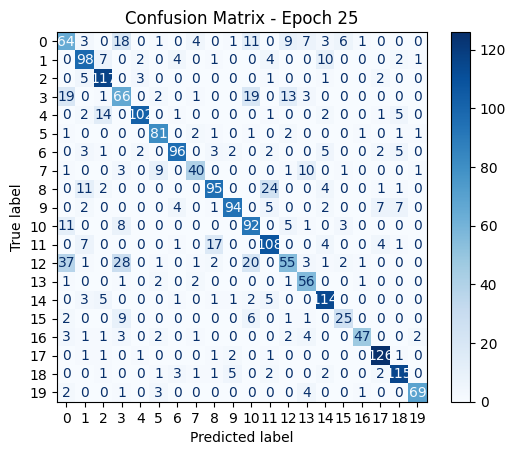

Epoch 25/45 - Train Loss: 0.8038, Train Acc: 0.9212, Val Loss: 1.3041, Val Acc: 0.7401, precision: 0.7504, recall: 0.7410, f1: 0.7397


In [7]:
model = resnetModel
num_epochs = 45
criterion = LabelSmoothingCrossEntropy(smoothing=0.10)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.009)
scheduler = OneCycleLR(optimizer, max_lr=0.01,
                       steps_per_epoch=len(train_loader), epochs=num_epochs,
                       pct_start=0.2, div_factor=25.0, final_div_factor=1e4)
scaler = GradScaler()
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

historyResnet, modelResnet = train_classification_model(model, train_loader, val_loader,0, optimizer, criterion,
                              scheduler=scheduler, num_epochs=num_epochs, device='cuda',
                              use_mixed_precision=False, patience=10, model_name="resnetModel")

Total parameters: 11,250,988
Epoch [1/45]

Epoch 1/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.7232, Accuracy: 11.41%
Batch 20/719, Loss: 2.7227, Accuracy: 13.20%
Batch 30/719, Loss: 2.6032, Accuracy: 14.48%
Batch 40/719, Loss: 2.5936, Accuracy: 15.74%
Batch 50/719, Loss: 2.6432, Accuracy: 17.22%
Batch 60/719, Loss: 2.4158, Accuracy: 18.49%
Batch 70/719, Loss: 2.5287, Accuracy: 19.42%
Batch 80/719, Loss: 2.4715, Accuracy: 20.31%
Batch 90/719, Loss: 2.7307, Accuracy: 20.99%
Batch 100/719, Loss: 2.5574, Accuracy: 21.42%
Batch 110/719, Loss: 2.5626, Accuracy: 22.02%
Batch 120/719, Loss: 2.3997, Accuracy: 22.64%
Batch 130/719, Loss: 2.4022, Accuracy: 22.99%
Batch 140/719, Loss: 2.2460, Accuracy: 23.49%
Batch 150/719, Loss: 2.2209, Accuracy: 24.09%
Batch 160/719, Loss: 2.4496, Accuracy: 24.45%
Batch 170/719, Loss: 2.2567, Accuracy: 24.99%
Batch 180/719, Loss: 2.2617, Accuracy: 25.33%
Batch 190/719, Loss: 2.2475, Accuracy: 25.68%
Batch 200/719, Loss: 2.1739, Accuracy: 25.95%
Batch 210

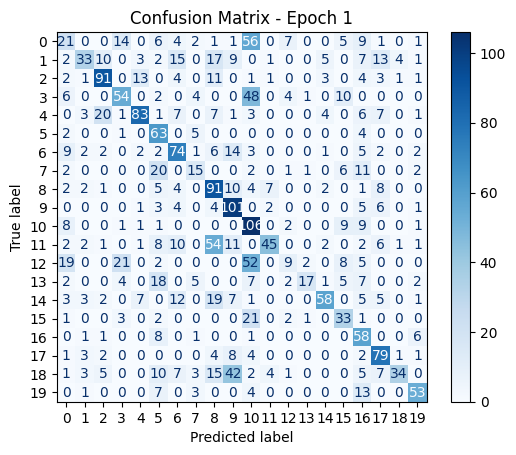

Epoch 1/45 - Train Loss: 2.1322, Train Acc: 0.3863, Val Loss: 1.8077, Val Acc: 0.4984, precision: 0.5446, recall: 0.5019, f1: 0.4767
Best model saved with val accuracy: 0.4984!
Epoch [2/45]

Epoch 2/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8255, Accuracy: 50.62%
Batch 20/719, Loss: 1.8244, Accuracy: 48.83%
Batch 30/719, Loss: 2.0311, Accuracy: 47.71%
Batch 40/719, Loss: 1.7280, Accuracy: 47.58%
Batch 50/719, Loss: 1.9148, Accuracy: 48.00%
Batch 60/719, Loss: 1.8233, Accuracy: 47.89%
Batch 70/719, Loss: 1.9590, Accuracy: 48.35%
Batch 80/719, Loss: 1.8363, Accuracy: 49.04%
Batch 90/719, Loss: 1.9480, Accuracy: 49.48%
Batch 100/719, Loss: 1.7379, Accuracy: 49.61%
Batch 110/719, Loss: 1.8635, Accuracy: 50.17%
Batch 120/719, Loss: 1.7749, Accuracy: 50.22%
Batch 130/719, Loss: 1.7968, Accuracy: 50.12%
Batch 140/719, Loss: 1.7643, Accuracy: 50.46%
Batch 150/719, Loss: 1.8624, Accuracy: 50.60%
Batch 160/719, Loss: 1.9429, Accuracy: 50.63%
Batch 170/719, Loss: 1.7395, Accuracy: 50.67%

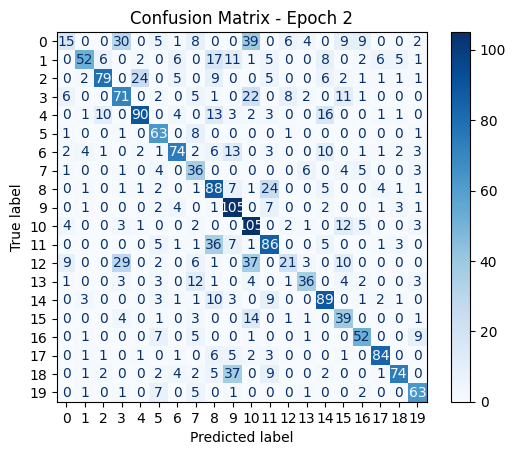

Epoch 2/45 - Train Loss: 1.7072, Train Acc: 0.5512, Val Loss: 1.5941, Val Acc: 0.5894, precision: 0.6036, recall: 0.5985, f1: 0.5795
Best model saved with val accuracy: 0.5894!
Epoch [3/45]

Epoch 3/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6424, Accuracy: 58.44%
Batch 20/719, Loss: 1.5986, Accuracy: 57.81%
Batch 30/719, Loss: 1.5879, Accuracy: 57.60%
Batch 40/719, Loss: 1.5017, Accuracy: 58.01%
Batch 50/719, Loss: 1.7308, Accuracy: 58.19%
Batch 60/719, Loss: 1.6018, Accuracy: 58.70%
Batch 70/719, Loss: 1.5575, Accuracy: 59.33%
Batch 80/719, Loss: 1.7479, Accuracy: 59.41%
Batch 90/719, Loss: 1.5662, Accuracy: 59.50%
Batch 100/719, Loss: 1.6842, Accuracy: 59.50%
Batch 110/719, Loss: 1.5743, Accuracy: 59.83%
Batch 120/719, Loss: 1.4605, Accuracy: 59.79%
Batch 130/719, Loss: 1.4957, Accuracy: 59.93%
Batch 140/719, Loss: 1.3419, Accuracy: 60.21%
Batch 150/719, Loss: 1.4621, Accuracy: 60.28%
Batch 160/719, Loss: 1.6575, Accuracy: 60.36%
Batch 170/719, Loss: 1.5740, Accuracy: 60.56%

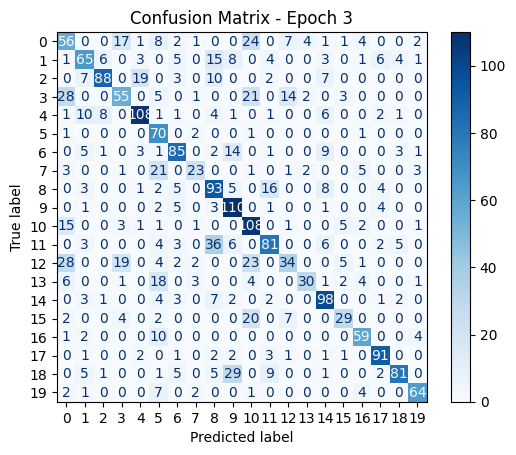

Epoch 3/45 - Train Loss: 1.5186, Train Acc: 0.6293, Val Loss: 1.4866, Val Acc: 0.6366, precision: 0.6588, recall: 0.6328, f1: 0.6286
Best model saved with val accuracy: 0.6366!
Epoch [4/45]

Epoch 4/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6138, Accuracy: 65.47%
Batch 20/719, Loss: 1.5106, Accuracy: 65.78%
Batch 30/719, Loss: 1.5252, Accuracy: 64.69%
Batch 40/719, Loss: 1.3229, Accuracy: 65.35%
Batch 50/719, Loss: 1.6107, Accuracy: 65.16%
Batch 60/719, Loss: 1.3595, Accuracy: 65.57%
Batch 70/719, Loss: 1.5145, Accuracy: 65.60%
Batch 80/719, Loss: 1.5256, Accuracy: 65.37%
Batch 90/719, Loss: 1.6608, Accuracy: 65.35%
Batch 100/719, Loss: 1.4988, Accuracy: 65.20%
Batch 110/719, Loss: 1.3502, Accuracy: 65.58%
Batch 120/719, Loss: 1.3508, Accuracy: 65.74%
Batch 130/719, Loss: 1.3724, Accuracy: 65.85%
Batch 140/719, Loss: 1.3164, Accuracy: 66.06%
Batch 150/719, Loss: 1.3265, Accuracy: 66.10%
Batch 160/719, Loss: 1.4667, Accuracy: 66.15%
Batch 170/719, Loss: 1.4068, Accuracy: 66.35%

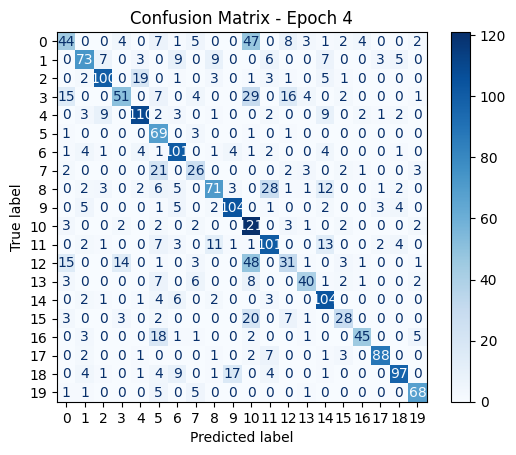

Epoch 4/45 - Train Loss: 1.3993, Train Acc: 0.6807, Val Loss: 1.4558, Val Acc: 0.6563, precision: 0.6738, recall: 0.6494, f1: 0.6448
Best model saved with val accuracy: 0.6563!
Epoch [5/45]

Epoch 5/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4061, Accuracy: 70.31%
Batch 20/719, Loss: 1.2363, Accuracy: 70.16%
Batch 30/719, Loss: 1.4495, Accuracy: 70.36%
Batch 40/719, Loss: 1.3940, Accuracy: 70.59%
Batch 50/719, Loss: 1.5631, Accuracy: 70.03%
Batch 60/719, Loss: 1.2431, Accuracy: 70.10%
Batch 70/719, Loss: 1.4555, Accuracy: 70.38%
Batch 80/719, Loss: 1.3886, Accuracy: 70.02%
Batch 90/719, Loss: 1.5053, Accuracy: 69.98%
Batch 100/719, Loss: 1.3906, Accuracy: 69.75%
Batch 110/719, Loss: 1.3837, Accuracy: 69.97%
Batch 120/719, Loss: 1.1457, Accuracy: 70.27%
Batch 130/719, Loss: 1.4003, Accuracy: 70.25%
Batch 140/719, Loss: 1.1514, Accuracy: 70.28%
Batch 150/719, Loss: 1.2453, Accuracy: 70.33%
Batch 160/719, Loss: 1.3623, Accuracy: 70.30%
Batch 170/719, Loss: 1.3396, Accuracy: 70.64%

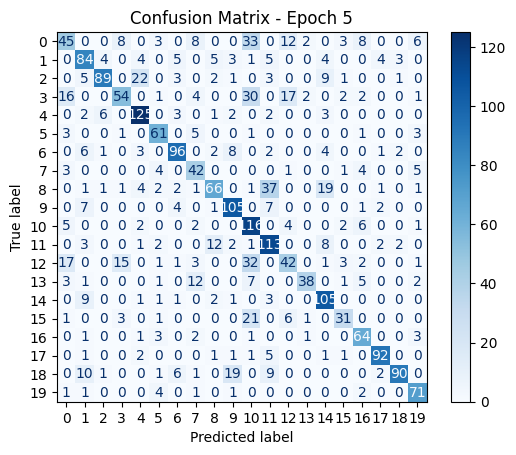

Epoch 5/45 - Train Loss: 1.3045, Train Acc: 0.7200, Val Loss: 1.4065, Val Acc: 0.6817, precision: 0.6975, recall: 0.6832, f1: 0.6766
Best model saved with val accuracy: 0.6817!
Epoch [6/45]

Epoch 6/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2950, Accuracy: 72.03%
Batch 20/719, Loss: 1.1445, Accuracy: 72.50%
Batch 30/719, Loss: 1.3367, Accuracy: 72.34%
Batch 40/719, Loss: 1.3005, Accuracy: 73.16%
Batch 50/719, Loss: 1.2985, Accuracy: 72.84%
Batch 60/719, Loss: 1.2392, Accuracy: 73.12%
Batch 70/719, Loss: 1.4551, Accuracy: 73.33%
Batch 80/719, Loss: 1.2915, Accuracy: 73.54%
Batch 90/719, Loss: 1.4141, Accuracy: 73.70%
Batch 100/719, Loss: 1.3252, Accuracy: 73.52%
Batch 110/719, Loss: 1.3758, Accuracy: 73.55%
Batch 120/719, Loss: 1.1202, Accuracy: 73.71%
Batch 130/719, Loss: 1.3067, Accuracy: 73.70%
Batch 140/719, Loss: 1.1335, Accuracy: 73.78%
Batch 150/719, Loss: 1.3263, Accuracy: 73.85%
Batch 160/719, Loss: 1.2454, Accuracy: 73.85%
Batch 170/719, Loss: 1.4302, Accuracy: 73.87%

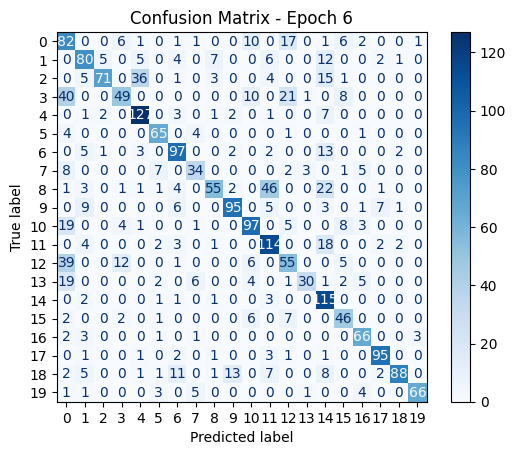

Epoch 6/45 - Train Loss: 1.2272, Train Acc: 0.7514, Val Loss: 1.4359, Val Acc: 0.6808, precision: 0.7211, recall: 0.6846, f1: 0.6836
Epoch [7/45]

Epoch 7/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2387, Accuracy: 76.41%
Batch 20/719, Loss: 1.2688, Accuracy: 75.86%
Batch 30/719, Loss: 1.1587, Accuracy: 76.98%
Batch 40/719, Loss: 1.0953, Accuracy: 77.34%
Batch 50/719, Loss: 1.3310, Accuracy: 77.00%
Batch 60/719, Loss: 1.0472, Accuracy: 76.69%
Batch 70/719, Loss: 1.1934, Accuracy: 77.03%
Batch 80/719, Loss: 1.2950, Accuracy: 77.11%
Batch 90/719, Loss: 1.2528, Accuracy: 77.19%
Batch 100/719, Loss: 1.3687, Accuracy: 77.08%
Batch 110/719, Loss: 1.1476, Accuracy: 77.00%
Batch 120/719, Loss: 1.0630, Accuracy: 77.23%
Batch 130/719, Loss: 1.3060, Accuracy: 77.27%
Batch 140/719, Loss: 1.0023, Accuracy: 77.25%
Batch 150/719, Loss: 1.0972, Accuracy: 77.24%
Batch 160/719, Loss: 1.1805, Accuracy: 77.18%
Batch 170/719, Loss: 1.1199, Accuracy: 77.37%
Batch 180/719, Loss: 1.1963, Accuracy: 77.3

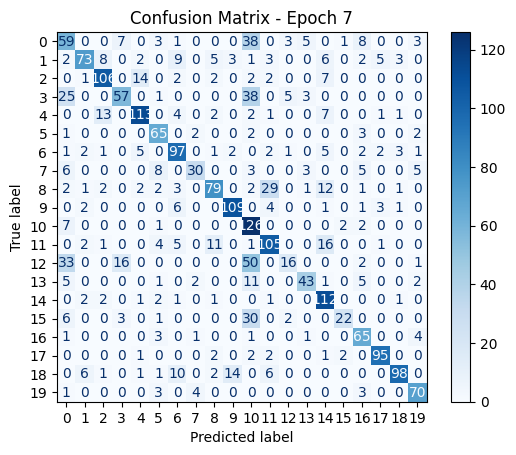

Epoch 7/45 - Train Loss: 1.1713, Train Acc: 0.7757, Val Loss: 1.4082, Val Acc: 0.6866, precision: 0.7221, recall: 0.6804, f1: 0.6767
Best model saved with val accuracy: 0.6866!
Epoch [8/45]

Epoch 8/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2739, Accuracy: 80.00%
Batch 20/719, Loss: 1.1355, Accuracy: 77.89%
Batch 30/719, Loss: 1.2854, Accuracy: 77.55%
Batch 40/719, Loss: 1.0563, Accuracy: 78.28%
Batch 50/719, Loss: 1.1563, Accuracy: 78.44%
Batch 60/719, Loss: 1.2182, Accuracy: 78.62%
Batch 70/719, Loss: 1.2467, Accuracy: 78.88%
Batch 80/719, Loss: 1.1291, Accuracy: 78.85%
Batch 90/719, Loss: 1.1980, Accuracy: 78.44%
Batch 100/719, Loss: 1.0651, Accuracy: 78.44%
Batch 110/719, Loss: 1.1047, Accuracy: 78.59%
Batch 120/719, Loss: 1.0697, Accuracy: 78.63%
Batch 130/719, Loss: 1.1686, Accuracy: 78.73%
Batch 140/719, Loss: 0.9543, Accuracy: 78.88%
Batch 150/719, Loss: 1.0526, Accuracy: 78.95%
Batch 160/719, Loss: 1.1058, Accuracy: 79.11%
Batch 170/719, Loss: 1.2822, Accuracy: 79.15%

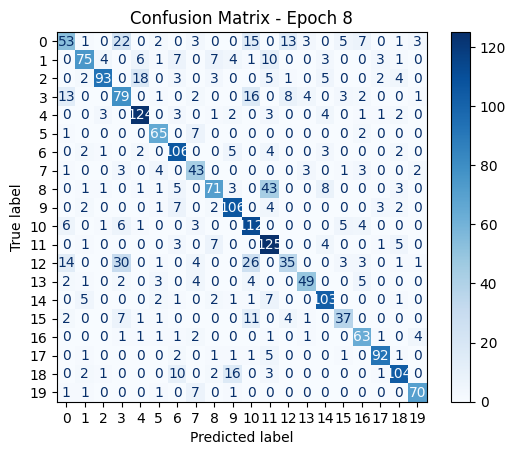

Epoch 8/45 - Train Loss: 1.1262, Train Acc: 0.7945, Val Loss: 1.3531, Val Acc: 0.7156, precision: 0.7232, recall: 0.7184, f1: 0.7119
Best model saved with val accuracy: 0.7156!
Epoch [9/45]

Epoch 9/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0781, Accuracy: 77.03%
Batch 20/719, Loss: 1.2080, Accuracy: 78.83%
Batch 30/719, Loss: 1.1444, Accuracy: 78.65%
Batch 40/719, Loss: 1.1166, Accuracy: 79.30%
Batch 50/719, Loss: 1.1269, Accuracy: 79.19%
Batch 60/719, Loss: 1.1064, Accuracy: 79.45%
Batch 70/719, Loss: 1.1987, Accuracy: 79.71%
Batch 80/719, Loss: 1.1968, Accuracy: 79.84%
Batch 90/719, Loss: 1.2192, Accuracy: 79.88%
Batch 100/719, Loss: 1.1338, Accuracy: 79.89%
Batch 110/719, Loss: 1.1616, Accuracy: 79.74%
Batch 120/719, Loss: 0.9199, Accuracy: 80.05%
Batch 130/719, Loss: 1.0794, Accuracy: 80.01%
Batch 140/719, Loss: 1.0066, Accuracy: 79.99%
Batch 150/719, Loss: 0.9437, Accuracy: 80.15%
Batch 160/719, Loss: 1.0133, Accuracy: 80.17%
Batch 170/719, Loss: 1.3327, Accuracy: 80.21%

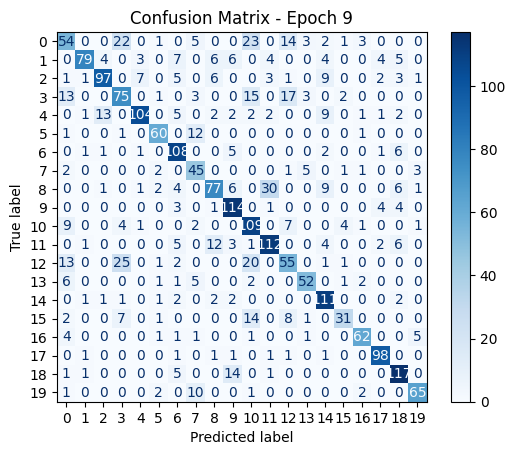

Epoch 9/45 - Train Loss: 1.0809, Train Acc: 0.8120, Val Loss: 1.3220, Val Acc: 0.7245, precision: 0.7364, recall: 0.7253, f1: 0.7237
Best model saved with val accuracy: 0.7245!
Epoch [10/45]

Epoch 10/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0135, Accuracy: 79.06%
Batch 20/719, Loss: 1.0558, Accuracy: 79.77%
Batch 30/719, Loss: 0.9365, Accuracy: 80.83%
Batch 40/719, Loss: 1.0074, Accuracy: 80.94%
Batch 50/719, Loss: 1.0539, Accuracy: 80.75%
Batch 60/719, Loss: 1.1260, Accuracy: 81.12%
Batch 70/719, Loss: 1.0440, Accuracy: 81.16%
Batch 80/719, Loss: 1.1109, Accuracy: 81.37%
Batch 90/719, Loss: 1.0309, Accuracy: 81.49%
Batch 100/719, Loss: 1.1758, Accuracy: 81.38%
Batch 110/719, Loss: 1.1381, Accuracy: 81.45%
Batch 120/719, Loss: 1.0664, Accuracy: 81.58%
Batch 130/719, Loss: 0.9744, Accuracy: 81.68%
Batch 140/719, Loss: 0.8208, Accuracy: 81.83%
Batch 150/719, Loss: 0.9886, Accuracy: 81.86%
Batch 160/719, Loss: 1.1068, Accuracy: 81.93%
Batch 170/719, Loss: 1.1077, Accuracy: 82.0

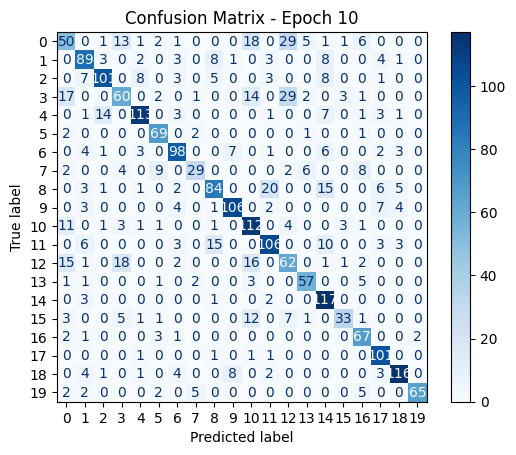

Epoch 10/45 - Train Loss: 1.0450, Train Acc: 0.8257, Val Loss: 1.3054, Val Acc: 0.7289, precision: 0.7386, recall: 0.7286, f1: 0.7260
Best model saved with val accuracy: 0.7289!
Epoch [11/45]

Epoch 11/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1817, Accuracy: 83.59%
Batch 20/719, Loss: 1.0852, Accuracy: 82.27%
Batch 30/719, Loss: 1.0376, Accuracy: 83.07%
Batch 40/719, Loss: 0.9726, Accuracy: 83.28%
Batch 50/719, Loss: 1.2072, Accuracy: 83.00%
Batch 60/719, Loss: 0.9322, Accuracy: 83.18%
Batch 70/719, Loss: 1.0534, Accuracy: 83.44%
Batch 80/719, Loss: 1.1092, Accuracy: 83.54%
Batch 90/719, Loss: 1.0661, Accuracy: 83.51%
Batch 100/719, Loss: 1.1299, Accuracy: 83.11%
Batch 110/719, Loss: 1.0568, Accuracy: 83.27%
Batch 120/719, Loss: 0.9954, Accuracy: 83.32%
Batch 130/719, Loss: 1.0739, Accuracy: 83.46%
Batch 140/719, Loss: 1.0399, Accuracy: 83.54%
Batch 150/719, Loss: 1.0496, Accuracy: 83.52%
Batch 160/719, Loss: 1.1181, Accuracy: 83.50%
Batch 170/719, Loss: 1.1702, Accuracy: 83.

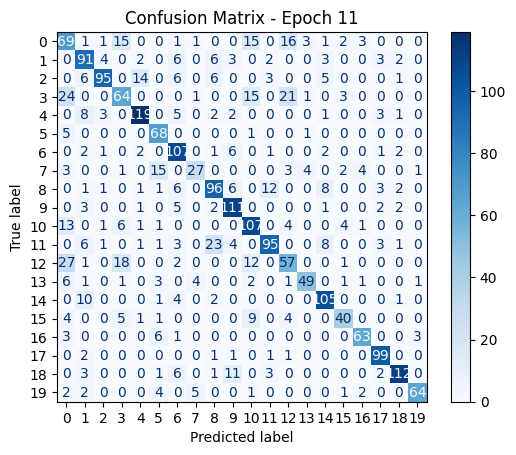

Epoch 11/45 - Train Loss: 1.0166, Train Acc: 0.8385, Val Loss: 1.2900, Val Acc: 0.7303, precision: 0.7431, recall: 0.7274, f1: 0.7293
Best model saved with val accuracy: 0.7303!
Epoch [12/45]

Epoch 12/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0632, Accuracy: 82.97%
Batch 20/719, Loss: 0.9095, Accuracy: 84.45%
Batch 30/719, Loss: 1.0340, Accuracy: 84.38%
Batch 40/719, Loss: 0.8745, Accuracy: 84.69%
Batch 50/719, Loss: 1.1038, Accuracy: 84.25%
Batch 60/719, Loss: 1.0265, Accuracy: 84.48%
Batch 70/719, Loss: 1.1600, Accuracy: 84.49%
Batch 80/719, Loss: 0.9605, Accuracy: 84.88%
Batch 90/719, Loss: 0.9396, Accuracy: 85.05%
Batch 100/719, Loss: 1.0460, Accuracy: 84.95%
Batch 110/719, Loss: 0.8995, Accuracy: 84.97%
Batch 120/719, Loss: 1.0512, Accuracy: 85.07%
Batch 130/719, Loss: 0.9721, Accuracy: 85.07%
Batch 140/719, Loss: 0.9226, Accuracy: 85.28%
Batch 150/719, Loss: 1.0165, Accuracy: 85.36%
Batch 160/719, Loss: 1.0705, Accuracy: 85.32%
Batch 170/719, Loss: 1.1369, Accuracy: 85.

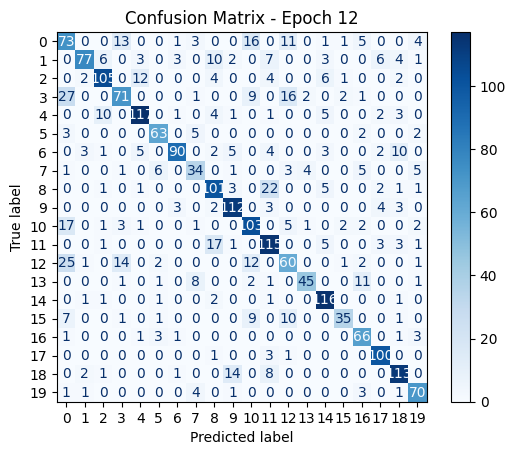

Epoch 12/45 - Train Loss: 0.9865, Train Acc: 0.8505, Val Loss: 1.2850, Val Acc: 0.7428, precision: 0.7523, recall: 0.7378, f1: 0.7389
Best model saved with val accuracy: 0.7428!
Epoch [13/45]

Epoch 13/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0038, Accuracy: 86.25%
Batch 20/719, Loss: 1.0926, Accuracy: 84.06%
Batch 30/719, Loss: 1.0240, Accuracy: 84.32%
Batch 40/719, Loss: 1.0066, Accuracy: 85.04%
Batch 50/719, Loss: 0.9499, Accuracy: 85.16%
Batch 60/719, Loss: 0.8828, Accuracy: 85.42%
Batch 70/719, Loss: 1.0329, Accuracy: 85.54%
Batch 80/719, Loss: 1.0613, Accuracy: 85.49%
Batch 90/719, Loss: 0.9507, Accuracy: 85.57%
Batch 100/719, Loss: 0.9222, Accuracy: 85.62%
Batch 110/719, Loss: 0.9219, Accuracy: 85.67%
Batch 120/719, Loss: 0.9292, Accuracy: 85.78%
Batch 130/719, Loss: 0.9472, Accuracy: 85.73%
Batch 140/719, Loss: 0.9526, Accuracy: 85.83%
Batch 150/719, Loss: 1.0507, Accuracy: 85.91%
Batch 160/719, Loss: 1.0354, Accuracy: 86.00%
Batch 170/719, Loss: 1.0583, Accuracy: 86.

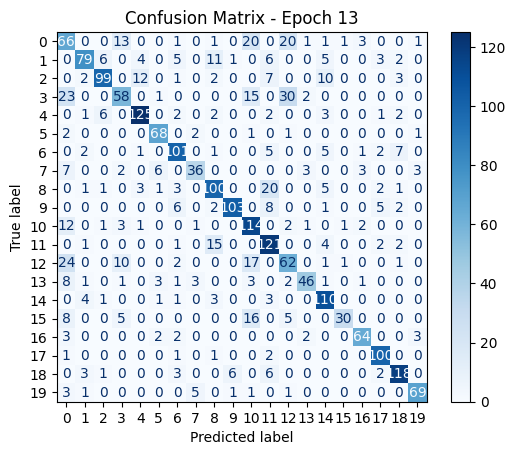

Epoch 13/45 - Train Loss: 0.9674, Train Acc: 0.8586, Val Loss: 1.3225, Val Acc: 0.7441, precision: 0.7690, recall: 0.7380, f1: 0.7451
Best model saved with val accuracy: 0.7441!
Epoch [14/45]

Epoch 14/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9947, Accuracy: 86.72%
Batch 20/719, Loss: 0.8702, Accuracy: 85.86%
Batch 30/719, Loss: 0.9586, Accuracy: 86.41%
Batch 40/719, Loss: 0.9973, Accuracy: 86.37%
Batch 50/719, Loss: 1.0482, Accuracy: 86.25%
Batch 60/719, Loss: 0.9334, Accuracy: 86.15%
Batch 70/719, Loss: 0.9607, Accuracy: 86.54%
Batch 80/719, Loss: 1.0976, Accuracy: 86.46%
Batch 90/719, Loss: 0.8713, Accuracy: 86.65%
Batch 100/719, Loss: 1.0566, Accuracy: 86.52%
Batch 110/719, Loss: 0.9701, Accuracy: 86.46%
Batch 120/719, Loss: 0.9108, Accuracy: 86.54%
Batch 130/719, Loss: 0.9975, Accuracy: 86.57%
Batch 140/719, Loss: 0.8300, Accuracy: 86.72%
Batch 150/719, Loss: 0.8923, Accuracy: 86.64%
Batch 160/719, Loss: 0.8341, Accuracy: 86.55%
Batch 170/719, Loss: 0.9683, Accuracy: 86.

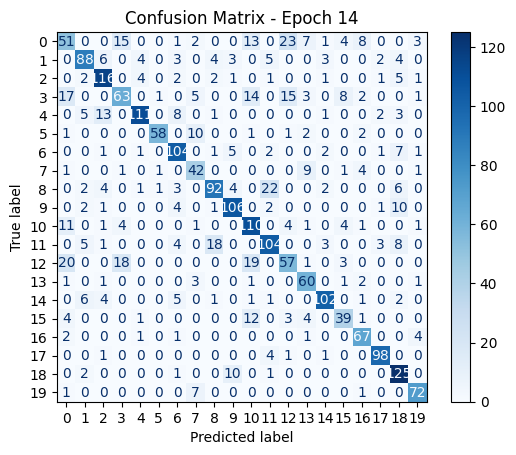

Epoch 14/45 - Train Loss: 0.9510, Train Acc: 0.8635, Val Loss: 1.2725, Val Acc: 0.7423, precision: 0.7420, recall: 0.7467, f1: 0.7407
Epoch [15/45]

Epoch 15/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8925, Accuracy: 85.62%
Batch 20/719, Loss: 0.9907, Accuracy: 85.94%
Batch 30/719, Loss: 0.9096, Accuracy: 86.30%
Batch 40/719, Loss: 0.7444, Accuracy: 86.99%
Batch 50/719, Loss: 0.9285, Accuracy: 87.06%
Batch 60/719, Loss: 0.8361, Accuracy: 87.40%
Batch 70/719, Loss: 0.9834, Accuracy: 87.54%
Batch 80/719, Loss: 0.8855, Accuracy: 87.44%
Batch 90/719, Loss: 0.9239, Accuracy: 87.50%
Batch 100/719, Loss: 0.9761, Accuracy: 87.53%
Batch 110/719, Loss: 0.7811, Accuracy: 87.49%
Batch 120/719, Loss: 0.8351, Accuracy: 87.36%
Batch 130/719, Loss: 0.9789, Accuracy: 87.26%
Batch 140/719, Loss: 0.7686, Accuracy: 87.42%
Batch 150/719, Loss: 0.8824, Accuracy: 87.47%
Batch 160/719, Loss: 0.8006, Accuracy: 87.53%
Batch 170/719, Loss: 1.0226, Accuracy: 87.52%
Batch 180/719, Loss: 1.0374, Accuracy: 8

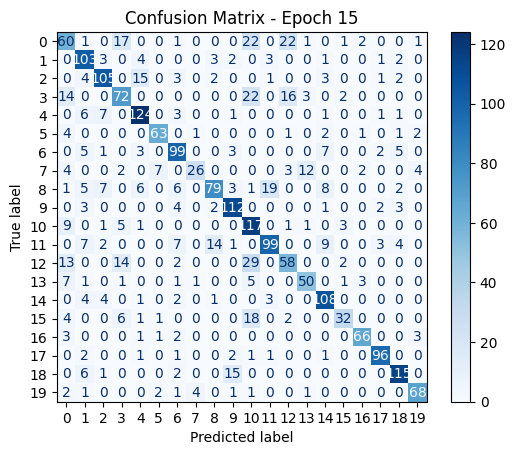

Epoch 15/45 - Train Loss: 0.9248, Train Acc: 0.8747, Val Loss: 1.3035, Val Acc: 0.7365, precision: 0.7538, recall: 0.7294, f1: 0.7335
Epoch [16/45]

Epoch 16/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0511, Accuracy: 87.66%
Batch 20/719, Loss: 0.9269, Accuracy: 86.88%
Batch 30/719, Loss: 0.9575, Accuracy: 87.66%
Batch 40/719, Loss: 0.8668, Accuracy: 87.58%
Batch 50/719, Loss: 0.9055, Accuracy: 87.41%
Batch 60/719, Loss: 0.9115, Accuracy: 87.97%
Batch 70/719, Loss: 1.0675, Accuracy: 88.08%
Batch 80/719, Loss: 0.9805, Accuracy: 88.38%
Batch 90/719, Loss: 0.8256, Accuracy: 88.51%
Batch 100/719, Loss: 0.7735, Accuracy: 88.50%
Batch 110/719, Loss: 0.9256, Accuracy: 88.61%
Batch 120/719, Loss: 1.0089, Accuracy: 88.49%
Batch 130/719, Loss: 0.8688, Accuracy: 88.51%
Batch 140/719, Loss: 0.8002, Accuracy: 88.57%
Batch 150/719, Loss: 0.7061, Accuracy: 88.47%
Batch 160/719, Loss: 0.7831, Accuracy: 88.44%
Batch 170/719, Loss: 0.9956, Accuracy: 88.66%
Batch 180/719, Loss: 0.8742, Accuracy: 8

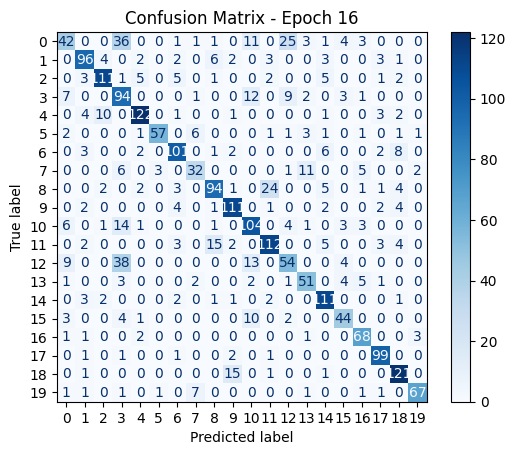

Epoch 16/45 - Train Loss: 0.9079, Train Acc: 0.8814, Val Loss: 1.2710, Val Acc: 0.7539, precision: 0.7586, recall: 0.7500, f1: 0.7491
Best model saved with val accuracy: 0.7539!
Epoch [17/45]

Epoch 17/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9453, Accuracy: 86.25%
Batch 20/719, Loss: 0.9657, Accuracy: 87.81%
Batch 30/719, Loss: 0.8680, Accuracy: 88.44%
Batch 40/719, Loss: 0.8462, Accuracy: 88.40%
Batch 50/719, Loss: 1.0004, Accuracy: 88.28%
Batch 60/719, Loss: 0.8847, Accuracy: 88.20%
Batch 70/719, Loss: 0.9188, Accuracy: 88.33%
Batch 80/719, Loss: 0.9735, Accuracy: 88.52%
Batch 90/719, Loss: 0.8213, Accuracy: 88.65%
Batch 100/719, Loss: 0.8665, Accuracy: 88.72%
Batch 110/719, Loss: 1.0078, Accuracy: 88.52%
Batch 120/719, Loss: 0.7663, Accuracy: 88.58%
Batch 130/719, Loss: 0.8757, Accuracy: 88.77%
Batch 140/719, Loss: 0.8309, Accuracy: 88.79%
Batch 150/719, Loss: 0.8264, Accuracy: 88.76%
Batch 160/719, Loss: 0.9750, Accuracy: 88.87%
Batch 170/719, Loss: 0.8161, Accuracy: 88.

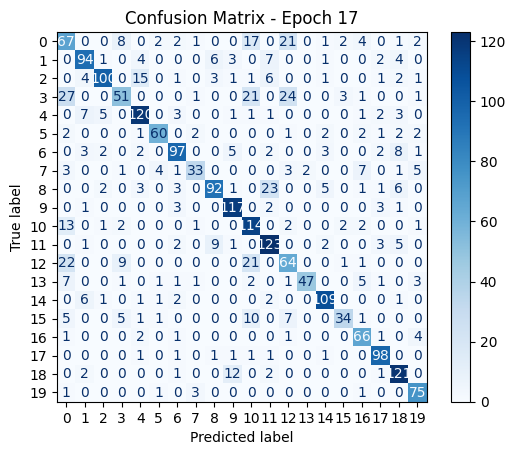

Epoch 17/45 - Train Loss: 0.8943, Train Acc: 0.8857, Val Loss: 1.2840, Val Acc: 0.7499, precision: 0.7673, recall: 0.7437, f1: 0.7470
Epoch [18/45]

Epoch 18/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9675, Accuracy: 90.31%
Batch 20/719, Loss: 0.8518, Accuracy: 89.22%
Batch 30/719, Loss: 0.7909, Accuracy: 89.32%
Batch 40/719, Loss: 0.8219, Accuracy: 89.22%
Batch 50/719, Loss: 0.9758, Accuracy: 88.75%
Batch 60/719, Loss: 0.9218, Accuracy: 89.06%
Batch 70/719, Loss: 0.9268, Accuracy: 89.04%
Batch 80/719, Loss: 0.9310, Accuracy: 89.06%
Batch 90/719, Loss: 0.9285, Accuracy: 89.17%
Batch 100/719, Loss: 0.8474, Accuracy: 89.06%
Batch 110/719, Loss: 0.7967, Accuracy: 89.05%
Batch 120/719, Loss: 0.7771, Accuracy: 89.13%
Batch 130/719, Loss: 0.8703, Accuracy: 89.05%
Batch 140/719, Loss: 0.7769, Accuracy: 89.15%
Batch 150/719, Loss: 0.9135, Accuracy: 89.16%
Batch 160/719, Loss: 1.0703, Accuracy: 89.16%
Batch 170/719, Loss: 0.8061, Accuracy: 89.37%
Batch 180/719, Loss: 0.9149, Accuracy: 8

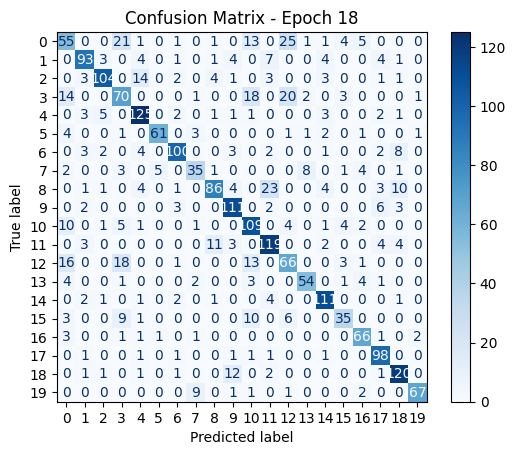

Epoch 18/45 - Train Loss: 0.8833, Train Acc: 0.8916, Val Loss: 1.2588, Val Acc: 0.7512, precision: 0.7580, recall: 0.7472, f1: 0.7494
Epoch [19/45]

Epoch 19/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8248, Accuracy: 91.09%
Batch 20/719, Loss: 0.7961, Accuracy: 89.45%
Batch 30/719, Loss: 0.8012, Accuracy: 89.64%
Batch 40/719, Loss: 0.8619, Accuracy: 89.84%
Batch 50/719, Loss: 0.8828, Accuracy: 90.16%
Batch 60/719, Loss: 0.9765, Accuracy: 90.31%
Batch 70/719, Loss: 0.8527, Accuracy: 90.09%
Batch 80/719, Loss: 0.9119, Accuracy: 89.98%
Batch 90/719, Loss: 0.7987, Accuracy: 89.67%
Batch 100/719, Loss: 0.8982, Accuracy: 89.58%
Batch 110/719, Loss: 0.8229, Accuracy: 89.46%
Batch 120/719, Loss: 0.9732, Accuracy: 89.44%
Batch 130/719, Loss: 0.7977, Accuracy: 89.46%
Batch 140/719, Loss: 0.8501, Accuracy: 89.55%
Batch 150/719, Loss: 0.8733, Accuracy: 89.60%
Batch 160/719, Loss: 0.9791, Accuracy: 89.67%
Batch 170/719, Loss: 0.9803, Accuracy: 89.61%
Batch 180/719, Loss: 0.8240, Accuracy: 8

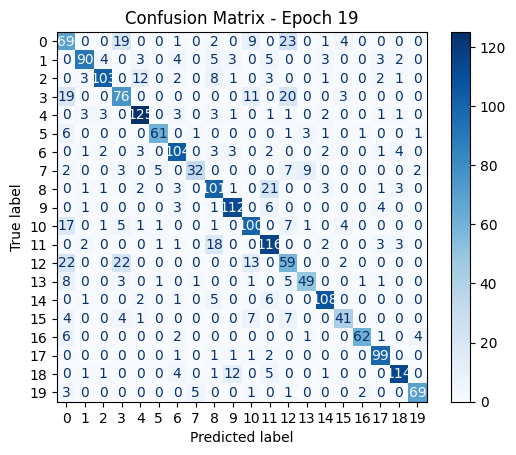

Epoch 19/45 - Train Loss: 0.8720, Train Acc: 0.8954, Val Loss: 1.2436, Val Acc: 0.7535, precision: 0.7747, recall: 0.7479, f1: 0.7577
Epoch [20/45]

Epoch 20/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9276, Accuracy: 90.16%
Batch 20/719, Loss: 0.8982, Accuracy: 89.61%
Batch 30/719, Loss: 0.7959, Accuracy: 89.17%
Batch 40/719, Loss: 0.8561, Accuracy: 89.10%
Batch 50/719, Loss: 0.9192, Accuracy: 89.09%
Batch 60/719, Loss: 0.7208, Accuracy: 89.48%
Batch 70/719, Loss: 0.8726, Accuracy: 89.62%
Batch 80/719, Loss: 0.9130, Accuracy: 89.77%
Batch 90/719, Loss: 0.9560, Accuracy: 89.86%
Batch 100/719, Loss: 0.8755, Accuracy: 89.72%
Batch 110/719, Loss: 0.9704, Accuracy: 89.76%
Batch 120/719, Loss: 0.8861, Accuracy: 89.80%
Batch 130/719, Loss: 0.7987, Accuracy: 89.82%
Batch 140/719, Loss: 0.8390, Accuracy: 89.80%
Batch 150/719, Loss: 0.8128, Accuracy: 89.71%
Batch 160/719, Loss: 0.9192, Accuracy: 89.71%
Batch 170/719, Loss: 0.8478, Accuracy: 89.82%
Batch 180/719, Loss: 0.8530, Accuracy: 8

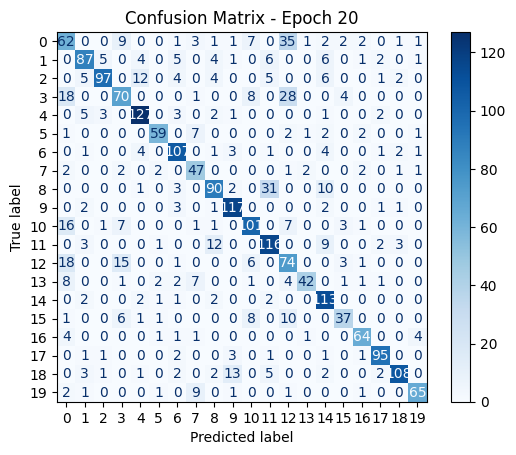

Epoch 20/45 - Train Loss: 0.8588, Train Acc: 0.8998, Val Loss: 1.2602, Val Acc: 0.7481, precision: 0.7639, recall: 0.7458, f1: 0.7493
Epoch [21/45]

Epoch 21/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7899, Accuracy: 90.16%
Batch 20/719, Loss: 0.8775, Accuracy: 89.53%
Batch 30/719, Loss: 0.8695, Accuracy: 89.53%
Batch 40/719, Loss: 0.8385, Accuracy: 89.41%
Batch 50/719, Loss: 0.8328, Accuracy: 89.44%
Batch 60/719, Loss: 0.8240, Accuracy: 89.92%
Batch 70/719, Loss: 0.9413, Accuracy: 90.00%
Batch 80/719, Loss: 0.9079, Accuracy: 89.79%
Batch 90/719, Loss: 0.8274, Accuracy: 89.97%
Batch 100/719, Loss: 0.7774, Accuracy: 90.02%
Batch 110/719, Loss: 0.8900, Accuracy: 90.00%
Batch 120/719, Loss: 0.7595, Accuracy: 90.12%
Batch 130/719, Loss: 0.8825, Accuracy: 90.07%
Batch 140/719, Loss: 0.8779, Accuracy: 90.22%
Batch 150/719, Loss: 0.7954, Accuracy: 90.32%
Batch 160/719, Loss: 0.9117, Accuracy: 90.34%
Batch 170/719, Loss: 0.8145, Accuracy: 90.37%
Batch 180/719, Loss: 0.8002, Accuracy: 9

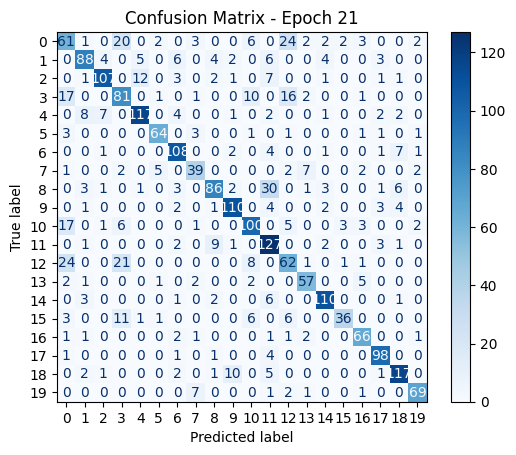

Epoch 21/45 - Train Loss: 0.8489, Train Acc: 0.9040, Val Loss: 1.2728, Val Acc: 0.7593, precision: 0.7705, recall: 0.7586, f1: 0.7610
Best model saved with val accuracy: 0.7593!
Epoch [22/45]

Epoch 22/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9525, Accuracy: 90.94%
Batch 20/719, Loss: 0.8989, Accuracy: 90.55%
Batch 30/719, Loss: 0.8645, Accuracy: 90.57%
Batch 40/719, Loss: 0.6694, Accuracy: 91.17%
Batch 50/719, Loss: 0.8577, Accuracy: 91.16%
Batch 60/719, Loss: 0.8125, Accuracy: 91.38%
Batch 70/719, Loss: 0.8098, Accuracy: 91.47%
Batch 80/719, Loss: 0.9199, Accuracy: 91.31%
Batch 90/719, Loss: 0.8234, Accuracy: 91.28%
Batch 100/719, Loss: 0.8604, Accuracy: 91.16%
Batch 110/719, Loss: 0.8049, Accuracy: 90.95%
Batch 120/719, Loss: 0.7970, Accuracy: 91.04%
Batch 130/719, Loss: 0.8014, Accuracy: 91.07%
Batch 140/719, Loss: 0.7672, Accuracy: 91.09%
Batch 150/719, Loss: 0.8023, Accuracy: 91.16%
Batch 160/719, Loss: 0.7550, Accuracy: 91.16%
Batch 170/719, Loss: 0.8052, Accuracy: 91.

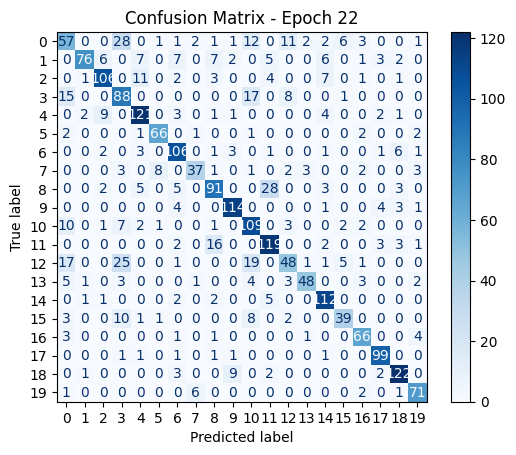

Epoch 22/45 - Train Loss: 0.8336, Train Acc: 0.9107, Val Loss: 1.2498, Val Acc: 0.7557, precision: 0.7672, recall: 0.7530, f1: 0.7544
Epoch [23/45]

Epoch 23/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8631, Accuracy: 89.38%
Batch 20/719, Loss: 0.6911, Accuracy: 91.09%
Batch 30/719, Loss: 0.8296, Accuracy: 90.94%
Batch 40/719, Loss: 0.7653, Accuracy: 90.78%
Batch 50/719, Loss: 0.9476, Accuracy: 90.41%
Batch 60/719, Loss: 0.7800, Accuracy: 90.60%
Batch 70/719, Loss: 0.8231, Accuracy: 90.71%
Batch 80/719, Loss: 0.8964, Accuracy: 90.84%
Batch 90/719, Loss: 0.8063, Accuracy: 90.95%
Batch 100/719, Loss: 0.8125, Accuracy: 90.98%
Batch 110/719, Loss: 0.8217, Accuracy: 90.85%
Batch 120/719, Loss: 0.7435, Accuracy: 90.94%
Batch 130/719, Loss: 0.9885, Accuracy: 90.94%
Batch 140/719, Loss: 0.7998, Accuracy: 90.90%
Batch 150/719, Loss: 0.8599, Accuracy: 90.85%
Batch 160/719, Loss: 0.9795, Accuracy: 90.81%
Batch 170/719, Loss: 0.8977, Accuracy: 90.85%
Batch 180/719, Loss: 0.9727, Accuracy: 9

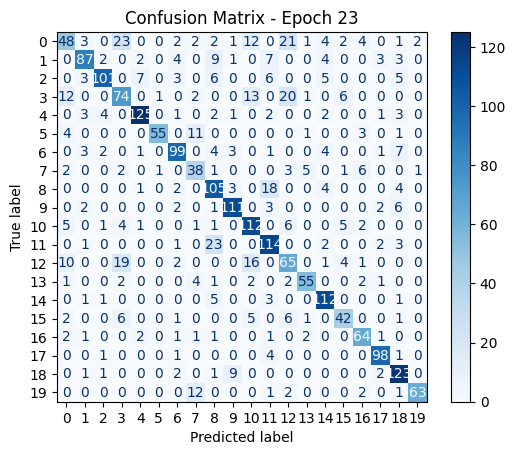

Epoch 23/45 - Train Loss: 0.8310, Train Acc: 0.9108, Val Loss: 1.2669, Val Acc: 0.7539, precision: 0.7611, recall: 0.7503, f1: 0.7516
Epoch [24/45]

Epoch 24/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8323, Accuracy: 90.31%
Batch 20/719, Loss: 0.8057, Accuracy: 90.86%
Batch 30/719, Loss: 0.9407, Accuracy: 91.15%
Batch 40/719, Loss: 0.7177, Accuracy: 91.25%
Batch 50/719, Loss: 0.8436, Accuracy: 91.16%
Batch 60/719, Loss: 0.9174, Accuracy: 91.02%
Batch 70/719, Loss: 0.9578, Accuracy: 90.98%
Batch 80/719, Loss: 0.9146, Accuracy: 91.21%
Batch 90/719, Loss: 0.8147, Accuracy: 91.32%
Batch 100/719, Loss: 0.7706, Accuracy: 91.31%
Batch 110/719, Loss: 0.7896, Accuracy: 91.29%
Batch 120/719, Loss: 0.7989, Accuracy: 91.28%
Batch 130/719, Loss: 0.8208, Accuracy: 91.37%
Batch 140/719, Loss: 0.7603, Accuracy: 91.40%
Batch 150/719, Loss: 0.7901, Accuracy: 91.41%
Batch 160/719, Loss: 0.7861, Accuracy: 91.50%
Batch 170/719, Loss: 0.7922, Accuracy: 91.50%
Batch 180/719, Loss: 0.7321, Accuracy: 9

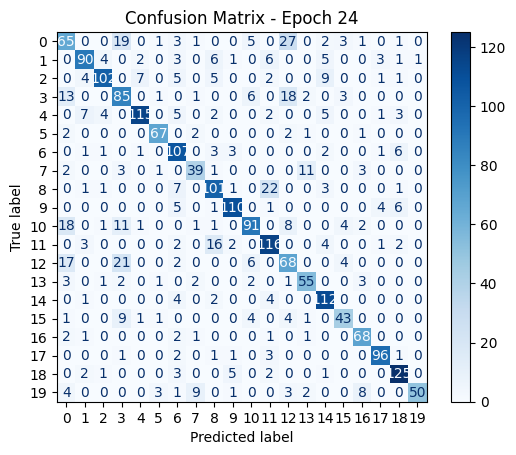

Epoch 24/45 - Train Loss: 0.8189, Train Acc: 0.9167, Val Loss: 1.2782, Val Acc: 0.7601, precision: 0.7727, recall: 0.7590, f1: 0.7616
Best model saved with val accuracy: 0.7601!
Epoch [25/45]

Epoch 25/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8136, Accuracy: 90.31%
Batch 20/719, Loss: 0.7725, Accuracy: 90.39%
Batch 30/719, Loss: 0.7709, Accuracy: 90.89%
Batch 40/719, Loss: 0.7400, Accuracy: 91.05%
Batch 50/719, Loss: 0.8547, Accuracy: 91.25%
Batch 60/719, Loss: 0.7491, Accuracy: 91.61%
Batch 70/719, Loss: 0.7879, Accuracy: 91.67%
Batch 80/719, Loss: 0.9455, Accuracy: 91.60%
Batch 90/719, Loss: 0.7590, Accuracy: 91.82%
Batch 100/719, Loss: 0.8319, Accuracy: 91.81%
Batch 110/719, Loss: 0.8367, Accuracy: 91.79%
Batch 120/719, Loss: 0.7016, Accuracy: 91.73%
Batch 130/719, Loss: 0.8457, Accuracy: 91.77%
Batch 140/719, Loss: 0.8170, Accuracy: 91.88%
Batch 150/719, Loss: 0.7402, Accuracy: 91.83%
Batch 160/719, Loss: 0.7725, Accuracy: 91.84%
Batch 170/719, Loss: 0.8873, Accuracy: 91.

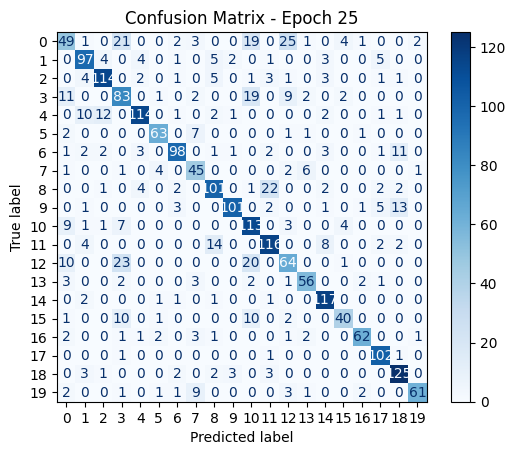

Epoch 25/45 - Train Loss: 0.8139, Train Acc: 0.9161, Val Loss: 1.2557, Val Acc: 0.7673, precision: 0.7771, recall: 0.7665, f1: 0.7677
Best model saved with val accuracy: 0.7673!
Epoch [26/45]

Epoch 26/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9332, Accuracy: 92.66%
Batch 20/719, Loss: 0.8858, Accuracy: 92.19%
Batch 30/719, Loss: 0.7438, Accuracy: 92.03%
Batch 40/719, Loss: 0.7801, Accuracy: 92.19%
Batch 50/719, Loss: 0.8495, Accuracy: 91.81%
Batch 60/719, Loss: 0.7884, Accuracy: 91.82%
Batch 70/719, Loss: 0.9049, Accuracy: 91.88%
Batch 80/719, Loss: 0.8791, Accuracy: 92.03%
Batch 90/719, Loss: 0.7084, Accuracy: 92.22%
Batch 100/719, Loss: 0.8558, Accuracy: 92.20%
Batch 110/719, Loss: 0.8331, Accuracy: 92.13%
Batch 120/719, Loss: 0.8829, Accuracy: 92.10%
Batch 130/719, Loss: 0.8466, Accuracy: 92.00%
Batch 140/719, Loss: 0.7630, Accuracy: 91.96%
Batch 150/719, Loss: 0.8710, Accuracy: 92.06%
Batch 160/719, Loss: 0.8261, Accuracy: 92.02%
Batch 170/719, Loss: 0.8279, Accuracy: 91.

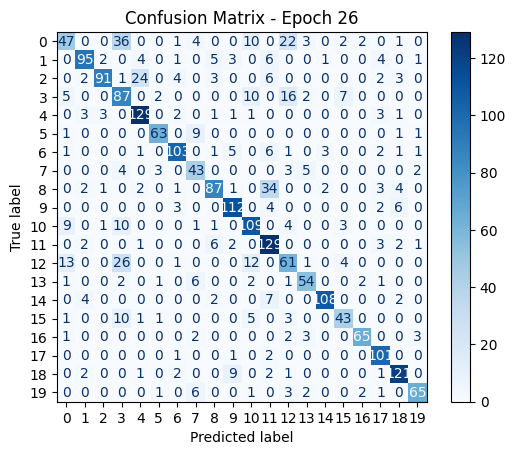

Epoch 26/45 - Train Loss: 0.8014, Train Acc: 0.9219, Val Loss: 1.2667, Val Acc: 0.7637, precision: 0.7754, recall: 0.7642, f1: 0.7641
Epoch [27/45]

Epoch 27/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8852, Accuracy: 90.94%
Batch 20/719, Loss: 0.8166, Accuracy: 90.70%
Batch 30/719, Loss: 0.7519, Accuracy: 91.15%
Batch 40/719, Loss: 0.8300, Accuracy: 91.09%
Batch 50/719, Loss: 0.8815, Accuracy: 91.56%
Batch 60/719, Loss: 0.8109, Accuracy: 91.72%
Batch 70/719, Loss: 0.7742, Accuracy: 91.88%
Batch 80/719, Loss: 0.7781, Accuracy: 92.05%
Batch 90/719, Loss: 0.9354, Accuracy: 92.07%
Batch 100/719, Loss: 0.7466, Accuracy: 92.00%
Batch 110/719, Loss: 0.7740, Accuracy: 92.12%
Batch 120/719, Loss: 0.7122, Accuracy: 92.21%
Batch 130/719, Loss: 0.8771, Accuracy: 92.27%
Batch 140/719, Loss: 0.7647, Accuracy: 92.19%
Batch 150/719, Loss: 0.7468, Accuracy: 92.18%
Batch 160/719, Loss: 0.7623, Accuracy: 92.34%
Batch 170/719, Loss: 0.7634, Accuracy: 92.29%
Batch 180/719, Loss: 0.7955, Accuracy: 9

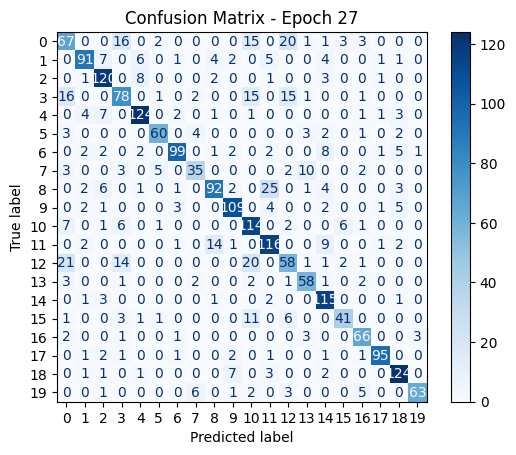

Epoch 27/45 - Train Loss: 0.7967, Train Acc: 0.9232, Val Loss: 1.2664, Val Acc: 0.7691, precision: 0.7770, recall: 0.7641, f1: 0.7671
Best model saved with val accuracy: 0.7691!
Epoch [28/45]

Epoch 28/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7846, Accuracy: 93.12%
Batch 20/719, Loss: 0.8127, Accuracy: 92.66%
Batch 30/719, Loss: 0.8855, Accuracy: 92.34%
Batch 40/719, Loss: 0.7378, Accuracy: 91.84%
Batch 50/719, Loss: 0.7948, Accuracy: 91.78%
Batch 60/719, Loss: 0.7458, Accuracy: 91.85%
Batch 70/719, Loss: 0.7715, Accuracy: 92.17%
Batch 80/719, Loss: 0.7885, Accuracy: 92.30%
Batch 90/719, Loss: 0.9489, Accuracy: 92.27%
Batch 100/719, Loss: 0.9314, Accuracy: 92.08%
Batch 110/719, Loss: 0.7460, Accuracy: 92.14%
Batch 120/719, Loss: 0.7682, Accuracy: 92.11%
Batch 130/719, Loss: 0.8185, Accuracy: 92.12%
Batch 140/719, Loss: 0.7908, Accuracy: 92.09%
Batch 150/719, Loss: 0.7350, Accuracy: 92.10%
Batch 160/719, Loss: 0.7935, Accuracy: 92.12%
Batch 170/719, Loss: 0.7413, Accuracy: 92.

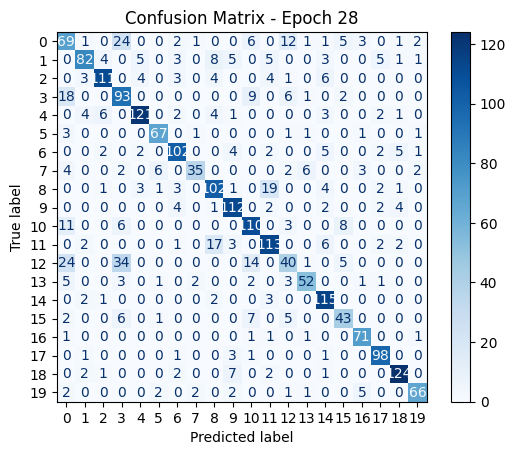

Epoch 28/45 - Train Loss: 0.7917, Train Acc: 0.9258, Val Loss: 1.2235, Val Acc: 0.7695, precision: 0.7777, recall: 0.7671, f1: 0.7679
Best model saved with val accuracy: 0.7695!
Epoch [29/45]

Epoch 29/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8848, Accuracy: 92.03%
Batch 20/719, Loss: 0.7353, Accuracy: 92.03%
Batch 30/719, Loss: 0.7724, Accuracy: 92.08%
Batch 40/719, Loss: 0.7799, Accuracy: 92.62%
Batch 50/719, Loss: 0.8864, Accuracy: 92.34%
Batch 60/719, Loss: 0.8229, Accuracy: 92.53%
Batch 70/719, Loss: 0.8279, Accuracy: 92.79%
Batch 80/719, Loss: 0.7827, Accuracy: 92.77%
Batch 90/719, Loss: 0.8990, Accuracy: 92.76%
Batch 100/719, Loss: 0.7700, Accuracy: 92.73%
Batch 110/719, Loss: 0.8435, Accuracy: 92.71%
Batch 120/719, Loss: 0.7575, Accuracy: 92.83%
Batch 130/719, Loss: 1.0251, Accuracy: 92.56%
Batch 140/719, Loss: 0.6721, Accuracy: 92.56%
Batch 150/719, Loss: 0.7248, Accuracy: 92.54%
Batch 160/719, Loss: 0.7338, Accuracy: 92.70%
Batch 170/719, Loss: 0.8178, Accuracy: 92.

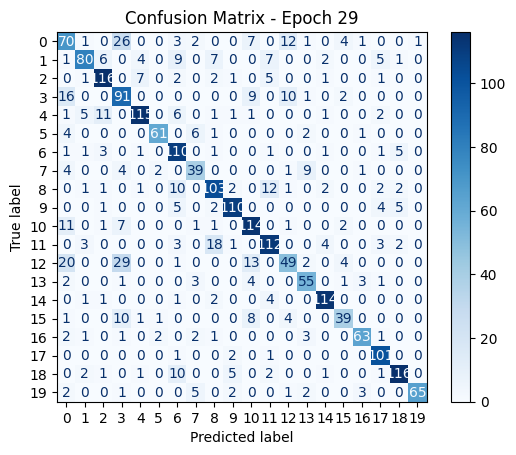

Epoch 29/45 - Train Loss: 0.7853, Train Acc: 0.9277, Val Loss: 1.2368, Val Acc: 0.7682, precision: 0.7796, recall: 0.7640, f1: 0.7674
Epoch [30/45]

Epoch 30/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7155, Accuracy: 93.91%
Batch 20/719, Loss: 0.9000, Accuracy: 92.73%
Batch 30/719, Loss: 0.8040, Accuracy: 92.55%
Batch 40/719, Loss: 0.7628, Accuracy: 92.77%
Batch 50/719, Loss: 0.7360, Accuracy: 92.72%
Batch 60/719, Loss: 0.7856, Accuracy: 92.89%
Batch 70/719, Loss: 0.7830, Accuracy: 92.72%
Batch 80/719, Loss: 0.7901, Accuracy: 92.77%
Batch 90/719, Loss: 0.8221, Accuracy: 92.74%
Batch 100/719, Loss: 0.7548, Accuracy: 92.70%
Batch 110/719, Loss: 0.8432, Accuracy: 92.56%
Batch 120/719, Loss: 0.7963, Accuracy: 92.66%
Batch 130/719, Loss: 0.6858, Accuracy: 92.74%
Batch 140/719, Loss: 0.7399, Accuracy: 92.82%
Batch 150/719, Loss: 0.8039, Accuracy: 92.82%
Batch 160/719, Loss: 0.7675, Accuracy: 92.84%
Batch 170/719, Loss: 0.8662, Accuracy: 92.91%
Batch 180/719, Loss: 0.8113, Accuracy: 9

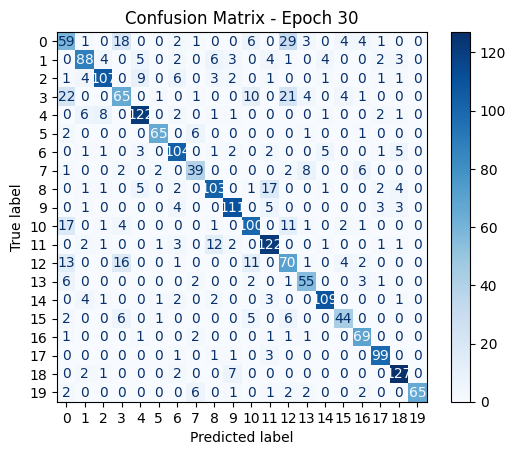

Epoch 30/45 - Train Loss: 0.7793, Train Acc: 0.9311, Val Loss: 1.2346, Val Acc: 0.7682, precision: 0.7741, recall: 0.7687, f1: 0.7696
Epoch [31/45]

Epoch 31/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8526, Accuracy: 92.81%
Batch 20/719, Loss: 0.8718, Accuracy: 91.41%
Batch 30/719, Loss: 0.6986, Accuracy: 92.60%
Batch 40/719, Loss: 0.7908, Accuracy: 92.42%
Batch 50/719, Loss: 0.7449, Accuracy: 92.44%
Batch 60/719, Loss: 0.7199, Accuracy: 92.66%
Batch 70/719, Loss: 0.8799, Accuracy: 92.61%
Batch 80/719, Loss: 0.8614, Accuracy: 92.60%
Batch 90/719, Loss: 0.7808, Accuracy: 92.93%
Batch 100/719, Loss: 0.8761, Accuracy: 92.86%
Batch 110/719, Loss: 0.8904, Accuracy: 92.73%
Batch 120/719, Loss: 0.7724, Accuracy: 92.86%
Batch 130/719, Loss: 0.8573, Accuracy: 92.92%
Batch 140/719, Loss: 0.6558, Accuracy: 92.89%
Batch 150/719, Loss: 0.7962, Accuracy: 92.94%
Batch 160/719, Loss: 0.8421, Accuracy: 93.11%
Batch 170/719, Loss: 0.7835, Accuracy: 93.16%
Batch 180/719, Loss: 0.7857, Accuracy: 9

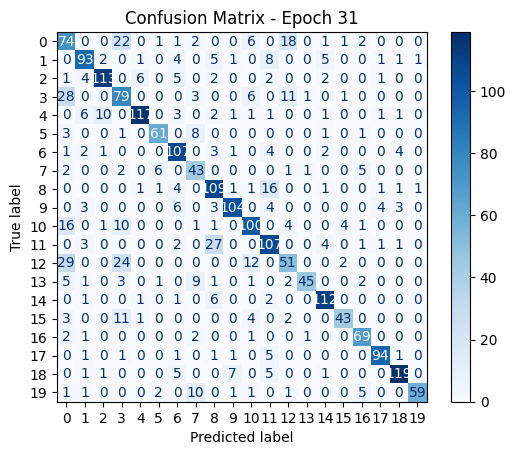

Epoch 31/45 - Train Loss: 0.7773, Train Acc: 0.9311, Val Loss: 1.2645, Val Acc: 0.7575, precision: 0.7774, recall: 0.7550, f1: 0.7610
Epoch [32/45]

Epoch 32/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8198, Accuracy: 94.06%
Batch 20/719, Loss: 0.8367, Accuracy: 93.28%
Batch 30/719, Loss: 0.8487, Accuracy: 93.44%
Batch 40/719, Loss: 0.8137, Accuracy: 93.52%
Batch 50/719, Loss: 0.7186, Accuracy: 93.62%
Batch 60/719, Loss: 0.7431, Accuracy: 93.98%
Batch 70/719, Loss: 0.8170, Accuracy: 93.79%
Batch 80/719, Loss: 0.7894, Accuracy: 93.79%
Batch 90/719, Loss: 0.7091, Accuracy: 93.78%
Batch 100/719, Loss: 0.8336, Accuracy: 93.69%
Batch 110/719, Loss: 0.7782, Accuracy: 93.57%
Batch 120/719, Loss: 0.7246, Accuracy: 93.44%
Batch 130/719, Loss: 0.6977, Accuracy: 93.44%
Batch 140/719, Loss: 0.7322, Accuracy: 93.43%
Batch 150/719, Loss: 0.8125, Accuracy: 93.35%
Batch 160/719, Loss: 0.7641, Accuracy: 93.31%
Batch 170/719, Loss: 0.7121, Accuracy: 93.35%
Batch 180/719, Loss: 0.8936, Accuracy: 9

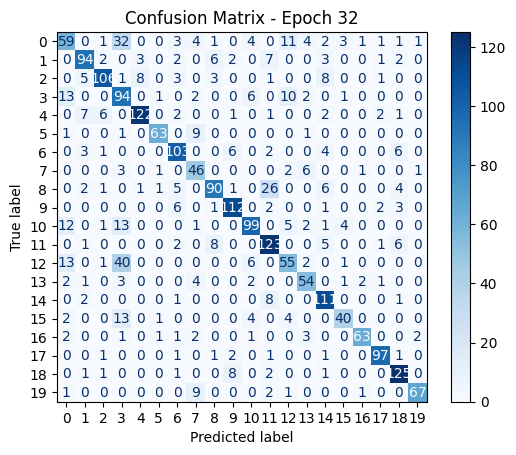

Epoch 32/45 - Train Loss: 0.7660, Train Acc: 0.9355, Val Loss: 1.2647, Val Acc: 0.7682, precision: 0.7831, recall: 0.7680, f1: 0.7703
Epoch [33/45]

Epoch 33/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9215, Accuracy: 92.97%
Batch 20/719, Loss: 0.8405, Accuracy: 92.89%
Batch 30/719, Loss: 0.7304, Accuracy: 93.02%
Batch 40/719, Loss: 0.7825, Accuracy: 93.36%
Batch 50/719, Loss: 0.8601, Accuracy: 93.38%
Batch 60/719, Loss: 0.7149, Accuracy: 93.59%
Batch 70/719, Loss: 0.8596, Accuracy: 93.68%
Batch 80/719, Loss: 0.7232, Accuracy: 93.77%
Batch 90/719, Loss: 0.8343, Accuracy: 93.75%
Batch 100/719, Loss: 0.6945, Accuracy: 93.80%
Batch 110/719, Loss: 0.7087, Accuracy: 93.79%
Batch 120/719, Loss: 0.8098, Accuracy: 93.70%
Batch 130/719, Loss: 0.6807, Accuracy: 93.74%
Batch 140/719, Loss: 0.7604, Accuracy: 93.78%
Batch 150/719, Loss: 0.7528, Accuracy: 93.74%
Batch 160/719, Loss: 0.7799, Accuracy: 93.76%
Batch 170/719, Loss: 0.7304, Accuracy: 93.73%
Batch 180/719, Loss: 0.7345, Accuracy: 9

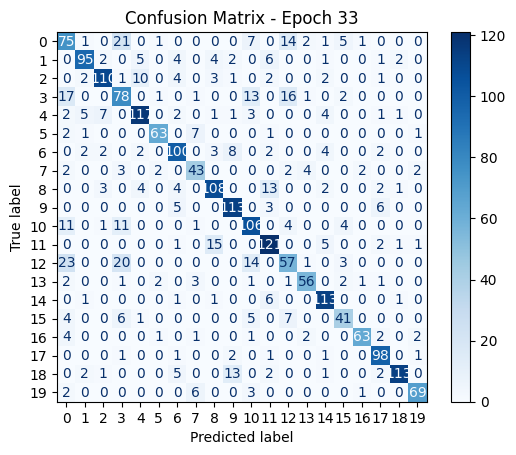

Epoch 33/45 - Train Loss: 0.7617, Train Acc: 0.9371, Val Loss: 1.2009, Val Acc: 0.7753, precision: 0.7849, recall: 0.7746, f1: 0.7781
Best model saved with val accuracy: 0.7753!
Epoch [34/45]

Epoch 34/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7887, Accuracy: 93.44%
Batch 20/719, Loss: 0.7524, Accuracy: 92.97%
Batch 30/719, Loss: 0.7329, Accuracy: 93.12%
Batch 40/719, Loss: 0.7076, Accuracy: 93.44%
Batch 50/719, Loss: 0.7224, Accuracy: 93.59%
Batch 60/719, Loss: 0.6869, Accuracy: 93.96%
Batch 70/719, Loss: 0.7776, Accuracy: 94.22%
Batch 80/719, Loss: 0.7485, Accuracy: 94.20%
Batch 90/719, Loss: 0.7994, Accuracy: 94.41%
Batch 100/719, Loss: 0.7869, Accuracy: 94.17%
Batch 110/719, Loss: 0.7474, Accuracy: 94.16%
Batch 120/719, Loss: 0.7155, Accuracy: 94.13%
Batch 130/719, Loss: 0.7690, Accuracy: 94.18%
Batch 140/719, Loss: 0.8292, Accuracy: 94.12%
Batch 150/719, Loss: 0.8287, Accuracy: 94.06%
Batch 160/719, Loss: 0.8708, Accuracy: 94.07%
Batch 170/719, Loss: 0.6746, Accuracy: 94.

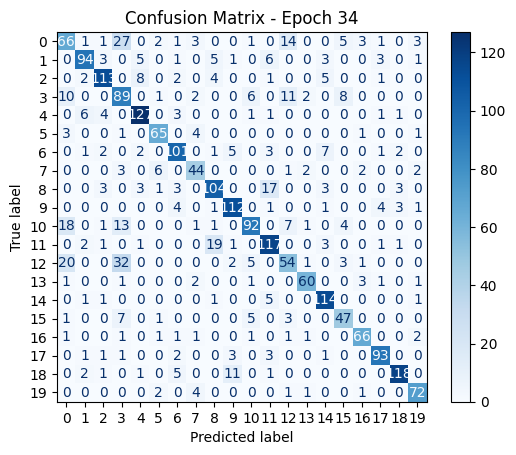

Epoch 34/45 - Train Loss: 0.7555, Train Acc: 0.9395, Val Loss: 1.2210, Val Acc: 0.7793, precision: 0.7846, recall: 0.7837, f1: 0.7821
Best model saved with val accuracy: 0.7793!
Epoch [35/45]

Epoch 35/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7400, Accuracy: 94.06%
Batch 20/719, Loss: 0.7494, Accuracy: 93.52%
Batch 30/719, Loss: 0.7873, Accuracy: 93.65%
Batch 40/719, Loss: 0.7756, Accuracy: 93.16%
Batch 50/719, Loss: 0.7294, Accuracy: 93.41%
Batch 60/719, Loss: 0.7005, Accuracy: 93.39%
Batch 70/719, Loss: 0.7555, Accuracy: 93.35%
Batch 80/719, Loss: 0.7678, Accuracy: 93.48%
Batch 90/719, Loss: 0.7150, Accuracy: 93.56%
Batch 100/719, Loss: 0.7904, Accuracy: 93.34%
Batch 110/719, Loss: 0.7048, Accuracy: 93.38%
Batch 120/719, Loss: 0.7604, Accuracy: 93.27%
Batch 130/719, Loss: 0.7222, Accuracy: 93.29%
Batch 140/719, Loss: 0.6936, Accuracy: 93.33%
Batch 150/719, Loss: 0.7588, Accuracy: 93.41%
Batch 160/719, Loss: 0.7286, Accuracy: 93.45%
Batch 170/719, Loss: 0.6739, Accuracy: 93.

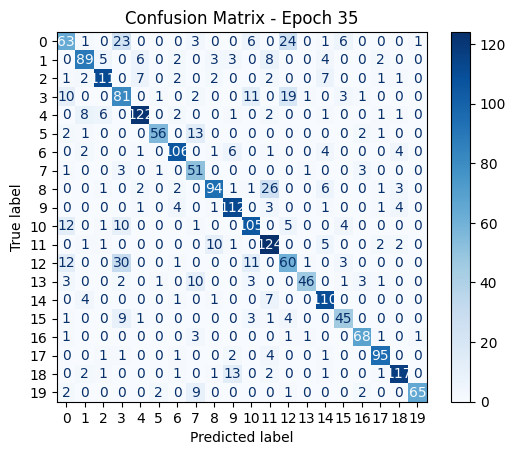

Epoch 35/45 - Train Loss: 0.7601, Train Acc: 0.9369, Val Loss: 1.2579, Val Acc: 0.7668, precision: 0.7811, recall: 0.7671, f1: 0.7689
Epoch [36/45]

Epoch 36/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7380, Accuracy: 93.28%
Batch 20/719, Loss: 0.7245, Accuracy: 93.28%
Batch 30/719, Loss: 0.7632, Accuracy: 94.27%
Batch 40/719, Loss: 0.7753, Accuracy: 94.18%
Batch 50/719, Loss: 0.7712, Accuracy: 94.16%
Batch 60/719, Loss: 0.7337, Accuracy: 94.32%
Batch 70/719, Loss: 0.7550, Accuracy: 94.40%
Batch 80/719, Loss: 0.6772, Accuracy: 94.43%
Batch 90/719, Loss: 0.6993, Accuracy: 94.53%
Batch 100/719, Loss: 0.7276, Accuracy: 94.50%
Batch 110/719, Loss: 0.6732, Accuracy: 94.67%
Batch 120/719, Loss: 0.7486, Accuracy: 94.66%
Batch 130/719, Loss: 0.8003, Accuracy: 94.54%
Batch 140/719, Loss: 0.7834, Accuracy: 94.46%
Batch 150/719, Loss: 0.6813, Accuracy: 94.34%
Batch 160/719, Loss: 0.8778, Accuracy: 94.42%
Batch 170/719, Loss: 0.9164, Accuracy: 94.38%
Batch 180/719, Loss: 0.7985, Accuracy: 9

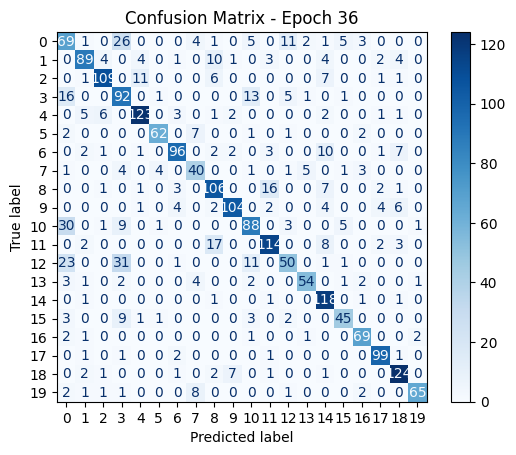

Epoch 36/45 - Train Loss: 0.7490, Train Acc: 0.9427, Val Loss: 1.2762, Val Acc: 0.7650, precision: 0.7801, recall: 0.7656, f1: 0.7684
Epoch [37/45]

Epoch 37/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7529, Accuracy: 93.59%
Batch 20/719, Loss: 0.8192, Accuracy: 93.59%
Batch 30/719, Loss: 0.7563, Accuracy: 93.91%
Batch 40/719, Loss: 0.6753, Accuracy: 94.26%
Batch 50/719, Loss: 0.7657, Accuracy: 94.44%
Batch 60/719, Loss: 0.7950, Accuracy: 94.48%
Batch 70/719, Loss: 0.7004, Accuracy: 94.60%
Batch 80/719, Loss: 0.7288, Accuracy: 94.59%
Batch 90/719, Loss: 0.6896, Accuracy: 94.74%
Batch 100/719, Loss: 0.6911, Accuracy: 94.69%
Batch 110/719, Loss: 0.6579, Accuracy: 94.73%
Batch 120/719, Loss: 0.6887, Accuracy: 94.78%
Batch 130/719, Loss: 0.7553, Accuracy: 94.76%
Batch 140/719, Loss: 0.7028, Accuracy: 94.79%
Batch 150/719, Loss: 0.7471, Accuracy: 94.76%
Batch 160/719, Loss: 0.7680, Accuracy: 94.73%
Batch 170/719, Loss: 0.7261, Accuracy: 94.73%
Batch 180/719, Loss: 0.7275, Accuracy: 9

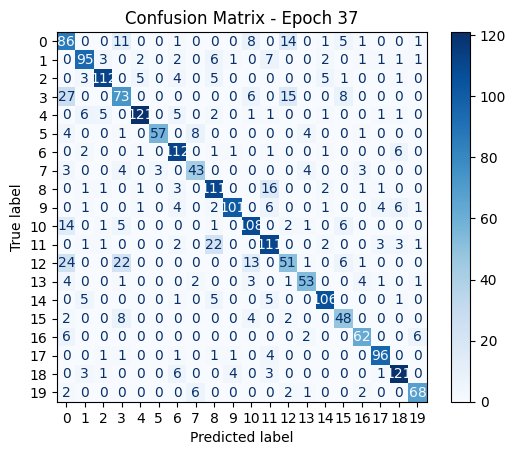

Epoch 37/45 - Train Loss: 0.7437, Train Acc: 0.9443, Val Loss: 1.2296, Val Acc: 0.7735, precision: 0.7825, recall: 0.7721, f1: 0.7745
Epoch [38/45]

Epoch 38/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.6998, Accuracy: 94.06%
Batch 20/719, Loss: 0.7720, Accuracy: 93.44%
Batch 30/719, Loss: 0.7062, Accuracy: 93.12%
Batch 40/719, Loss: 0.7313, Accuracy: 93.32%
Batch 50/719, Loss: 0.7107, Accuracy: 93.78%
Batch 60/719, Loss: 0.6996, Accuracy: 93.93%
Batch 70/719, Loss: 0.7341, Accuracy: 94.17%
Batch 80/719, Loss: 0.6928, Accuracy: 94.38%
Batch 90/719, Loss: 0.6576, Accuracy: 94.58%
Batch 100/719, Loss: 0.7428, Accuracy: 94.59%
Batch 110/719, Loss: 0.7233, Accuracy: 94.55%
Batch 120/719, Loss: 0.7150, Accuracy: 94.60%
Batch 130/719, Loss: 0.7384, Accuracy: 94.54%
Batch 140/719, Loss: 0.6723, Accuracy: 94.65%
Batch 150/719, Loss: 0.7332, Accuracy: 94.64%
Batch 160/719, Loss: 0.7617, Accuracy: 94.69%
Batch 170/719, Loss: 0.7177, Accuracy: 94.72%
Batch 180/719, Loss: 0.8179, Accuracy: 9

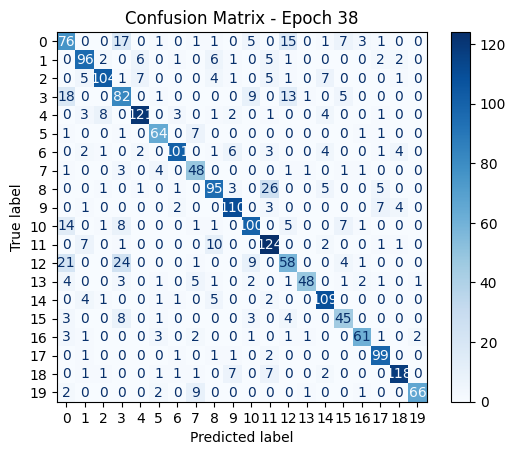

Epoch 38/45 - Train Loss: 0.7427, Train Acc: 0.9430, Val Loss: 1.2727, Val Acc: 0.7691, precision: 0.7785, recall: 0.7696, f1: 0.7707
Epoch [39/45]

Epoch 39/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8469, Accuracy: 92.97%
Batch 20/719, Loss: 0.8460, Accuracy: 93.05%
Batch 30/719, Loss: 0.7066, Accuracy: 93.39%
Batch 40/719, Loss: 0.7411, Accuracy: 93.67%
Batch 50/719, Loss: 0.7032, Accuracy: 93.75%
Batch 60/719, Loss: 0.6896, Accuracy: 93.93%
Batch 70/719, Loss: 0.7387, Accuracy: 94.04%
Batch 80/719, Loss: 0.8101, Accuracy: 94.30%
Batch 90/719, Loss: 0.6567, Accuracy: 94.48%
Batch 100/719, Loss: 0.8097, Accuracy: 94.50%
Batch 110/719, Loss: 0.7637, Accuracy: 94.49%
Batch 120/719, Loss: 0.8392, Accuracy: 94.44%
Batch 130/719, Loss: 0.7329, Accuracy: 94.40%
Batch 140/719, Loss: 0.7162, Accuracy: 94.51%
Batch 150/719, Loss: 0.6324, Accuracy: 94.52%
Batch 160/719, Loss: 0.7143, Accuracy: 94.58%
Batch 170/719, Loss: 0.7034, Accuracy: 94.60%
Batch 180/719, Loss: 0.7739, Accuracy: 9

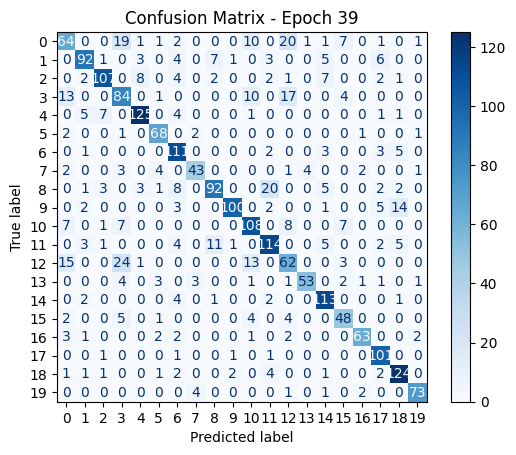

Epoch 39/45 - Train Loss: 0.7378, Train Acc: 0.9460, Val Loss: 1.2289, Val Acc: 0.7780, precision: 0.7890, recall: 0.7815, f1: 0.7821
Epoch [40/45]

Epoch 40/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7955, Accuracy: 95.16%
Batch 20/719, Loss: 0.6422, Accuracy: 94.61%
Batch 30/719, Loss: 0.6956, Accuracy: 94.48%
Batch 40/719, Loss: 0.7158, Accuracy: 94.80%
Batch 50/719, Loss: 0.6601, Accuracy: 94.75%
Batch 60/719, Loss: 0.7112, Accuracy: 94.69%
Batch 70/719, Loss: 0.7026, Accuracy: 94.80%
Batch 80/719, Loss: 0.7900, Accuracy: 94.73%
Batch 90/719, Loss: 0.7107, Accuracy: 94.65%
Batch 100/719, Loss: 0.8521, Accuracy: 94.44%
Batch 110/719, Loss: 0.6460, Accuracy: 94.67%
Batch 120/719, Loss: 0.7376, Accuracy: 94.62%
Batch 130/719, Loss: 0.7758, Accuracy: 94.66%
Batch 140/719, Loss: 0.6729, Accuracy: 94.78%
Batch 150/719, Loss: 0.7040, Accuracy: 94.84%
Batch 160/719, Loss: 0.6725, Accuracy: 94.87%
Batch 170/719, Loss: 0.7150, Accuracy: 94.92%
Batch 180/719, Loss: 0.6674, Accuracy: 9

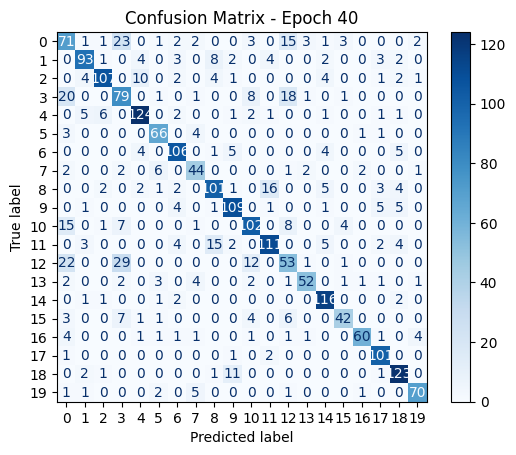

Epoch 40/45 - Train Loss: 0.7354, Train Acc: 0.9467, Val Loss: 1.2234, Val Acc: 0.7713, precision: 0.7805, recall: 0.7713, f1: 0.7737
Epoch [41/45]

Epoch 41/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7721, Accuracy: 94.06%
Batch 20/719, Loss: 0.7667, Accuracy: 94.14%
Batch 30/719, Loss: 0.6467, Accuracy: 94.53%
Batch 40/719, Loss: 0.8529, Accuracy: 94.65%
Batch 50/719, Loss: 0.7381, Accuracy: 94.72%
Batch 60/719, Loss: 0.7287, Accuracy: 94.82%
Batch 70/719, Loss: 0.7504, Accuracy: 94.71%
Batch 80/719, Loss: 0.8187, Accuracy: 94.86%
Batch 90/719, Loss: 0.7137, Accuracy: 95.05%
Batch 100/719, Loss: 0.7398, Accuracy: 95.09%
Batch 110/719, Loss: 0.6704, Accuracy: 94.96%
Batch 120/719, Loss: 0.8394, Accuracy: 94.93%
Batch 130/719, Loss: 0.7158, Accuracy: 94.88%
Batch 140/719, Loss: 0.6736, Accuracy: 94.91%
Batch 150/719, Loss: 0.7373, Accuracy: 94.93%
Batch 160/719, Loss: 0.7377, Accuracy: 94.95%
Batch 170/719, Loss: 0.6768, Accuracy: 95.02%
Batch 180/719, Loss: 0.8317, Accuracy: 9

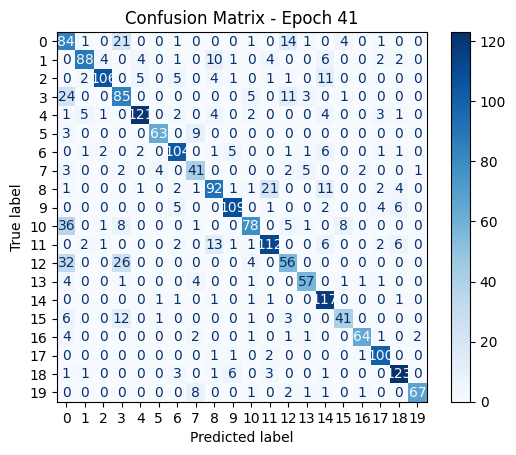

Epoch 41/45 - Train Loss: 0.7310, Train Acc: 0.9488, Val Loss: 1.2651, Val Acc: 0.7615, precision: 0.7830, recall: 0.7630, f1: 0.7677
Epoch [42/45]

Epoch 42/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7427, Accuracy: 94.69%
Batch 20/719, Loss: 0.6989, Accuracy: 94.69%
Batch 30/719, Loss: 0.7716, Accuracy: 94.53%
Batch 40/719, Loss: 0.7231, Accuracy: 95.08%
Batch 50/719, Loss: 0.7875, Accuracy: 94.94%
Batch 60/719, Loss: 0.6969, Accuracy: 94.71%
Batch 70/719, Loss: 0.7993, Accuracy: 94.69%
Batch 80/719, Loss: 0.6895, Accuracy: 94.73%
Batch 90/719, Loss: 0.7656, Accuracy: 94.83%
Batch 100/719, Loss: 0.9688, Accuracy: 94.86%
Batch 110/719, Loss: 0.7304, Accuracy: 94.80%
Batch 120/719, Loss: 0.7027, Accuracy: 94.86%
Batch 130/719, Loss: 0.6973, Accuracy: 94.92%
Batch 140/719, Loss: 0.6883, Accuracy: 94.91%
Batch 150/719, Loss: 0.8291, Accuracy: 94.89%
Batch 160/719, Loss: 0.6459, Accuracy: 95.05%
Batch 170/719, Loss: 0.8147, Accuracy: 95.06%
Batch 180/719, Loss: 0.7307, Accuracy: 9

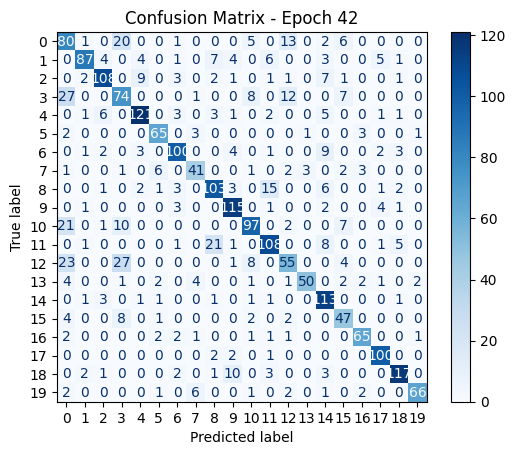

Epoch 42/45 - Train Loss: 0.7241, Train Acc: 0.9505, Val Loss: 1.2842, Val Acc: 0.7633, precision: 0.7769, recall: 0.7647, f1: 0.7670
Epoch [43/45]

Epoch 43/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.6878, Accuracy: 95.78%
Batch 20/719, Loss: 0.7318, Accuracy: 94.77%
Batch 30/719, Loss: 0.6562, Accuracy: 95.05%
Batch 40/719, Loss: 0.7896, Accuracy: 95.16%
Batch 50/719, Loss: 0.6705, Accuracy: 95.03%
Batch 60/719, Loss: 0.6786, Accuracy: 95.16%
Batch 70/719, Loss: 0.7377, Accuracy: 95.04%
Batch 80/719, Loss: 0.7109, Accuracy: 95.02%
Batch 90/719, Loss: 0.6361, Accuracy: 95.14%
Batch 100/719, Loss: 0.7677, Accuracy: 95.14%
Batch 110/719, Loss: 0.8209, Accuracy: 94.99%
Batch 120/719, Loss: 0.6932, Accuracy: 95.01%
Batch 130/719, Loss: 0.7724, Accuracy: 94.94%
Batch 140/719, Loss: 0.6734, Accuracy: 94.97%
Batch 150/719, Loss: 0.7410, Accuracy: 95.04%
Batch 160/719, Loss: 0.7618, Accuracy: 95.00%
Batch 170/719, Loss: 0.6392, Accuracy: 95.01%
Batch 180/719, Loss: 0.7642, Accuracy: 9

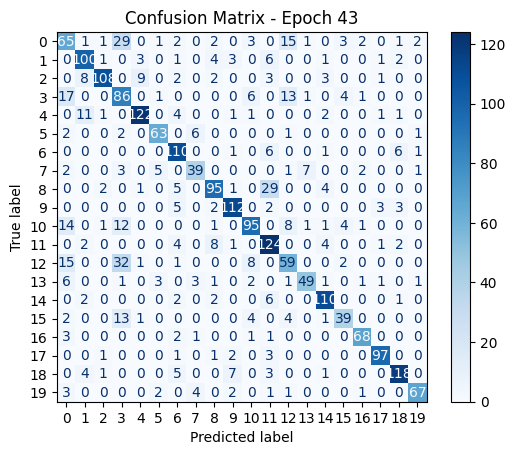

Epoch 43/45 - Train Loss: 0.7240, Train Acc: 0.9519, Val Loss: 1.2369, Val Acc: 0.7695, precision: 0.7842, recall: 0.7658, f1: 0.7718
Epoch [44/45]

Epoch 44/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.7963, Accuracy: 94.53%
Batch 20/719, Loss: 0.7528, Accuracy: 94.61%
Batch 30/719, Loss: 0.8514, Accuracy: 94.79%
Batch 40/719, Loss: 0.7022, Accuracy: 94.88%
Batch 50/719, Loss: 0.7029, Accuracy: 94.91%
Batch 60/719, Loss: 0.6808, Accuracy: 94.95%
Batch 70/719, Loss: 0.6509, Accuracy: 94.91%
Batch 80/719, Loss: 0.7049, Accuracy: 95.04%
Batch 90/719, Loss: 0.7138, Accuracy: 95.14%
Batch 100/719, Loss: 0.8027, Accuracy: 95.11%
Batch 110/719, Loss: 0.8164, Accuracy: 95.00%
Batch 120/719, Loss: 0.7413, Accuracy: 95.03%
Batch 130/719, Loss: 0.6682, Accuracy: 95.06%
Batch 140/719, Loss: 0.6774, Accuracy: 95.13%
Batch 150/719, Loss: 0.6585, Accuracy: 95.11%
Batch 160/719, Loss: 0.6809, Accuracy: 95.13%
Batch 170/719, Loss: 0.7853, Accuracy: 95.14%
Batch 180/719, Loss: 0.6452, Accuracy: 9

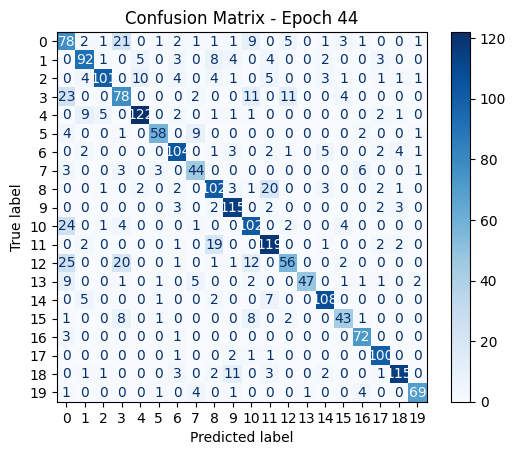

Epoch 44/45 - Train Loss: 0.7221, Train Acc: 0.9523, Val Loss: 1.2553, Val Acc: 0.7691, precision: 0.7862, recall: 0.7688, f1: 0.7726


In [8]:
model = resnetModel2
num_epochs = 45
criterion = LabelSmoothingCrossEntropy(smoothing=0.10)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.009)
scheduler = OneCycleLR(optimizer, max_lr=0.01,
                       steps_per_epoch=len(train_loader), epochs=num_epochs,
                       pct_start=0.2, div_factor=25.0, final_div_factor=1e4)
scaler = GradScaler()
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

historyResnet2, modelResnet2 = train_classification_model(model, train_loader3, val_loader3,0, optimizer, criterion,
                              scheduler=scheduler, num_epochs=num_epochs, device='cuda',
                              use_mixed_precision=False, patience=10, model_name="resnetModel2")

Total parameters: 11,250,988
Epoch [1/45]

Epoch 1/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.9513, Accuracy: 10.31%
Batch 20/719, Loss: 2.7252, Accuracy: 13.75%
Batch 30/719, Loss: 2.6394, Accuracy: 15.89%
Batch 40/719, Loss: 2.9088, Accuracy: 16.45%
Batch 50/719, Loss: 2.6336, Accuracy: 17.38%
Batch 60/719, Loss: 2.7383, Accuracy: 18.26%
Batch 70/719, Loss: 2.7308, Accuracy: 18.79%
Batch 80/719, Loss: 2.7316, Accuracy: 19.24%
Batch 90/719, Loss: 2.4949, Accuracy: 19.86%
Batch 100/719, Loss: 2.5782, Accuracy: 20.23%
Batch 110/719, Loss: 2.3258, Accuracy: 21.11%
Batch 120/719, Loss: 2.4879, Accuracy: 21.74%
Batch 130/719, Loss: 2.2570, Accuracy: 22.45%
Batch 140/719, Loss: 2.3666, Accuracy: 23.04%
Batch 150/719, Loss: 2.2395, Accuracy: 23.43%
Batch 160/719, Loss: 2.2666, Accuracy: 24.03%
Batch 170/719, Loss: 2.3013, Accuracy: 24.65%
Batch 180/719, Loss: 2.1210, Accuracy: 25.11%
Batch 190/719, Loss: 2.2291, Accuracy: 25.69%
Batch 200/719, Loss: 2.1379, Accuracy: 26.09%
Batch 210

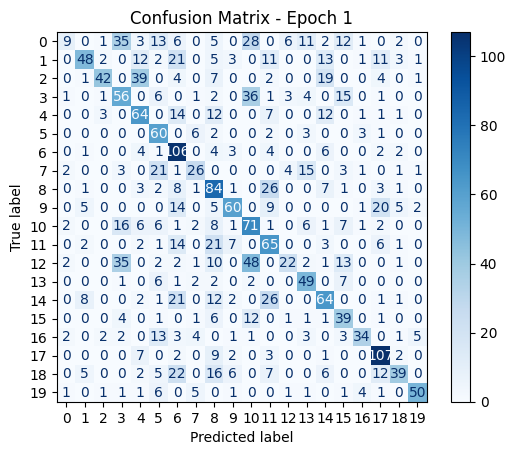

Epoch 1/45 - Train Loss: 2.1580, Train Acc: 0.3731, Val Loss: 1.8630, Val Acc: 0.4882, precision: 0.5392, recall: 0.5018, f1: 0.4825
Best model saved with val accuracy: 0.4882!
Epoch [2/45]

Epoch 2/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.9375, Accuracy: 47.19%
Batch 20/719, Loss: 1.8670, Accuracy: 47.50%
Batch 30/719, Loss: 1.6878, Accuracy: 48.70%
Batch 40/719, Loss: 1.9151, Accuracy: 48.75%
Batch 50/719, Loss: 1.7358, Accuracy: 48.41%
Batch 60/719, Loss: 1.8888, Accuracy: 48.18%
Batch 70/719, Loss: 2.0424, Accuracy: 48.53%
Batch 80/719, Loss: 1.8259, Accuracy: 48.16%
Batch 90/719, Loss: 1.8398, Accuracy: 48.30%
Batch 100/719, Loss: 1.8642, Accuracy: 48.42%
Batch 110/719, Loss: 1.8725, Accuracy: 48.59%
Batch 120/719, Loss: 1.8116, Accuracy: 48.67%
Batch 130/719, Loss: 1.7748, Accuracy: 48.82%
Batch 140/719, Loss: 1.8352, Accuracy: 48.93%
Batch 150/719, Loss: 1.8488, Accuracy: 49.26%
Batch 160/719, Loss: 1.7289, Accuracy: 49.33%
Batch 170/719, Loss: 1.7820, Accuracy: 49.65%

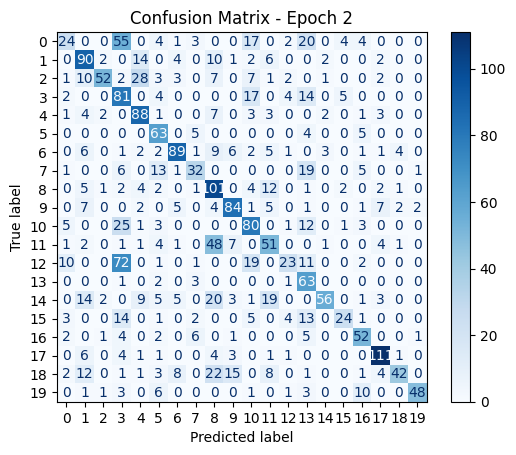

Epoch 2/45 - Train Loss: 1.7396, Train Acc: 0.5330, Val Loss: 1.6919, Val Acc: 0.5591, precision: 0.6184, recall: 0.5707, f1: 0.5557
Best model saved with val accuracy: 0.5591!
Epoch [3/45]

Epoch 3/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7528, Accuracy: 52.66%
Batch 20/719, Loss: 1.5102, Accuracy: 54.77%
Batch 30/719, Loss: 1.5821, Accuracy: 56.61%
Batch 40/719, Loss: 1.7643, Accuracy: 57.11%
Batch 50/719, Loss: 1.5662, Accuracy: 57.34%
Batch 60/719, Loss: 1.7515, Accuracy: 57.40%
Batch 70/719, Loss: 1.6605, Accuracy: 57.66%
Batch 80/719, Loss: 1.5297, Accuracy: 57.93%
Batch 90/719, Loss: 1.6661, Accuracy: 58.02%
Batch 100/719, Loss: 1.6964, Accuracy: 57.89%
Batch 110/719, Loss: 1.6464, Accuracy: 58.07%
Batch 120/719, Loss: 1.6610, Accuracy: 58.10%
Batch 130/719, Loss: 1.4468, Accuracy: 58.28%
Batch 140/719, Loss: 1.7319, Accuracy: 58.34%
Batch 150/719, Loss: 1.5913, Accuracy: 58.51%
Batch 160/719, Loss: 1.6331, Accuracy: 58.47%
Batch 170/719, Loss: 1.6139, Accuracy: 58.46%

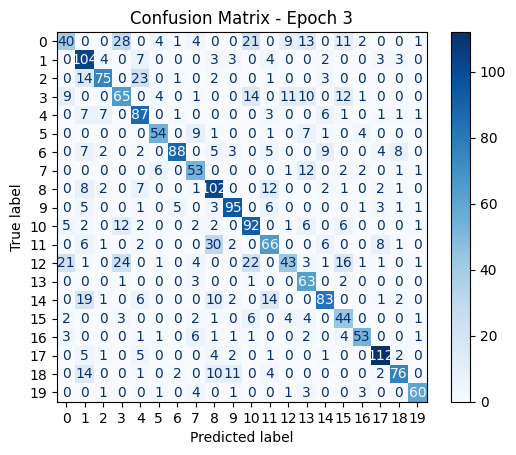

Epoch 3/45 - Train Loss: 1.5530, Train Acc: 0.6090, Val Loss: 1.4813, Val Acc: 0.6487, precision: 0.6648, recall: 0.6629, f1: 0.6517
Best model saved with val accuracy: 0.6487!
Epoch [4/45]

Epoch 4/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6790, Accuracy: 59.38%
Batch 20/719, Loss: 1.4310, Accuracy: 61.80%
Batch 30/719, Loss: 1.4499, Accuracy: 62.81%
Batch 40/719, Loss: 1.5311, Accuracy: 63.91%
Batch 50/719, Loss: 1.4944, Accuracy: 63.75%
Batch 60/719, Loss: 1.4714, Accuracy: 63.57%
Batch 70/719, Loss: 1.7270, Accuracy: 63.88%
Batch 80/719, Loss: 1.4882, Accuracy: 64.12%
Batch 90/719, Loss: 1.4432, Accuracy: 64.55%
Batch 100/719, Loss: 1.4597, Accuracy: 64.47%
Batch 110/719, Loss: 1.4268, Accuracy: 64.63%
Batch 120/719, Loss: 1.6162, Accuracy: 64.39%
Batch 130/719, Loss: 1.3907, Accuracy: 64.47%
Batch 140/719, Loss: 1.4222, Accuracy: 64.52%
Batch 150/719, Loss: 1.4381, Accuracy: 64.66%
Batch 160/719, Loss: 1.6138, Accuracy: 64.36%
Batch 170/719, Loss: 1.5215, Accuracy: 64.43%

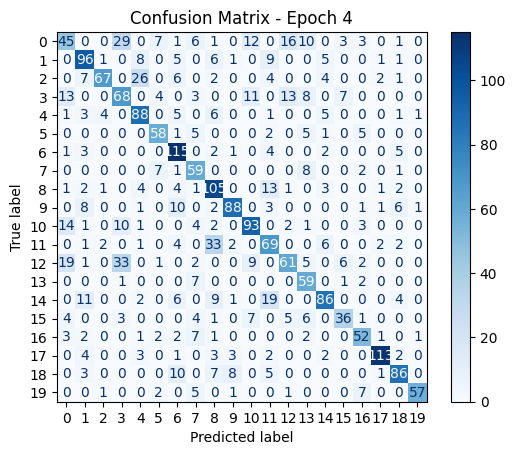

Epoch 4/45 - Train Loss: 1.4292, Train Acc: 0.6638, Val Loss: 1.4463, Val Acc: 0.6692, precision: 0.6835, recall: 0.6770, f1: 0.6722
Best model saved with val accuracy: 0.6692!
Epoch [5/45]

Epoch 5/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4209, Accuracy: 71.09%
Batch 20/719, Loss: 1.1960, Accuracy: 71.72%
Batch 30/719, Loss: 1.3347, Accuracy: 71.04%
Batch 40/719, Loss: 1.4190, Accuracy: 71.13%
Batch 50/719, Loss: 1.3806, Accuracy: 70.78%
Batch 60/719, Loss: 1.2557, Accuracy: 70.23%
Batch 70/719, Loss: 1.2948, Accuracy: 70.54%
Batch 80/719, Loss: 1.2405, Accuracy: 70.51%
Batch 90/719, Loss: 1.3318, Accuracy: 70.26%
Batch 100/719, Loss: 1.3619, Accuracy: 70.16%
Batch 110/719, Loss: 1.4827, Accuracy: 70.16%
Batch 120/719, Loss: 1.3757, Accuracy: 69.92%
Batch 130/719, Loss: 1.1931, Accuracy: 70.05%
Batch 140/719, Loss: 1.4115, Accuracy: 69.98%
Batch 150/719, Loss: 1.3991, Accuracy: 70.00%
Batch 160/719, Loss: 1.3907, Accuracy: 69.86%
Batch 170/719, Loss: 1.2967, Accuracy: 69.96%

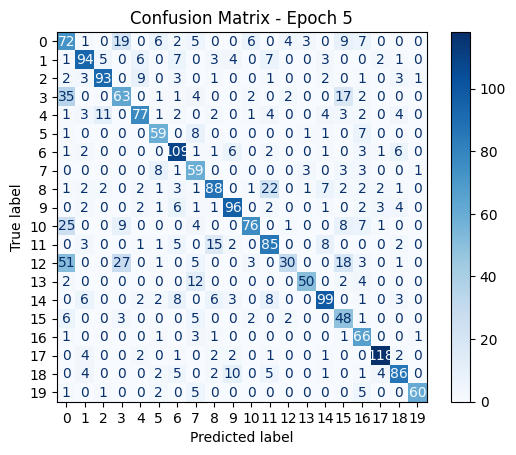

Epoch 5/45 - Train Loss: 1.3291, Train Acc: 0.7084, Val Loss: 1.4064, Val Acc: 0.6812, precision: 0.7062, recall: 0.6956, f1: 0.6849
Best model saved with val accuracy: 0.6812!
Epoch [6/45]

Epoch 6/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7043, Accuracy: 70.47%
Batch 20/719, Loss: 1.1718, Accuracy: 72.89%
Batch 30/719, Loss: 1.2291, Accuracy: 73.80%
Batch 40/719, Loss: 1.2662, Accuracy: 73.63%
Batch 50/719, Loss: 1.3710, Accuracy: 73.50%
Batch 60/719, Loss: 1.1746, Accuracy: 73.78%
Batch 70/719, Loss: 1.2523, Accuracy: 73.95%
Batch 80/719, Loss: 1.1773, Accuracy: 73.67%
Batch 90/719, Loss: 1.1165, Accuracy: 73.70%
Batch 100/719, Loss: 1.3733, Accuracy: 73.44%
Batch 110/719, Loss: 1.2051, Accuracy: 73.17%
Batch 120/719, Loss: 1.3304, Accuracy: 73.03%
Batch 130/719, Loss: 1.0460, Accuracy: 73.06%
Batch 140/719, Loss: 1.3263, Accuracy: 73.01%
Batch 150/719, Loss: 1.2875, Accuracy: 73.05%
Batch 160/719, Loss: 1.1989, Accuracy: 73.21%
Batch 170/719, Loss: 1.3030, Accuracy: 73.35%

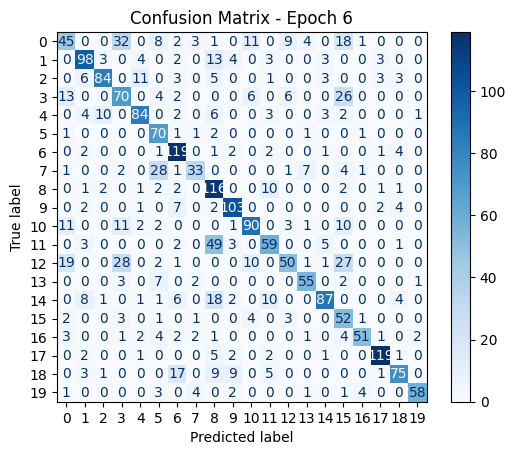

Epoch 6/45 - Train Loss: 1.2417, Train Acc: 0.7442, Val Loss: 1.4082, Val Acc: 0.6768, precision: 0.7055, recall: 0.6847, f1: 0.6777
Epoch [7/45]

Epoch 7/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1969, Accuracy: 76.56%
Batch 20/719, Loss: 1.0287, Accuracy: 77.03%
Batch 30/719, Loss: 1.2342, Accuracy: 77.34%
Batch 40/719, Loss: 1.2557, Accuracy: 77.97%
Batch 50/719, Loss: 1.1276, Accuracy: 77.44%
Batch 60/719, Loss: 1.0929, Accuracy: 77.29%
Batch 70/719, Loss: 1.1937, Accuracy: 77.12%
Batch 80/719, Loss: 1.1051, Accuracy: 76.78%
Batch 90/719, Loss: 1.0685, Accuracy: 76.63%
Batch 100/719, Loss: 1.2328, Accuracy: 76.36%
Batch 110/719, Loss: 1.1449, Accuracy: 76.49%
Batch 120/719, Loss: 1.2176, Accuracy: 76.45%
Batch 130/719, Loss: 0.9419, Accuracy: 76.43%
Batch 140/719, Loss: 1.1972, Accuracy: 76.47%
Batch 150/719, Loss: 1.2172, Accuracy: 76.54%
Batch 160/719, Loss: 1.1507, Accuracy: 76.45%
Batch 170/719, Loss: 1.0775, Accuracy: 76.62%
Batch 180/719, Loss: 1.0887, Accuracy: 76.6

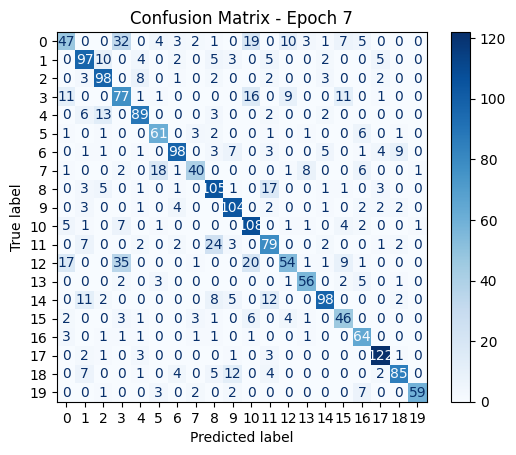

Epoch 7/45 - Train Loss: 1.1852, Train Acc: 0.7680, Val Loss: 1.3350, Val Acc: 0.7075, precision: 0.7172, recall: 0.7146, f1: 0.7077
Best model saved with val accuracy: 0.7075!
Epoch [8/45]

Epoch 8/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3814, Accuracy: 76.56%
Batch 20/719, Loss: 1.0074, Accuracy: 77.97%
Batch 30/719, Loss: 1.0440, Accuracy: 78.49%
Batch 40/719, Loss: 1.2854, Accuracy: 78.59%
Batch 50/719, Loss: 1.1268, Accuracy: 78.56%
Batch 60/719, Loss: 1.1504, Accuracy: 78.88%
Batch 70/719, Loss: 1.2091, Accuracy: 78.95%
Batch 80/719, Loss: 1.0434, Accuracy: 78.98%
Batch 90/719, Loss: 1.0490, Accuracy: 78.89%
Batch 100/719, Loss: 1.2393, Accuracy: 78.56%
Batch 110/719, Loss: 1.0617, Accuracy: 78.68%
Batch 120/719, Loss: 1.3306, Accuracy: 78.48%
Batch 130/719, Loss: 1.0415, Accuracy: 78.49%
Batch 140/719, Loss: 1.1540, Accuracy: 78.42%
Batch 150/719, Loss: 1.1201, Accuracy: 78.66%
Batch 160/719, Loss: 1.1386, Accuracy: 78.53%
Batch 170/719, Loss: 1.1398, Accuracy: 78.69%

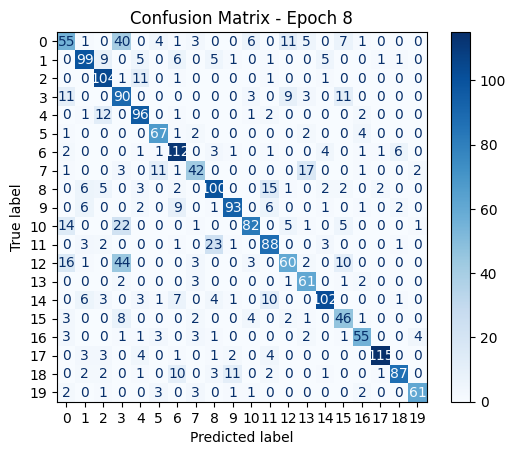

Epoch 8/45 - Train Loss: 1.1272, Train Acc: 0.7935, Val Loss: 1.2999, Val Acc: 0.7200, precision: 0.7332, recall: 0.7275, f1: 0.7230
Best model saved with val accuracy: 0.7200!
Epoch [9/45]

Epoch 9/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2515, Accuracy: 81.72%
Batch 20/719, Loss: 0.9788, Accuracy: 82.34%
Batch 30/719, Loss: 1.1292, Accuracy: 81.67%
Batch 40/719, Loss: 1.0578, Accuracy: 81.45%
Batch 50/719, Loss: 1.1578, Accuracy: 81.09%
Batch 60/719, Loss: 1.0543, Accuracy: 80.78%
Batch 70/719, Loss: 1.1277, Accuracy: 80.80%
Batch 80/719, Loss: 0.9853, Accuracy: 80.74%
Batch 90/719, Loss: 1.2734, Accuracy: 80.59%
Batch 100/719, Loss: 1.2181, Accuracy: 80.25%
Batch 110/719, Loss: 1.0807, Accuracy: 80.21%
Batch 120/719, Loss: 1.2938, Accuracy: 80.17%
Batch 130/719, Loss: 0.9842, Accuracy: 80.34%
Batch 140/719, Loss: 1.1294, Accuracy: 80.42%
Batch 150/719, Loss: 1.3817, Accuracy: 80.28%
Batch 160/719, Loss: 1.0700, Accuracy: 80.29%
Batch 170/719, Loss: 1.1354, Accuracy: 80.24%

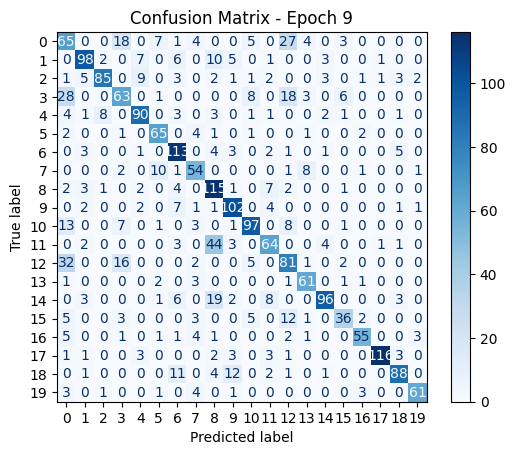

Epoch 9/45 - Train Loss: 1.0920, Train Acc: 0.8081, Val Loss: 1.3246, Val Acc: 0.7156, precision: 0.7383, recall: 0.7201, f1: 0.7239
Epoch [10/45]

Epoch 10/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2220, Accuracy: 80.16%
Batch 20/719, Loss: 0.9548, Accuracy: 81.48%
Batch 30/719, Loss: 1.0441, Accuracy: 81.77%
Batch 40/719, Loss: 1.0487, Accuracy: 82.03%
Batch 50/719, Loss: 1.0829, Accuracy: 81.88%
Batch 60/719, Loss: 1.1528, Accuracy: 81.98%
Batch 70/719, Loss: 1.2008, Accuracy: 82.08%
Batch 80/719, Loss: 1.1519, Accuracy: 81.91%
Batch 90/719, Loss: 0.9234, Accuracy: 82.00%
Batch 100/719, Loss: 0.9360, Accuracy: 82.05%
Batch 110/719, Loss: 1.1479, Accuracy: 82.10%
Batch 120/719, Loss: 1.1117, Accuracy: 82.02%
Batch 130/719, Loss: 0.8714, Accuracy: 82.03%
Batch 140/719, Loss: 1.0647, Accuracy: 82.13%
Batch 150/719, Loss: 1.1908, Accuracy: 82.12%
Batch 160/719, Loss: 1.0315, Accuracy: 81.99%
Batch 170/719, Loss: 0.9467, Accuracy: 82.10%
Batch 180/719, Loss: 0.9763, Accuracy: 82

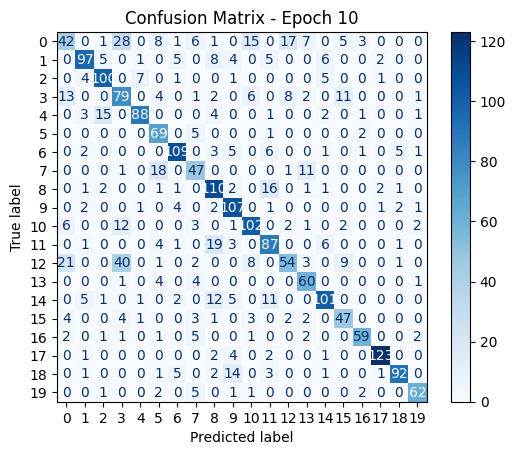

Epoch 10/45 - Train Loss: 1.0507, Train Acc: 0.8243, Val Loss: 1.3004, Val Acc: 0.7289, precision: 0.7325, recall: 0.7384, f1: 0.7289
Best model saved with val accuracy: 0.7289!
Epoch [11/45]

Epoch 11/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1094, Accuracy: 82.97%
Batch 20/719, Loss: 0.9318, Accuracy: 83.20%
Batch 30/719, Loss: 0.9374, Accuracy: 84.17%
Batch 40/719, Loss: 0.9582, Accuracy: 84.45%
Batch 50/719, Loss: 1.1238, Accuracy: 83.81%
Batch 60/719, Loss: 1.0283, Accuracy: 83.70%
Batch 70/719, Loss: 1.0507, Accuracy: 83.71%
Batch 80/719, Loss: 1.0826, Accuracy: 83.55%
Batch 90/719, Loss: 1.1294, Accuracy: 83.63%
Batch 100/719, Loss: 1.1551, Accuracy: 83.31%
Batch 110/719, Loss: 0.9856, Accuracy: 83.42%
Batch 120/719, Loss: 1.0070, Accuracy: 83.42%
Batch 130/719, Loss: 1.0356, Accuracy: 83.46%
Batch 140/719, Loss: 1.0985, Accuracy: 83.46%
Batch 150/719, Loss: 1.1875, Accuracy: 83.33%
Batch 160/719, Loss: 1.1815, Accuracy: 83.34%
Batch 170/719, Loss: 0.9678, Accuracy: 83.

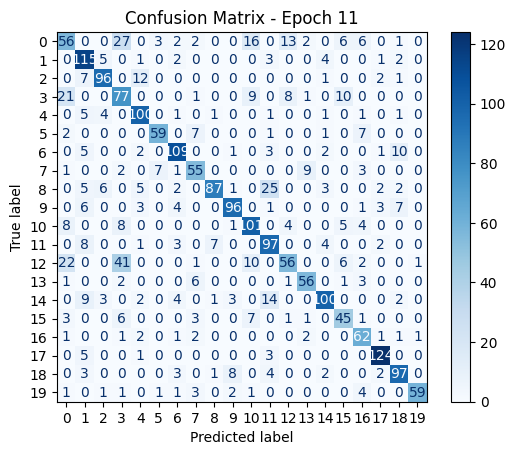

Epoch 11/45 - Train Loss: 1.0161, Train Acc: 0.8397, Val Loss: 1.2643, Val Acc: 0.7343, precision: 0.7461, recall: 0.7410, f1: 0.7375
Best model saved with val accuracy: 0.7343!
Epoch [12/45]

Epoch 12/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1665, Accuracy: 83.44%
Batch 20/719, Loss: 0.8725, Accuracy: 84.45%
Batch 30/719, Loss: 0.8932, Accuracy: 85.42%
Batch 40/719, Loss: 1.0544, Accuracy: 85.43%
Batch 50/719, Loss: 0.9997, Accuracy: 85.69%
Batch 60/719, Loss: 0.9162, Accuracy: 85.16%
Batch 70/719, Loss: 1.1064, Accuracy: 85.20%
Batch 80/719, Loss: 0.9335, Accuracy: 84.75%
Batch 90/719, Loss: 0.9942, Accuracy: 84.67%
Batch 100/719, Loss: 0.8779, Accuracy: 84.62%
Batch 110/719, Loss: 0.9679, Accuracy: 84.77%
Batch 120/719, Loss: 1.0883, Accuracy: 84.86%
Batch 130/719, Loss: 0.7720, Accuracy: 85.05%
Batch 140/719, Loss: 1.1456, Accuracy: 84.96%
Batch 150/719, Loss: 1.0572, Accuracy: 84.98%
Batch 160/719, Loss: 0.9430, Accuracy: 84.93%
Batch 170/719, Loss: 1.1326, Accuracy: 85.

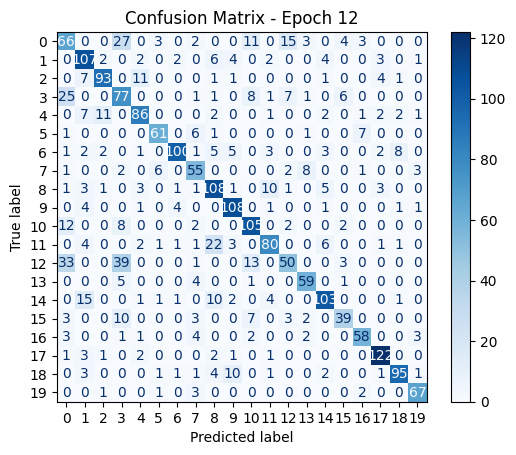

Epoch 12/45 - Train Loss: 0.9859, Train Acc: 0.8517, Val Loss: 1.2711, Val Acc: 0.7307, precision: 0.7449, recall: 0.7372, f1: 0.7366
Epoch [13/45]

Epoch 13/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0397, Accuracy: 85.16%
Batch 20/719, Loss: 0.8702, Accuracy: 86.41%
Batch 30/719, Loss: 0.9722, Accuracy: 86.20%
Batch 40/719, Loss: 0.8554, Accuracy: 85.94%
Batch 50/719, Loss: 1.0423, Accuracy: 85.75%
Batch 60/719, Loss: 0.9740, Accuracy: 85.76%
Batch 70/719, Loss: 1.1452, Accuracy: 85.60%
Batch 80/719, Loss: 0.8474, Accuracy: 85.66%
Batch 90/719, Loss: 0.9440, Accuracy: 85.59%
Batch 100/719, Loss: 0.9213, Accuracy: 85.52%
Batch 110/719, Loss: 1.0182, Accuracy: 85.50%
Batch 120/719, Loss: 0.9306, Accuracy: 85.34%
Batch 130/719, Loss: 0.9838, Accuracy: 85.24%
Batch 140/719, Loss: 0.9000, Accuracy: 85.26%
Batch 150/719, Loss: 1.0787, Accuracy: 85.25%
Batch 160/719, Loss: 1.0072, Accuracy: 85.21%
Batch 170/719, Loss: 0.9794, Accuracy: 85.17%
Batch 180/719, Loss: 0.9803, Accuracy: 8

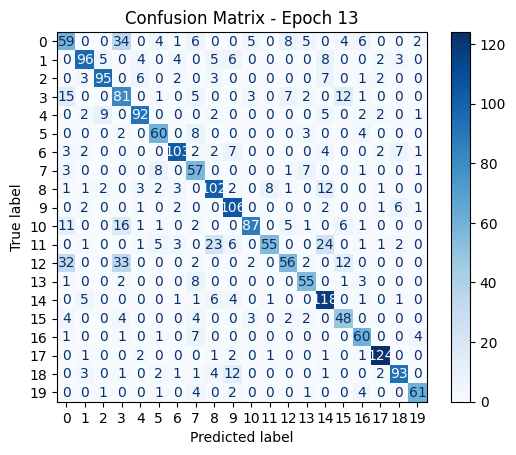

Epoch 13/45 - Train Loss: 0.9658, Train Acc: 0.8592, Val Loss: 1.3513, Val Acc: 0.7169, precision: 0.7289, recall: 0.7258, f1: 0.7179
Epoch [14/45]

Epoch 14/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9419, Accuracy: 86.56%
Batch 20/719, Loss: 0.8495, Accuracy: 86.56%
Batch 30/719, Loss: 0.8607, Accuracy: 86.61%
Batch 40/719, Loss: 0.9781, Accuracy: 86.52%
Batch 50/719, Loss: 1.0791, Accuracy: 86.59%
Batch 60/719, Loss: 0.9760, Accuracy: 86.41%
Batch 70/719, Loss: 1.1152, Accuracy: 86.23%
Batch 80/719, Loss: 0.8550, Accuracy: 86.00%
Batch 90/719, Loss: 0.9500, Accuracy: 86.08%
Batch 100/719, Loss: 0.8933, Accuracy: 86.09%
Batch 110/719, Loss: 1.0216, Accuracy: 86.11%
Batch 120/719, Loss: 1.0213, Accuracy: 85.98%
Batch 130/719, Loss: 0.8457, Accuracy: 86.08%
Batch 140/719, Loss: 0.9502, Accuracy: 86.15%
Batch 150/719, Loss: 0.9282, Accuracy: 86.23%
Batch 160/719, Loss: 0.8943, Accuracy: 86.18%
Batch 170/719, Loss: 1.0643, Accuracy: 86.34%
Batch 180/719, Loss: 0.9183, Accuracy: 8

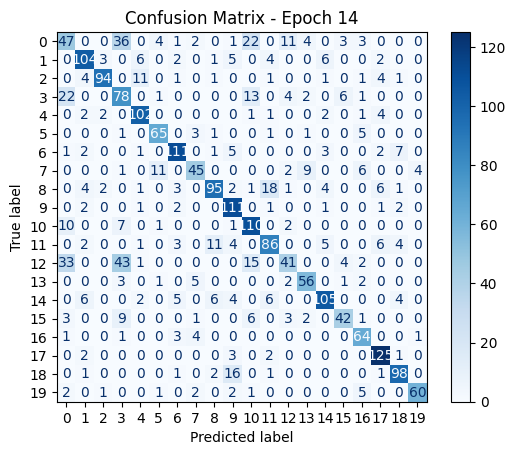

Epoch 14/45 - Train Loss: 0.9414, Train Acc: 0.8680, Val Loss: 1.3007, Val Acc: 0.7307, precision: 0.7418, recall: 0.7372, f1: 0.7324
Epoch [15/45]

Epoch 15/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9818, Accuracy: 85.94%
Batch 20/719, Loss: 0.8798, Accuracy: 86.95%
Batch 30/719, Loss: 0.9238, Accuracy: 87.45%
Batch 40/719, Loss: 0.7874, Accuracy: 87.89%
Batch 50/719, Loss: 0.9042, Accuracy: 87.66%
Batch 60/719, Loss: 0.8200, Accuracy: 87.55%
Batch 70/719, Loss: 1.0404, Accuracy: 87.79%
Batch 80/719, Loss: 0.9262, Accuracy: 87.83%
Batch 90/719, Loss: 0.7828, Accuracy: 87.90%
Batch 100/719, Loss: 0.9371, Accuracy: 87.77%
Batch 110/719, Loss: 0.8884, Accuracy: 87.84%
Batch 120/719, Loss: 1.0835, Accuracy: 87.72%
Batch 130/719, Loss: 0.7472, Accuracy: 87.80%
Batch 140/719, Loss: 0.8928, Accuracy: 87.76%
Batch 150/719, Loss: 0.8901, Accuracy: 87.66%
Batch 160/719, Loss: 0.8155, Accuracy: 87.67%
Batch 170/719, Loss: 0.9575, Accuracy: 87.68%
Batch 180/719, Loss: 0.8763, Accuracy: 8

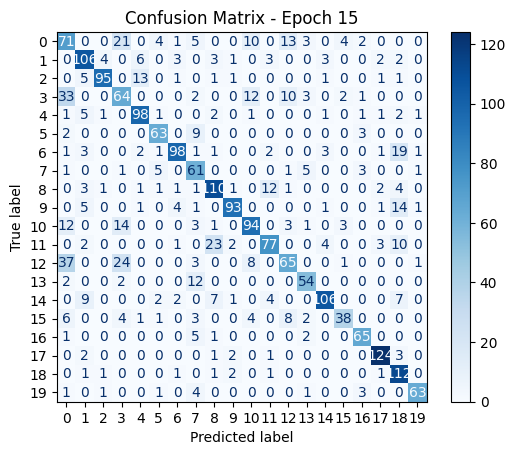

Epoch 15/45 - Train Loss: 0.9178, Train Acc: 0.8780, Val Loss: 1.2836, Val Acc: 0.7387, precision: 0.7576, recall: 0.7451, f1: 0.7455
Best model saved with val accuracy: 0.7387!
Epoch [16/45]

Epoch 16/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0263, Accuracy: 87.66%
Batch 20/719, Loss: 0.7398, Accuracy: 88.20%
Batch 30/719, Loss: 0.9440, Accuracy: 87.71%
Batch 40/719, Loss: 0.8641, Accuracy: 88.05%
Batch 50/719, Loss: 1.0120, Accuracy: 87.91%
Batch 60/719, Loss: 0.9411, Accuracy: 88.07%
Batch 70/719, Loss: 0.9916, Accuracy: 88.10%
Batch 80/719, Loss: 0.8044, Accuracy: 88.24%
Batch 90/719, Loss: 0.8216, Accuracy: 88.37%
Batch 100/719, Loss: 0.9387, Accuracy: 88.20%
Batch 110/719, Loss: 0.8176, Accuracy: 88.22%
Batch 120/719, Loss: 1.0044, Accuracy: 88.11%
Batch 130/719, Loss: 0.9003, Accuracy: 88.17%
Batch 140/719, Loss: 0.9262, Accuracy: 88.18%
Batch 150/719, Loss: 0.8935, Accuracy: 88.19%
Batch 160/719, Loss: 0.8315, Accuracy: 88.27%
Batch 170/719, Loss: 0.9958, Accuracy: 88.

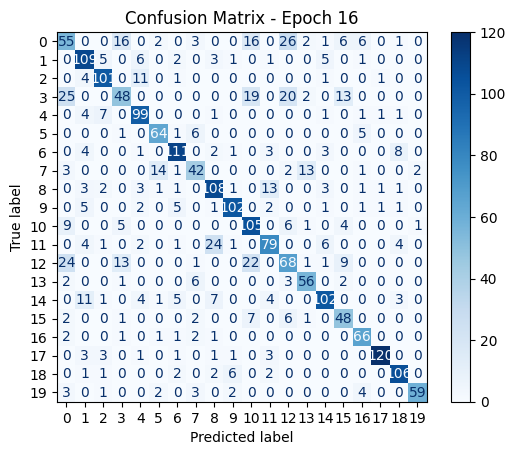

Epoch 16/45 - Train Loss: 0.9097, Train Acc: 0.8815, Val Loss: 1.2820, Val Acc: 0.7347, precision: 0.7368, recall: 0.7408, f1: 0.7353
Epoch [17/45]

Epoch 17/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9401, Accuracy: 86.09%
Batch 20/719, Loss: 0.9069, Accuracy: 87.81%
Batch 30/719, Loss: 0.9385, Accuracy: 87.55%
Batch 40/719, Loss: 0.9061, Accuracy: 88.01%
Batch 50/719, Loss: 0.9797, Accuracy: 88.12%
Batch 60/719, Loss: 0.9293, Accuracy: 88.15%
Batch 70/719, Loss: 0.9508, Accuracy: 88.21%
Batch 80/719, Loss: 0.9003, Accuracy: 88.24%
Batch 90/719, Loss: 0.8764, Accuracy: 88.39%
Batch 100/719, Loss: 0.8569, Accuracy: 88.39%
Batch 110/719, Loss: 0.8520, Accuracy: 88.44%
Batch 120/719, Loss: 0.9508, Accuracy: 88.63%
Batch 130/719, Loss: 0.8088, Accuracy: 88.69%
Batch 140/719, Loss: 0.9341, Accuracy: 88.63%
Batch 150/719, Loss: 0.9659, Accuracy: 88.68%
Batch 160/719, Loss: 0.8435, Accuracy: 88.66%
Batch 170/719, Loss: 0.9727, Accuracy: 88.68%
Batch 180/719, Loss: 0.9397, Accuracy: 8

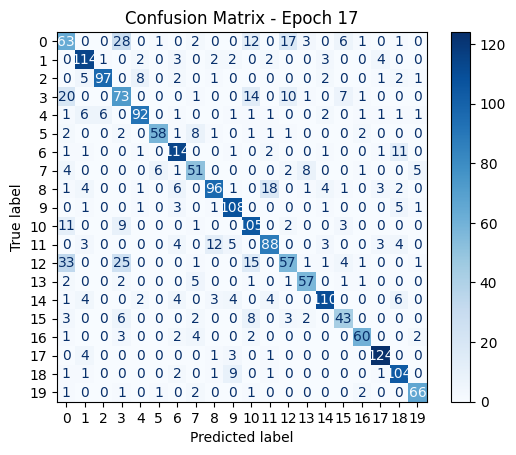

Epoch 17/45 - Train Loss: 0.8951, Train Acc: 0.8859, Val Loss: 1.2824, Val Acc: 0.7490, precision: 0.7586, recall: 0.7529, f1: 0.7529
Best model saved with val accuracy: 0.7490!
Epoch [18/45]

Epoch 18/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9900, Accuracy: 88.75%
Batch 20/719, Loss: 0.7240, Accuracy: 90.23%
Batch 30/719, Loss: 0.9078, Accuracy: 89.11%
Batch 40/719, Loss: 0.8116, Accuracy: 89.41%
Batch 50/719, Loss: 1.0208, Accuracy: 89.41%
Batch 60/719, Loss: 0.9742, Accuracy: 89.11%
Batch 70/719, Loss: 0.9006, Accuracy: 89.13%
Batch 80/719, Loss: 0.8412, Accuracy: 89.16%
Batch 90/719, Loss: 0.7543, Accuracy: 89.08%
Batch 100/719, Loss: 0.7849, Accuracy: 88.73%
Batch 110/719, Loss: 0.8076, Accuracy: 88.74%
Batch 120/719, Loss: 1.0281, Accuracy: 88.80%
Batch 130/719, Loss: 0.8620, Accuracy: 88.82%
Batch 140/719, Loss: 0.8391, Accuracy: 88.93%
Batch 150/719, Loss: 0.9649, Accuracy: 89.01%
Batch 160/719, Loss: 0.7772, Accuracy: 89.07%
Batch 170/719, Loss: 0.8533, Accuracy: 89.

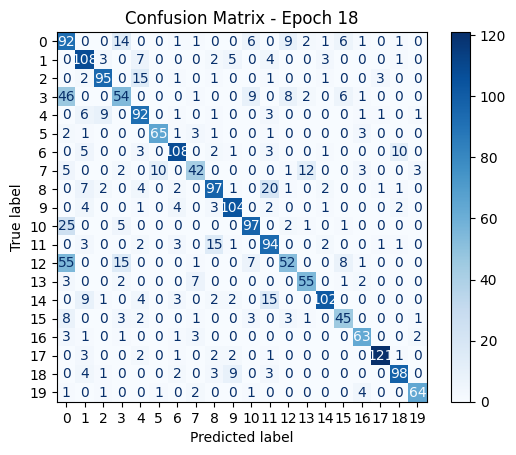

Epoch 18/45 - Train Loss: 0.8765, Train Acc: 0.8921, Val Loss: 1.3083, Val Acc: 0.7347, precision: 0.7556, recall: 0.7402, f1: 0.7412
Epoch [19/45]

Epoch 19/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9965, Accuracy: 88.12%
Batch 20/719, Loss: 0.7703, Accuracy: 89.77%
Batch 30/719, Loss: 0.8610, Accuracy: 89.79%
Batch 40/719, Loss: 0.8517, Accuracy: 90.31%
Batch 50/719, Loss: 0.9406, Accuracy: 90.22%
Batch 60/719, Loss: 0.9897, Accuracy: 90.13%
Batch 70/719, Loss: 0.8651, Accuracy: 90.11%
Batch 80/719, Loss: 0.9485, Accuracy: 90.10%
Batch 90/719, Loss: 0.8306, Accuracy: 90.09%
Batch 100/719, Loss: 0.8722, Accuracy: 89.97%
Batch 110/719, Loss: 0.7806, Accuracy: 90.07%
Batch 120/719, Loss: 0.8812, Accuracy: 90.03%
Batch 130/719, Loss: 0.8187, Accuracy: 90.02%
Batch 140/719, Loss: 0.7711, Accuracy: 90.02%
Batch 150/719, Loss: 0.9266, Accuracy: 90.04%
Batch 160/719, Loss: 0.8962, Accuracy: 89.86%
Batch 170/719, Loss: 0.9345, Accuracy: 89.91%
Batch 180/719, Loss: 0.8041, Accuracy: 8

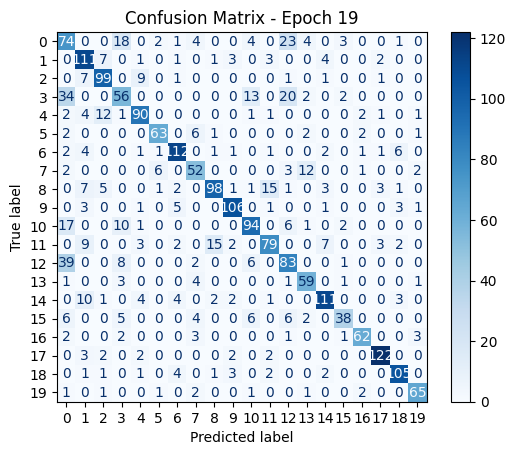

Epoch 19/45 - Train Loss: 0.8635, Train Acc: 0.8991, Val Loss: 1.2794, Val Acc: 0.7486, precision: 0.7635, recall: 0.7520, f1: 0.7549
Epoch [20/45]

Epoch 20/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8773, Accuracy: 90.00%
Batch 20/719, Loss: 0.7225, Accuracy: 90.70%
Batch 30/719, Loss: 0.8615, Accuracy: 90.42%
Batch 40/719, Loss: 0.7454, Accuracy: 90.23%
Batch 50/719, Loss: 0.8498, Accuracy: 90.16%
Batch 60/719, Loss: 0.8883, Accuracy: 90.21%
Batch 70/719, Loss: 0.9043, Accuracy: 90.33%
Batch 80/719, Loss: 0.8503, Accuracy: 90.25%
Batch 90/719, Loss: 0.9874, Accuracy: 90.21%
Batch 100/719, Loss: 0.7735, Accuracy: 90.34%
Batch 110/719, Loss: 0.7792, Accuracy: 90.31%
Batch 120/719, Loss: 0.8288, Accuracy: 90.46%
Batch 130/719, Loss: 0.8869, Accuracy: 90.32%
Batch 140/719, Loss: 0.8525, Accuracy: 90.18%
Batch 150/719, Loss: 0.9419, Accuracy: 90.32%
Batch 160/719, Loss: 0.8239, Accuracy: 90.26%
Batch 170/719, Loss: 0.9949, Accuracy: 90.22%
Batch 180/719, Loss: 0.7963, Accuracy: 9

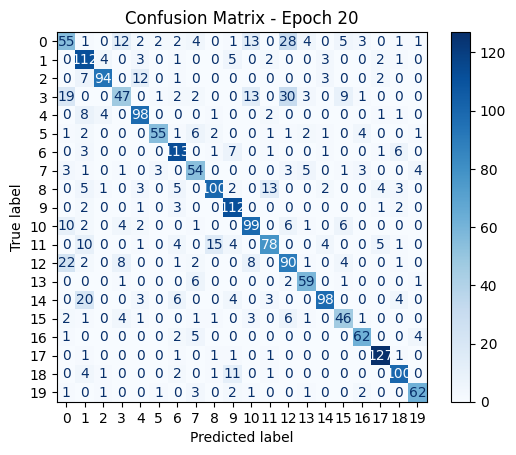

Epoch 20/45 - Train Loss: 0.8561, Train Acc: 0.9012, Val Loss: 1.3351, Val Acc: 0.7405, precision: 0.7480, recall: 0.7459, f1: 0.7419
Epoch [21/45]

Epoch 21/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8564, Accuracy: 88.28%
Batch 20/719, Loss: 0.7395, Accuracy: 89.22%
Batch 30/719, Loss: 0.7984, Accuracy: 89.84%
Batch 40/719, Loss: 0.7457, Accuracy: 90.08%
Batch 50/719, Loss: 0.9226, Accuracy: 90.09%
Batch 60/719, Loss: 0.8197, Accuracy: 90.00%
Batch 70/719, Loss: 0.7915, Accuracy: 90.27%
Batch 80/719, Loss: 0.7974, Accuracy: 90.37%
Batch 90/719, Loss: 0.9043, Accuracy: 90.47%
Batch 100/719, Loss: 0.8310, Accuracy: 90.48%
Batch 110/719, Loss: 0.8108, Accuracy: 90.62%
Batch 120/719, Loss: 0.9152, Accuracy: 90.77%
Batch 130/719, Loss: 0.7413, Accuracy: 90.87%
Batch 140/719, Loss: 0.9307, Accuracy: 90.86%
Batch 150/719, Loss: 0.8581, Accuracy: 90.81%
Batch 160/719, Loss: 0.8038, Accuracy: 90.83%
Batch 170/719, Loss: 0.8694, Accuracy: 90.87%
Batch 180/719, Loss: 0.8009, Accuracy: 9

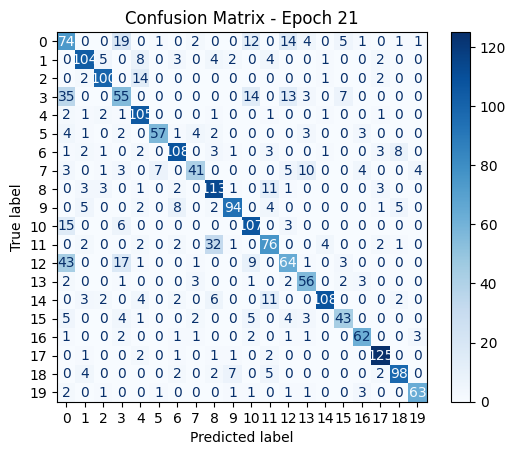

Epoch 21/45 - Train Loss: 0.8391, Train Acc: 0.9078, Val Loss: 1.3041, Val Acc: 0.7370, precision: 0.7523, recall: 0.7382, f1: 0.7409
Epoch [22/45]

Epoch 22/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8775, Accuracy: 89.84%
Batch 20/719, Loss: 0.6945, Accuracy: 91.80%
Batch 30/719, Loss: 0.8279, Accuracy: 91.25%
Batch 40/719, Loss: 0.7554, Accuracy: 91.64%
Batch 50/719, Loss: 0.8710, Accuracy: 91.59%
Batch 60/719, Loss: 0.7198, Accuracy: 91.77%
Batch 70/719, Loss: 0.8037, Accuracy: 91.81%
Batch 80/719, Loss: 0.8398, Accuracy: 91.76%
Batch 90/719, Loss: 0.8124, Accuracy: 91.89%
Batch 100/719, Loss: 0.7396, Accuracy: 91.83%
Batch 110/719, Loss: 0.8360, Accuracy: 91.83%
Batch 120/719, Loss: 1.0146, Accuracy: 91.55%
Batch 130/719, Loss: 0.8015, Accuracy: 91.51%
Batch 140/719, Loss: 0.7859, Accuracy: 91.44%
Batch 150/719, Loss: 0.9853, Accuracy: 91.29%
Batch 160/719, Loss: 0.7290, Accuracy: 91.30%
Batch 170/719, Loss: 0.8878, Accuracy: 91.29%
Batch 180/719, Loss: 0.8133, Accuracy: 9

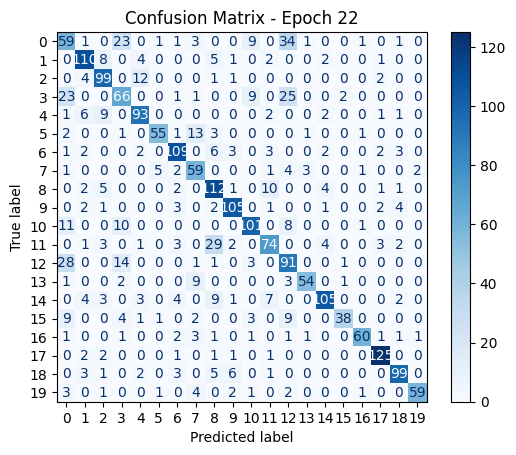

Epoch 22/45 - Train Loss: 0.8313, Train Acc: 0.9106, Val Loss: 1.3121, Val Acc: 0.7459, precision: 0.7742, recall: 0.7451, f1: 0.7546
Epoch [23/45]

Epoch 23/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.9909, Accuracy: 91.09%
Batch 20/719, Loss: 0.7781, Accuracy: 91.09%
Batch 30/719, Loss: 0.8653, Accuracy: 90.78%
Batch 40/719, Loss: 0.7377, Accuracy: 91.13%
Batch 50/719, Loss: 0.7672, Accuracy: 91.06%
Batch 60/719, Loss: 0.9139, Accuracy: 91.12%
Batch 70/719, Loss: 0.9521, Accuracy: 91.18%
Batch 80/719, Loss: 0.7747, Accuracy: 91.25%
Batch 90/719, Loss: 0.7765, Accuracy: 91.48%
Batch 100/719, Loss: 0.9037, Accuracy: 91.44%
Batch 110/719, Loss: 0.7569, Accuracy: 91.48%
Batch 120/719, Loss: 0.8049, Accuracy: 91.46%
Batch 130/719, Loss: 0.7722, Accuracy: 91.47%
Batch 140/719, Loss: 0.7711, Accuracy: 91.52%
Batch 150/719, Loss: 0.9125, Accuracy: 91.41%
Batch 160/719, Loss: 0.9236, Accuracy: 91.35%
Batch 170/719, Loss: 0.7834, Accuracy: 91.36%
Batch 180/719, Loss: 0.7444, Accuracy: 9

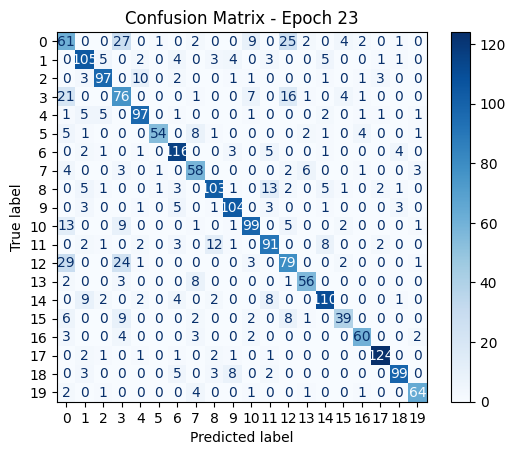

Epoch 23/45 - Train Loss: 0.8239, Train Acc: 0.9146, Val Loss: 1.2726, Val Acc: 0.7543, precision: 0.7714, recall: 0.7553, f1: 0.7612
Best model saved with val accuracy: 0.7543!
Epoch [24/45]

Epoch 24/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8082, Accuracy: 90.78%
Batch 20/719, Loss: 0.8816, Accuracy: 91.95%
Batch 30/719, Loss: 0.7172, Accuracy: 92.34%
Batch 40/719, Loss: 0.7798, Accuracy: 92.19%
Batch 50/719, Loss: 0.7781, Accuracy: 92.22%
Batch 60/719, Loss: 0.8121, Accuracy: 92.16%
Batch 70/719, Loss: 0.8595, Accuracy: 92.23%
Batch 80/719, Loss: 0.8519, Accuracy: 92.17%
Batch 90/719, Loss: 0.8680, Accuracy: 92.24%
Batch 100/719, Loss: 0.8068, Accuracy: 92.25%
Batch 110/719, Loss: 0.7029, Accuracy: 92.34%
Batch 120/719, Loss: 0.8491, Accuracy: 92.28%
Batch 130/719, Loss: 0.8453, Accuracy: 92.15%
Batch 140/719, Loss: 0.7468, Accuracy: 92.22%
Batch 150/719, Loss: 0.8023, Accuracy: 92.22%
Batch 160/719, Loss: 0.7254, Accuracy: 92.30%
Batch 170/719, Loss: 0.8563, Accuracy: 92.

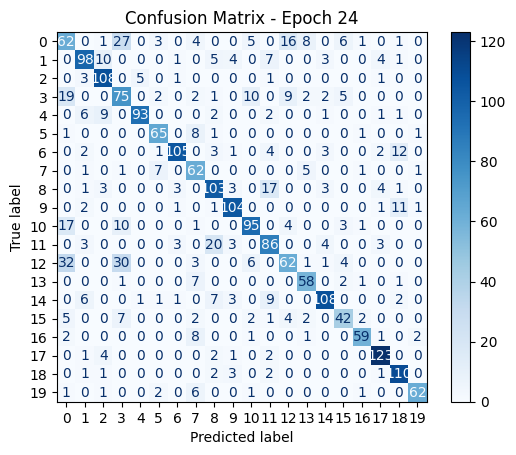

Epoch 24/45 - Train Loss: 0.8137, Train Acc: 0.9190, Val Loss: 1.3300, Val Acc: 0.7490, precision: 0.7595, recall: 0.7566, f1: 0.7546
Epoch [25/45]

Epoch 25/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8064, Accuracy: 91.56%
Batch 20/719, Loss: 0.8006, Accuracy: 92.42%
Batch 30/719, Loss: 0.8146, Accuracy: 92.55%
Batch 40/719, Loss: 0.7608, Accuracy: 92.58%
Batch 50/719, Loss: 0.7522, Accuracy: 92.06%
Batch 60/719, Loss: 0.8729, Accuracy: 91.82%
Batch 70/719, Loss: 0.8675, Accuracy: 91.63%
Batch 80/719, Loss: 0.9344, Accuracy: 91.64%
Batch 90/719, Loss: 0.9021, Accuracy: 91.70%
Batch 100/719, Loss: 0.9142, Accuracy: 91.70%
Batch 110/719, Loss: 0.7064, Accuracy: 91.73%
Batch 120/719, Loss: 1.0743, Accuracy: 91.63%
Batch 130/719, Loss: 0.7612, Accuracy: 91.75%
Batch 140/719, Loss: 0.8868, Accuracy: 91.81%
Batch 150/719, Loss: 0.8226, Accuracy: 91.98%
Batch 160/719, Loss: 0.8218, Accuracy: 91.98%
Batch 170/719, Loss: 0.9569, Accuracy: 91.98%
Batch 180/719, Loss: 0.7263, Accuracy: 9

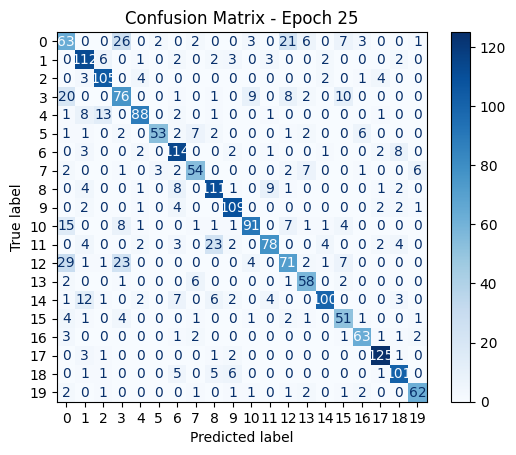

Epoch 25/45 - Train Loss: 0.8082, Train Acc: 0.9196, Val Loss: 1.3090, Val Acc: 0.7512, precision: 0.7613, recall: 0.7566, f1: 0.7550
Epoch [26/45]

Epoch 26/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8752, Accuracy: 92.66%
Batch 20/719, Loss: 0.7902, Accuracy: 92.89%
Batch 30/719, Loss: 0.8343, Accuracy: 92.71%
Batch 40/719, Loss: 0.8195, Accuracy: 92.42%
Batch 50/719, Loss: 0.8334, Accuracy: 92.62%
Batch 60/719, Loss: 0.9246, Accuracy: 92.47%
Batch 70/719, Loss: 0.7862, Accuracy: 92.70%
Batch 80/719, Loss: 0.8200, Accuracy: 92.68%
Batch 90/719, Loss: 0.8914, Accuracy: 92.53%
Batch 100/719, Loss: 0.8031, Accuracy: 92.41%
Batch 110/719, Loss: 0.8911, Accuracy: 92.30%
Batch 120/719, Loss: 0.8107, Accuracy: 92.41%
Batch 130/719, Loss: 0.8000, Accuracy: 92.37%
Batch 140/719, Loss: 0.8004, Accuracy: 92.39%
Batch 150/719, Loss: 0.7795, Accuracy: 92.39%
Batch 160/719, Loss: 0.7529, Accuracy: 92.29%
Batch 170/719, Loss: 1.0471, Accuracy: 92.24%
Batch 180/719, Loss: 0.8012, Accuracy: 9

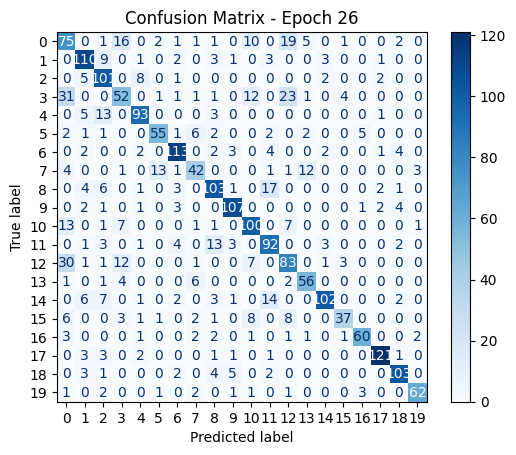

Epoch 26/45 - Train Loss: 0.7993, Train Acc: 0.9234, Val Loss: 1.2876, Val Acc: 0.7432, precision: 0.7553, recall: 0.7405, f1: 0.7442
Epoch [27/45]

Epoch 27/45 - Learning Rate: 0.000400
Batch 10/719, Loss: 0.8456, Accuracy: 91.25%
Batch 20/719, Loss: 0.7436, Accuracy: 92.03%
Batch 30/719, Loss: 0.7528, Accuracy: 92.24%
Batch 40/719, Loss: 0.8335, Accuracy: 92.23%
Batch 50/719, Loss: 0.8613, Accuracy: 92.41%
Batch 60/719, Loss: 0.6726, Accuracy: 92.40%
Batch 70/719, Loss: 0.8334, Accuracy: 92.43%
Batch 80/719, Loss: 0.7923, Accuracy: 92.48%
Batch 90/719, Loss: 0.7197, Accuracy: 92.57%
Batch 100/719, Loss: 0.7060, Accuracy: 92.72%
Batch 110/719, Loss: 0.8290, Accuracy: 92.78%
Batch 120/719, Loss: 0.8517, Accuracy: 92.58%
Batch 130/719, Loss: 0.7188, Accuracy: 92.54%
Batch 140/719, Loss: 0.8457, Accuracy: 92.52%
Batch 150/719, Loss: 0.7700, Accuracy: 92.70%
Batch 160/719, Loss: 0.7669, Accuracy: 92.69%
Batch 170/719, Loss: 0.7220, Accuracy: 92.76%
Batch 180/719, Loss: 0.8016, Accuracy: 9

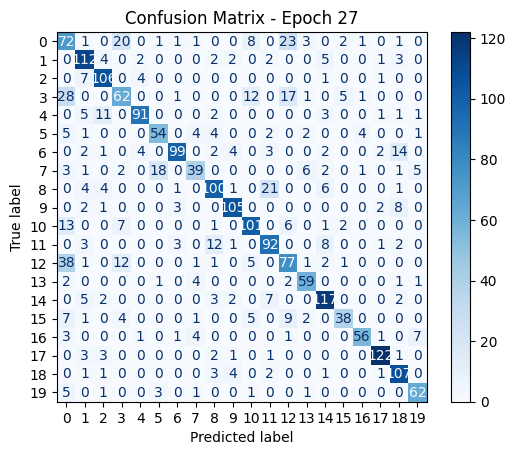

Epoch 27/45 - Train Loss: 0.7908, Train Acc: 0.9254, Val Loss: 1.2811, Val Acc: 0.7450, precision: 0.7579, recall: 0.7414, f1: 0.7456


In [9]:
model = resnetModel3
num_epochs = 45
criterion = LabelSmoothingCrossEntropy(smoothing=0.10)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.009)
scheduler = OneCycleLR(optimizer, max_lr=0.01,
                       steps_per_epoch=len(train_loader), epochs=num_epochs,
                       pct_start=0.2, div_factor=25.0, final_div_factor=1e4)
scaler = GradScaler()
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

historyResnet2, modelResnet3 = train_classification_model(model, train_loader4, val_loader4,0, optimizer, criterion,
                              scheduler=scheduler, num_epochs=num_epochs, device='cuda',
                              use_mixed_precision=False, patience=10, model_name="resnetModel3")

Total parameters: 4,826,196
Epoch [1/75]

Epoch 1/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 3.5343, Accuracy: 5.47%
Batch 20/719, Loss: 3.3144, Accuracy: 7.50%
Batch 30/719, Loss: 3.3006, Accuracy: 8.07%
Batch 40/719, Loss: 3.0782, Accuracy: 8.44%
Batch 50/719, Loss: 3.1671, Accuracy: 8.91%
Batch 60/719, Loss: 3.0045, Accuracy: 9.66%
Batch 70/719, Loss: 3.0792, Accuracy: 9.82%
Batch 80/719, Loss: 3.0169, Accuracy: 10.12%
Batch 90/719, Loss: 3.2447, Accuracy: 10.42%
Batch 100/719, Loss: 2.9353, Accuracy: 10.70%
Batch 110/719, Loss: 2.8869, Accuracy: 10.72%
Batch 120/719, Loss: 2.9662, Accuracy: 11.08%
Batch 130/719, Loss: 2.8967, Accuracy: 11.24%
Batch 140/719, Loss: 2.8911, Accuracy: 11.27%
Batch 150/719, Loss: 2.9326, Accuracy: 11.44%
Batch 160/719, Loss: 2.7237, Accuracy: 11.55%
Batch 170/719, Loss: 2.7367, Accuracy: 11.84%
Batch 180/719, Loss: 2.7592, Accuracy: 12.07%
Batch 190/719, Loss: 2.9373, Accuracy: 12.25%
Batch 200/719, Loss: 2.6653, Accuracy: 12.47%
Batch 210/719, Lo

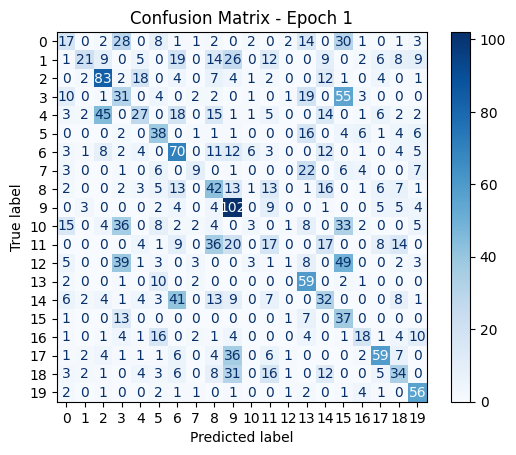

Epoch 1/75 - Train Loss: 2.7126, Train Acc: 0.1833, Val Loss: 2.1489, Val Acc: 0.3370, precision: 0.3355, recall: 0.3532, f1: 0.3111
Best model saved with val accuracy: 0.3370!
Epoch [2/75]

Epoch 2/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.3742, Accuracy: 27.50%
Batch 20/719, Loss: 2.4040, Accuracy: 25.62%
Batch 30/719, Loss: 2.6366, Accuracy: 23.65%
Batch 40/719, Loss: 2.3459, Accuracy: 23.44%
Batch 50/719, Loss: 2.5102, Accuracy: 23.28%
Batch 60/719, Loss: 2.3864, Accuracy: 23.80%
Batch 70/719, Loss: 2.3914, Accuracy: 23.88%
Batch 80/719, Loss: 2.6977, Accuracy: 23.91%
Batch 90/719, Loss: 2.4749, Accuracy: 23.72%
Batch 100/719, Loss: 2.4447, Accuracy: 23.59%
Batch 110/719, Loss: 2.3774, Accuracy: 23.88%
Batch 120/719, Loss: 2.4833, Accuracy: 23.96%
Batch 130/719, Loss: 2.5180, Accuracy: 23.86%
Batch 140/719, Loss: 2.4639, Accuracy: 24.04%
Batch 150/719, Loss: 2.4153, Accuracy: 24.16%
Batch 160/719, Loss: 2.4992, Accuracy: 24.16%
Batch 170/719, Loss: 2.2754, Accuracy: 24.36%

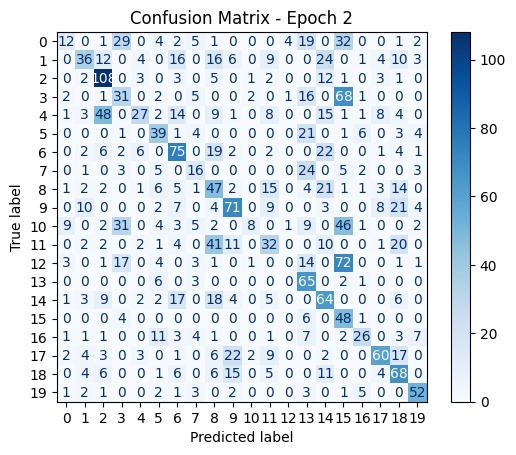

Epoch 2/75 - Train Loss: 2.3860, Train Acc: 0.2681, Val Loss: 2.0240, Val Acc: 0.3946, precision: 0.4137, recall: 0.4144, f1: 0.3732
Best model saved with val accuracy: 0.3946!
Epoch [3/75]

Epoch 3/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.2515, Accuracy: 33.75%
Batch 20/719, Loss: 2.3942, Accuracy: 31.17%
Batch 30/719, Loss: 2.4615, Accuracy: 28.96%
Batch 40/719, Loss: 2.3595, Accuracy: 29.14%
Batch 50/719, Loss: 2.2875, Accuracy: 29.03%
Batch 60/719, Loss: 2.1485, Accuracy: 29.38%
Batch 70/719, Loss: 2.1517, Accuracy: 29.69%
Batch 80/719, Loss: 2.5607, Accuracy: 29.94%
Batch 90/719, Loss: 2.2233, Accuracy: 30.17%
Batch 100/719, Loss: 2.1787, Accuracy: 30.25%
Batch 110/719, Loss: 2.3188, Accuracy: 30.26%
Batch 120/719, Loss: 2.2635, Accuracy: 30.51%
Batch 130/719, Loss: 2.3341, Accuracy: 30.55%
Batch 140/719, Loss: 2.2321, Accuracy: 30.56%
Batch 150/719, Loss: 2.1783, Accuracy: 30.68%
Batch 160/719, Loss: 2.1260, Accuracy: 30.54%
Batch 170/719, Loss: 2.3118, Accuracy: 30.63%

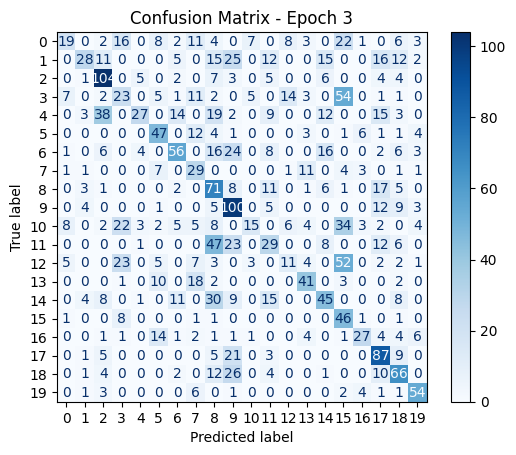

Epoch 3/75 - Train Loss: 2.2479, Train Acc: 0.3190, Val Loss: 1.9496, Val Acc: 0.4124, precision: 0.4459, recall: 0.4328, f1: 0.3987
Best model saved with val accuracy: 0.4124!
Epoch [4/75]

Epoch 4/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.2034, Accuracy: 36.25%
Batch 20/719, Loss: 2.2085, Accuracy: 34.69%
Batch 30/719, Loss: 2.3287, Accuracy: 34.01%
Batch 40/719, Loss: 2.0415, Accuracy: 34.26%
Batch 50/719, Loss: 2.1143, Accuracy: 33.91%
Batch 60/719, Loss: 2.0864, Accuracy: 34.48%
Batch 70/719, Loss: 2.1415, Accuracy: 34.51%
Batch 80/719, Loss: 2.3644, Accuracy: 34.20%
Batch 90/719, Loss: 2.1875, Accuracy: 34.32%
Batch 100/719, Loss: 2.3103, Accuracy: 33.97%
Batch 110/719, Loss: 2.1337, Accuracy: 34.18%
Batch 120/719, Loss: 2.1101, Accuracy: 34.11%
Batch 130/719, Loss: 2.1595, Accuracy: 33.98%
Batch 140/719, Loss: 2.1378, Accuracy: 34.10%
Batch 150/719, Loss: 2.0880, Accuracy: 34.05%
Batch 160/719, Loss: 2.0384, Accuracy: 34.14%
Batch 170/719, Loss: 2.0221, Accuracy: 34.25%

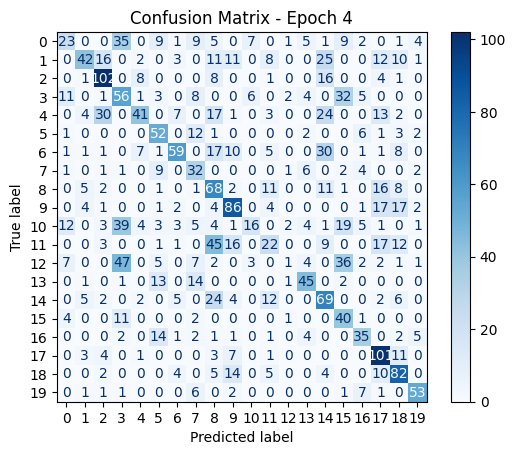

Epoch 4/75 - Train Loss: 2.1580, Train Acc: 0.3557, Val Loss: 1.8556, Val Acc: 0.4570, precision: 0.4651, recall: 0.4740, f1: 0.4408
Best model saved with val accuracy: 0.4570!
Epoch [5/75]

Epoch 5/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.3346, Accuracy: 36.56%
Batch 20/719, Loss: 2.1808, Accuracy: 35.31%
Batch 30/719, Loss: 2.2597, Accuracy: 35.31%
Batch 40/719, Loss: 2.0000, Accuracy: 35.82%
Batch 50/719, Loss: 2.0258, Accuracy: 36.09%
Batch 60/719, Loss: 2.1107, Accuracy: 36.64%
Batch 70/719, Loss: 2.1314, Accuracy: 36.96%
Batch 80/719, Loss: 2.3053, Accuracy: 37.34%
Batch 90/719, Loss: 1.9663, Accuracy: 37.22%
Batch 100/719, Loss: 2.1116, Accuracy: 37.31%
Batch 110/719, Loss: 2.1322, Accuracy: 37.43%
Batch 120/719, Loss: 2.0734, Accuracy: 37.46%
Batch 130/719, Loss: 2.1452, Accuracy: 37.55%
Batch 140/719, Loss: 2.0862, Accuracy: 37.63%
Batch 150/719, Loss: 2.0673, Accuracy: 37.59%
Batch 160/719, Loss: 1.9026, Accuracy: 37.67%
Batch 170/719, Loss: 2.0464, Accuracy: 37.49%

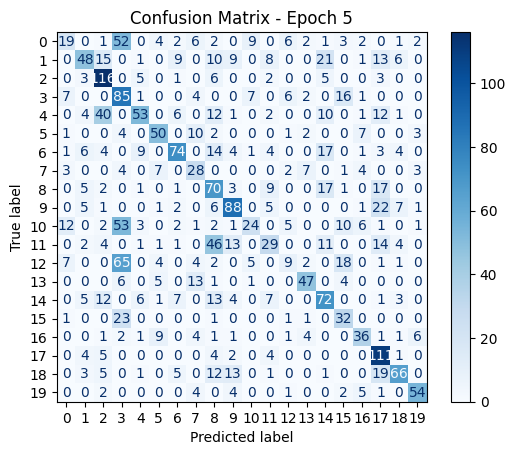

Epoch 5/75 - Train Loss: 2.0854, Train Acc: 0.3830, Val Loss: 1.7678, Val Acc: 0.4953, precision: 0.5153, recall: 0.5009, f1: 0.4844
Best model saved with val accuracy: 0.4953!
Epoch [6/75]

Epoch 6/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.0445, Accuracy: 41.88%
Batch 20/719, Loss: 2.0442, Accuracy: 40.23%
Batch 30/719, Loss: 2.2890, Accuracy: 40.31%
Batch 40/719, Loss: 1.9140, Accuracy: 40.43%
Batch 50/719, Loss: 1.9316, Accuracy: 40.84%
Batch 60/719, Loss: 1.9276, Accuracy: 41.56%
Batch 70/719, Loss: 2.1194, Accuracy: 41.29%
Batch 80/719, Loss: 2.2642, Accuracy: 41.04%
Batch 90/719, Loss: 2.0080, Accuracy: 41.13%
Batch 100/719, Loss: 2.0490, Accuracy: 40.94%
Batch 110/719, Loss: 1.9543, Accuracy: 40.91%
Batch 120/719, Loss: 2.0877, Accuracy: 40.73%
Batch 130/719, Loss: 2.1843, Accuracy: 40.70%
Batch 140/719, Loss: 2.1064, Accuracy: 40.78%
Batch 150/719, Loss: 1.9906, Accuracy: 40.69%
Batch 160/719, Loss: 1.8431, Accuracy: 40.74%
Batch 170/719, Loss: 1.9181, Accuracy: 40.72%

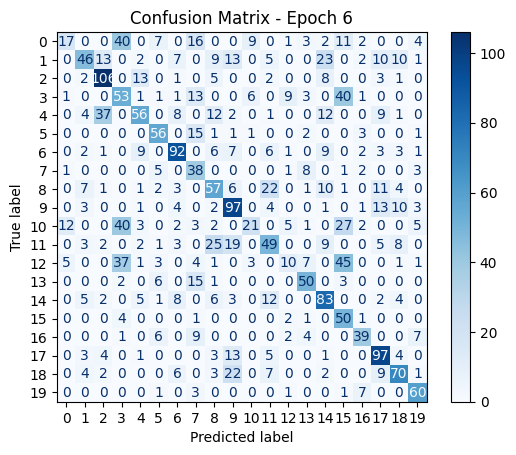

Epoch 6/75 - Train Loss: 2.0269, Train Acc: 0.4109, Val Loss: 1.7229, Val Acc: 0.5114, precision: 0.5192, recall: 0.5322, f1: 0.4987
Best model saved with val accuracy: 0.5114!
Epoch [7/75]

Epoch 7/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.9754, Accuracy: 42.34%
Batch 20/719, Loss: 2.1654, Accuracy: 42.50%
Batch 30/719, Loss: 2.1349, Accuracy: 42.40%
Batch 40/719, Loss: 2.1184, Accuracy: 41.72%
Batch 50/719, Loss: 1.9313, Accuracy: 41.91%
Batch 60/719, Loss: 1.8678, Accuracy: 42.60%
Batch 70/719, Loss: 1.8686, Accuracy: 42.48%
Batch 80/719, Loss: 2.2469, Accuracy: 42.56%
Batch 90/719, Loss: 1.8960, Accuracy: 42.78%
Batch 100/719, Loss: 1.9221, Accuracy: 42.95%
Batch 110/719, Loss: 2.1446, Accuracy: 43.12%
Batch 120/719, Loss: 2.1548, Accuracy: 42.79%
Batch 130/719, Loss: 2.0629, Accuracy: 42.51%
Batch 140/719, Loss: 1.8097, Accuracy: 42.65%
Batch 150/719, Loss: 2.0025, Accuracy: 42.34%
Batch 160/719, Loss: 1.8089, Accuracy: 42.45%
Batch 170/719, Loss: 1.8073, Accuracy: 42.47%

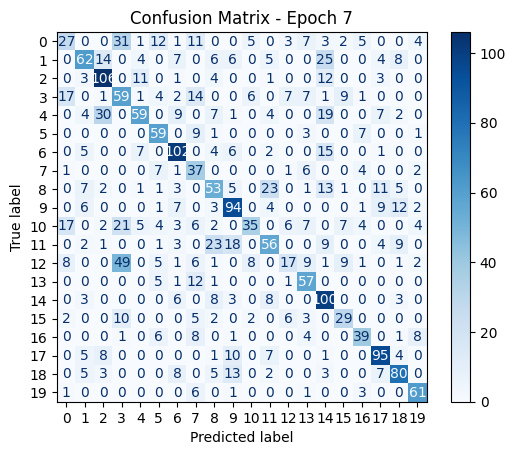

Epoch 7/75 - Train Loss: 1.9749, Train Acc: 0.4355, Val Loss: 1.7004, Val Acc: 0.5470, precision: 0.5462, recall: 0.5561, f1: 0.5356
Best model saved with val accuracy: 0.5470!
Epoch [8/75]

Epoch 8/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.9843, Accuracy: 45.00%
Batch 20/719, Loss: 2.0101, Accuracy: 42.50%
Batch 30/719, Loss: 2.0193, Accuracy: 42.29%
Batch 40/719, Loss: 1.7970, Accuracy: 42.58%
Batch 50/719, Loss: 1.8340, Accuracy: 42.75%
Batch 60/719, Loss: 1.8130, Accuracy: 42.89%
Batch 70/719, Loss: 1.9454, Accuracy: 43.26%
Batch 80/719, Loss: 2.0751, Accuracy: 43.44%
Batch 90/719, Loss: 1.8223, Accuracy: 43.35%
Batch 100/719, Loss: 2.0204, Accuracy: 43.36%
Batch 110/719, Loss: 1.9442, Accuracy: 43.79%
Batch 120/719, Loss: 1.8651, Accuracy: 43.79%
Batch 130/719, Loss: 2.0018, Accuracy: 43.73%
Batch 140/719, Loss: 1.9283, Accuracy: 43.79%
Batch 150/719, Loss: 1.9210, Accuracy: 43.84%
Batch 160/719, Loss: 1.7934, Accuracy: 44.03%
Batch 170/719, Loss: 1.7988, Accuracy: 44.03%

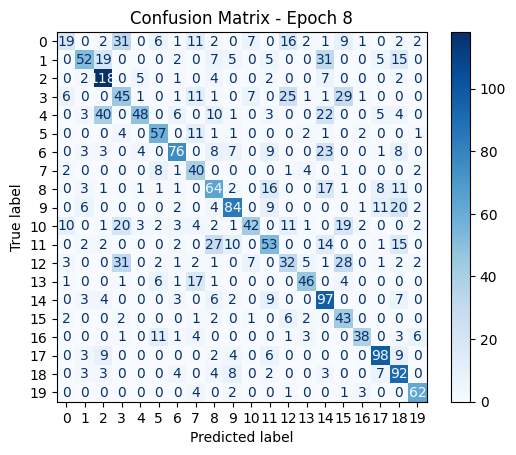

Epoch 8/75 - Train Loss: 1.9326, Train Acc: 0.4518, Val Loss: 1.6703, Val Acc: 0.5377, precision: 0.5648, recall: 0.5543, f1: 0.5349
Epoch [9/75]

Epoch 9/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.0766, Accuracy: 48.12%
Batch 20/719, Loss: 1.9146, Accuracy: 46.88%
Batch 30/719, Loss: 2.1862, Accuracy: 45.57%
Batch 40/719, Loss: 1.7303, Accuracy: 45.51%
Batch 50/719, Loss: 2.0010, Accuracy: 45.69%
Batch 60/719, Loss: 1.7987, Accuracy: 46.30%
Batch 70/719, Loss: 1.8852, Accuracy: 46.05%
Batch 80/719, Loss: 2.0971, Accuracy: 45.94%
Batch 90/719, Loss: 1.8417, Accuracy: 45.66%
Batch 100/719, Loss: 1.9940, Accuracy: 45.27%
Batch 110/719, Loss: 1.8075, Accuracy: 45.64%
Batch 120/719, Loss: 1.9598, Accuracy: 45.77%
Batch 130/719, Loss: 1.9146, Accuracy: 45.69%
Batch 140/719, Loss: 1.7794, Accuracy: 45.70%
Batch 150/719, Loss: 1.9287, Accuracy: 45.65%
Batch 160/719, Loss: 1.7218, Accuracy: 45.62%
Batch 170/719, Loss: 1.7917, Accuracy: 45.59%
Batch 180/719, Loss: 1.9820, Accuracy: 45.7

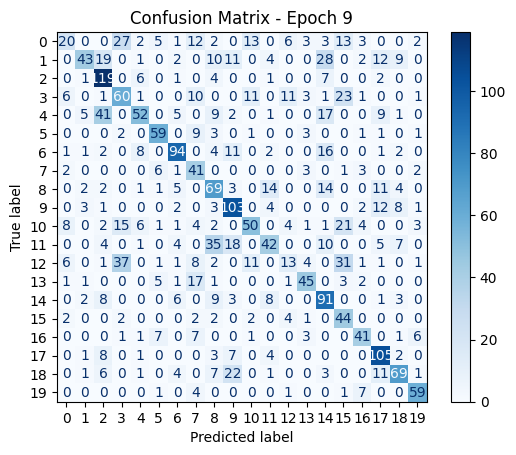

Epoch 9/75 - Train Loss: 1.8999, Train Acc: 0.4633, Val Loss: 1.6584, Val Acc: 0.5435, precision: 0.5532, recall: 0.5588, f1: 0.5314
Epoch [10/75]

Epoch 10/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 2.0648, Accuracy: 45.62%
Batch 20/719, Loss: 2.0622, Accuracy: 44.53%
Batch 30/719, Loss: 2.1296, Accuracy: 42.92%
Batch 40/719, Loss: 1.8402, Accuracy: 43.67%
Batch 50/719, Loss: 1.8643, Accuracy: 44.31%
Batch 60/719, Loss: 1.7759, Accuracy: 44.95%
Batch 70/719, Loss: 1.8726, Accuracy: 45.16%
Batch 80/719, Loss: 2.0135, Accuracy: 45.21%
Batch 90/719, Loss: 1.7579, Accuracy: 46.04%
Batch 100/719, Loss: 1.9755, Accuracy: 46.16%
Batch 110/719, Loss: 1.7955, Accuracy: 46.49%
Batch 120/719, Loss: 1.8404, Accuracy: 46.29%
Batch 130/719, Loss: 2.0829, Accuracy: 46.08%
Batch 140/719, Loss: 1.7791, Accuracy: 46.08%
Batch 150/719, Loss: 1.8074, Accuracy: 46.36%
Batch 160/719, Loss: 1.6946, Accuracy: 46.57%
Batch 170/719, Loss: 1.7128, Accuracy: 46.59%
Batch 180/719, Loss: 1.8588, Accuracy: 46

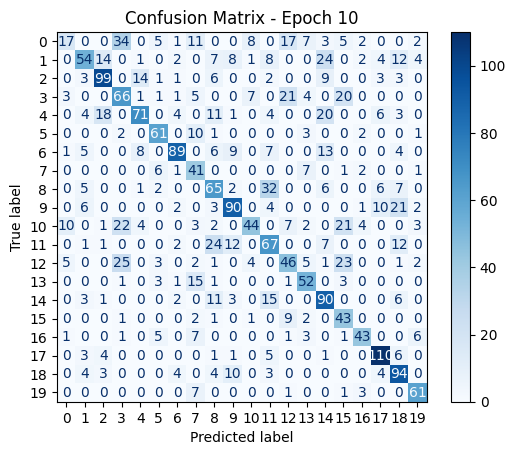

Epoch 10/75 - Train Loss: 1.8641, Train Acc: 0.4847, Val Loss: 1.6051, Val Acc: 0.5809, precision: 0.5906, recall: 0.5960, f1: 0.5768
Best model saved with val accuracy: 0.5809!
Epoch [11/75]

Epoch 11/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7896, Accuracy: 48.28%
Batch 20/719, Loss: 1.8834, Accuracy: 47.42%
Batch 30/719, Loss: 2.0626, Accuracy: 47.03%
Batch 40/719, Loss: 2.0851, Accuracy: 46.99%
Batch 50/719, Loss: 1.7138, Accuracy: 47.78%
Batch 60/719, Loss: 1.6834, Accuracy: 48.49%
Batch 70/719, Loss: 1.7503, Accuracy: 48.24%
Batch 80/719, Loss: 1.8293, Accuracy: 48.46%
Batch 90/719, Loss: 1.6826, Accuracy: 48.72%
Batch 100/719, Loss: 1.9861, Accuracy: 48.61%
Batch 110/719, Loss: 1.8582, Accuracy: 48.74%
Batch 120/719, Loss: 1.8534, Accuracy: 48.41%
Batch 130/719, Loss: 1.8626, Accuracy: 48.51%
Batch 140/719, Loss: 1.7162, Accuracy: 48.58%
Batch 150/719, Loss: 1.8373, Accuracy: 48.62%
Batch 160/719, Loss: 1.7305, Accuracy: 48.60%
Batch 170/719, Loss: 1.7848, Accuracy: 48.

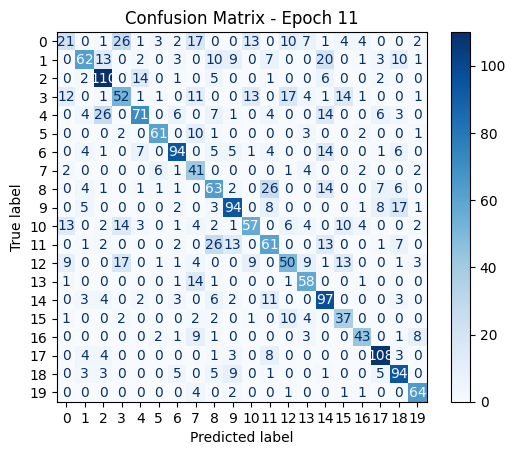

Epoch 11/75 - Train Loss: 1.8284, Train Acc: 0.4987, Val Loss: 1.5629, Val Acc: 0.5965, precision: 0.5973, recall: 0.6089, f1: 0.5931
Best model saved with val accuracy: 0.5965!
Epoch [12/75]

Epoch 12/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8932, Accuracy: 51.41%
Batch 20/719, Loss: 1.7540, Accuracy: 50.62%
Batch 30/719, Loss: 1.9681, Accuracy: 50.26%
Batch 40/719, Loss: 1.7873, Accuracy: 49.65%
Batch 50/719, Loss: 1.7657, Accuracy: 50.19%
Batch 60/719, Loss: 1.6846, Accuracy: 51.02%
Batch 70/719, Loss: 1.7533, Accuracy: 50.87%
Batch 80/719, Loss: 2.0759, Accuracy: 51.00%
Batch 90/719, Loss: 1.7302, Accuracy: 51.30%
Batch 100/719, Loss: 1.7703, Accuracy: 51.22%
Batch 110/719, Loss: 1.6428, Accuracy: 51.75%
Batch 120/719, Loss: 1.8870, Accuracy: 51.50%
Batch 130/719, Loss: 1.8628, Accuracy: 51.27%
Batch 140/719, Loss: 1.7751, Accuracy: 51.15%
Batch 150/719, Loss: 1.8766, Accuracy: 51.06%
Batch 160/719, Loss: 1.6169, Accuracy: 51.25%
Batch 170/719, Loss: 1.5420, Accuracy: 50.

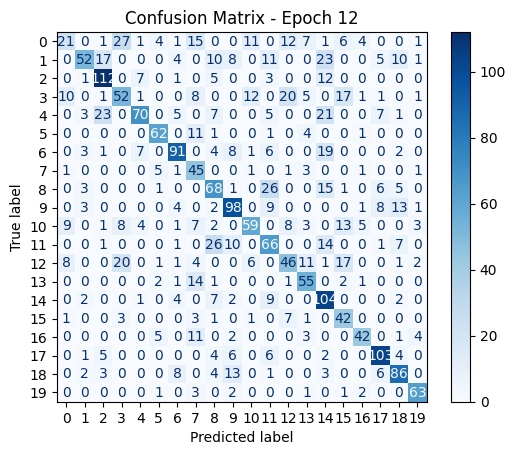

Epoch 12/75 - Train Loss: 1.7962, Train Acc: 0.5137, Val Loss: 1.5627, Val Acc: 0.5961, precision: 0.6066, recall: 0.6116, f1: 0.5929
Epoch [13/75]

Epoch 13/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8735, Accuracy: 52.50%
Batch 20/719, Loss: 1.8023, Accuracy: 51.09%
Batch 30/719, Loss: 1.8897, Accuracy: 49.22%
Batch 40/719, Loss: 1.8069, Accuracy: 49.73%
Batch 50/719, Loss: 1.8846, Accuracy: 50.47%
Batch 60/719, Loss: 1.7005, Accuracy: 51.35%
Batch 70/719, Loss: 1.7384, Accuracy: 51.50%
Batch 80/719, Loss: 1.9024, Accuracy: 51.56%
Batch 90/719, Loss: 1.6359, Accuracy: 51.77%
Batch 100/719, Loss: 1.7614, Accuracy: 51.97%
Batch 110/719, Loss: 1.7174, Accuracy: 52.02%
Batch 120/719, Loss: 1.8043, Accuracy: 51.89%
Batch 130/719, Loss: 1.9544, Accuracy: 51.74%
Batch 140/719, Loss: 1.7450, Accuracy: 51.84%
Batch 150/719, Loss: 1.9680, Accuracy: 51.77%
Batch 160/719, Loss: 1.6813, Accuracy: 51.95%
Batch 170/719, Loss: 1.6445, Accuracy: 51.89%
Batch 180/719, Loss: 1.6089, Accuracy: 5

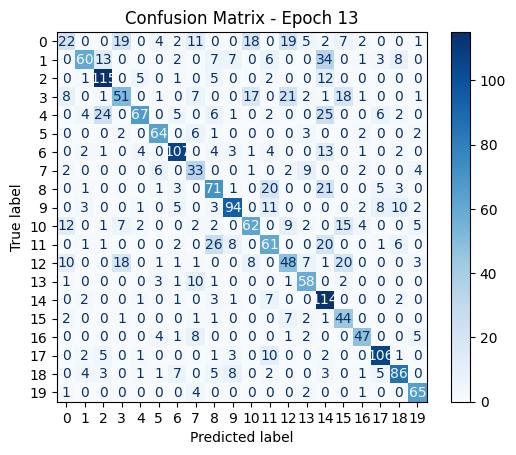

Epoch 13/75 - Train Loss: 1.7728, Train Acc: 0.5224, Val Loss: 1.5314, Val Acc: 0.6130, precision: 0.6179, recall: 0.6247, f1: 0.6074
Best model saved with val accuracy: 0.6130!
Epoch [14/75]

Epoch 14/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8174, Accuracy: 54.53%
Batch 20/719, Loss: 1.9435, Accuracy: 53.20%
Batch 30/719, Loss: 1.9863, Accuracy: 52.76%
Batch 40/719, Loss: 1.6240, Accuracy: 52.42%
Batch 50/719, Loss: 1.8323, Accuracy: 53.00%
Batch 60/719, Loss: 1.7318, Accuracy: 53.10%
Batch 70/719, Loss: 1.8611, Accuracy: 52.77%
Batch 80/719, Loss: 1.9137, Accuracy: 52.66%
Batch 90/719, Loss: 1.6151, Accuracy: 53.12%
Batch 100/719, Loss: 1.8207, Accuracy: 53.20%
Batch 110/719, Loss: 1.4905, Accuracy: 53.44%
Batch 120/719, Loss: 1.6713, Accuracy: 53.31%
Batch 130/719, Loss: 1.7361, Accuracy: 53.19%
Batch 140/719, Loss: 1.6614, Accuracy: 53.06%
Batch 150/719, Loss: 1.7112, Accuracy: 53.06%
Batch 160/719, Loss: 1.4420, Accuracy: 53.29%
Batch 170/719, Loss: 1.5297, Accuracy: 53.

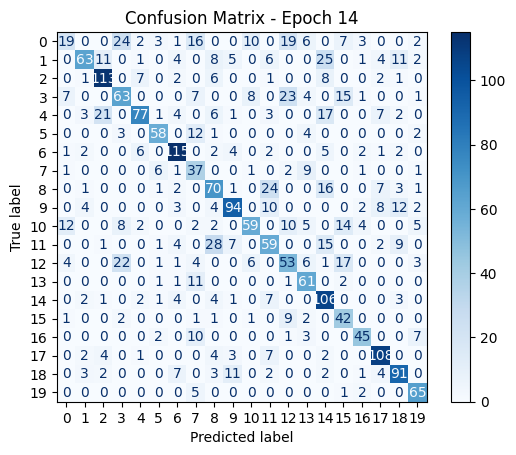

Epoch 14/75 - Train Loss: 1.7411, Train Acc: 0.5349, Val Loss: 1.5011, Val Acc: 0.6233, precision: 0.6232, recall: 0.6326, f1: 0.6143
Best model saved with val accuracy: 0.6233!
Epoch [15/75]

Epoch 15/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7579, Accuracy: 53.12%
Batch 20/719, Loss: 1.9202, Accuracy: 52.19%
Batch 30/719, Loss: 1.8742, Accuracy: 51.67%
Batch 40/719, Loss: 1.6995, Accuracy: 51.88%
Batch 50/719, Loss: 1.7097, Accuracy: 53.00%
Batch 60/719, Loss: 1.5919, Accuracy: 53.88%
Batch 70/719, Loss: 1.5817, Accuracy: 54.08%
Batch 80/719, Loss: 1.8400, Accuracy: 53.85%
Batch 90/719, Loss: 1.5923, Accuracy: 53.89%
Batch 100/719, Loss: 1.8166, Accuracy: 53.95%
Batch 110/719, Loss: 1.6062, Accuracy: 54.30%
Batch 120/719, Loss: 1.7351, Accuracy: 54.06%
Batch 130/719, Loss: 1.9141, Accuracy: 54.18%
Batch 140/719, Loss: 1.5848, Accuracy: 54.07%
Batch 150/719, Loss: 1.7357, Accuracy: 53.97%
Batch 160/719, Loss: 1.6194, Accuracy: 54.14%
Batch 170/719, Loss: 1.5234, Accuracy: 53.

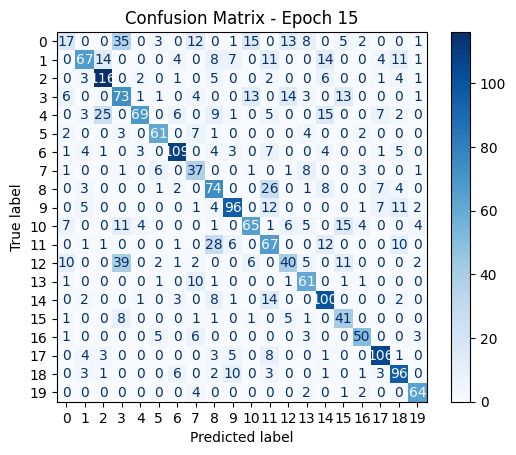

Epoch 15/75 - Train Loss: 1.7176, Train Acc: 0.5456, Val Loss: 1.4663, Val Acc: 0.6282, precision: 0.6300, recall: 0.6385, f1: 0.6229
Best model saved with val accuracy: 0.6282!
Epoch [16/75]

Epoch 16/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7643, Accuracy: 52.50%
Batch 20/719, Loss: 1.8286, Accuracy: 53.75%
Batch 30/719, Loss: 1.8265, Accuracy: 53.02%
Batch 40/719, Loss: 1.6432, Accuracy: 53.40%
Batch 50/719, Loss: 1.8648, Accuracy: 53.44%
Batch 60/719, Loss: 1.5910, Accuracy: 54.06%
Batch 70/719, Loss: 1.6762, Accuracy: 54.04%
Batch 80/719, Loss: 1.9607, Accuracy: 54.18%
Batch 90/719, Loss: 1.6323, Accuracy: 54.46%
Batch 100/719, Loss: 1.5824, Accuracy: 54.67%
Batch 110/719, Loss: 1.6361, Accuracy: 55.11%
Batch 120/719, Loss: 1.4921, Accuracy: 55.10%
Batch 130/719, Loss: 1.7094, Accuracy: 55.22%
Batch 140/719, Loss: 1.6574, Accuracy: 55.30%
Batch 150/719, Loss: 1.6698, Accuracy: 55.20%
Batch 160/719, Loss: 1.5203, Accuracy: 55.49%
Batch 170/719, Loss: 1.5411, Accuracy: 55.

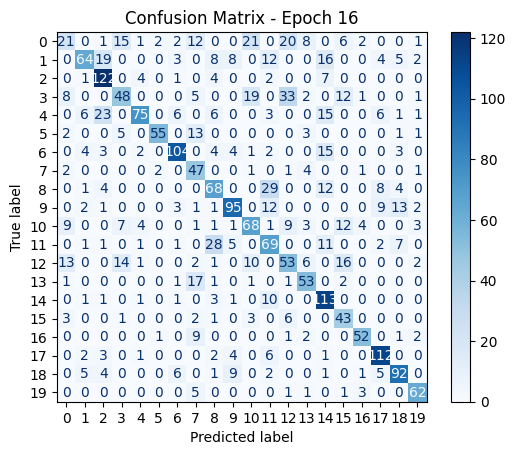

Epoch 16/75 - Train Loss: 1.6927, Train Acc: 0.5600, Val Loss: 1.4537, Val Acc: 0.6313, precision: 0.6394, recall: 0.6438, f1: 0.6284
Best model saved with val accuracy: 0.6313!
Epoch [17/75]

Epoch 17/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6928, Accuracy: 54.06%
Batch 20/719, Loss: 1.7889, Accuracy: 54.77%
Batch 30/719, Loss: 1.8923, Accuracy: 54.79%
Batch 40/719, Loss: 1.5801, Accuracy: 55.00%
Batch 50/719, Loss: 1.7539, Accuracy: 55.12%
Batch 60/719, Loss: 1.7841, Accuracy: 55.29%
Batch 70/719, Loss: 1.6479, Accuracy: 55.45%
Batch 80/719, Loss: 1.6862, Accuracy: 55.43%
Batch 90/719, Loss: 1.4732, Accuracy: 55.75%
Batch 100/719, Loss: 1.6344, Accuracy: 55.97%
Batch 110/719, Loss: 1.5717, Accuracy: 56.32%
Batch 120/719, Loss: 1.5928, Accuracy: 56.37%
Batch 130/719, Loss: 1.8005, Accuracy: 56.17%
Batch 140/719, Loss: 1.6049, Accuracy: 56.27%
Batch 150/719, Loss: 1.5727, Accuracy: 56.23%
Batch 160/719, Loss: 1.5354, Accuracy: 56.60%
Batch 170/719, Loss: 1.5360, Accuracy: 56.

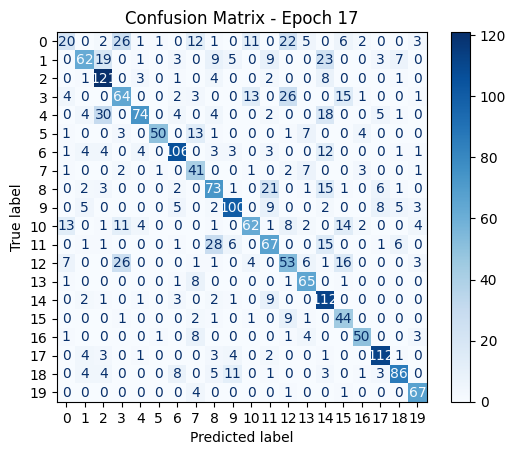

Epoch 17/75 - Train Loss: 1.6651, Train Acc: 0.5701, Val Loss: 1.4467, Val Acc: 0.6371, precision: 0.6485, recall: 0.6490, f1: 0.6339
Best model saved with val accuracy: 0.6371!
Epoch [18/75]

Epoch 18/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8039, Accuracy: 57.03%
Batch 20/719, Loss: 1.6746, Accuracy: 56.17%
Batch 30/719, Loss: 1.8968, Accuracy: 56.77%
Batch 40/719, Loss: 1.5894, Accuracy: 56.52%
Batch 50/719, Loss: 1.6669, Accuracy: 56.75%
Batch 60/719, Loss: 1.5718, Accuracy: 57.29%
Batch 70/719, Loss: 1.5266, Accuracy: 57.32%
Batch 80/719, Loss: 1.6287, Accuracy: 57.32%
Batch 90/719, Loss: 1.7065, Accuracy: 57.33%
Batch 100/719, Loss: 1.5924, Accuracy: 57.61%
Batch 110/719, Loss: 1.6189, Accuracy: 57.78%
Batch 120/719, Loss: 1.4793, Accuracy: 57.76%
Batch 130/719, Loss: 1.5372, Accuracy: 57.99%
Batch 140/719, Loss: 1.6006, Accuracy: 57.90%
Batch 150/719, Loss: 1.7286, Accuracy: 57.80%
Batch 160/719, Loss: 1.4613, Accuracy: 57.90%
Batch 170/719, Loss: 1.5927, Accuracy: 57.

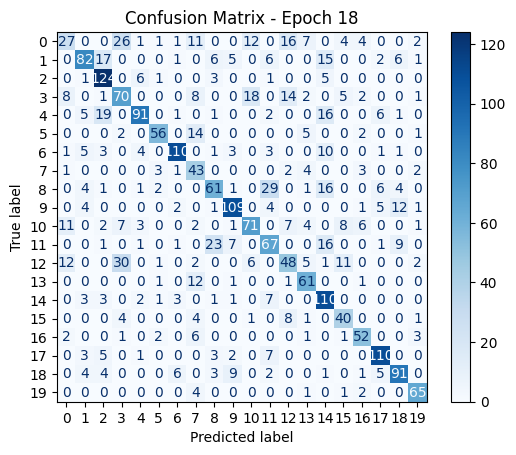

Epoch 18/75 - Train Loss: 1.6445, Train Acc: 0.5797, Val Loss: 1.4077, Val Acc: 0.6634, precision: 0.6611, recall: 0.6700, f1: 0.6572
Best model saved with val accuracy: 0.6634!
Epoch [19/75]

Epoch 19/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6715, Accuracy: 57.97%
Batch 20/719, Loss: 1.8786, Accuracy: 55.55%
Batch 30/719, Loss: 1.7883, Accuracy: 55.52%
Batch 40/719, Loss: 1.5685, Accuracy: 56.84%
Batch 50/719, Loss: 1.4942, Accuracy: 57.53%
Batch 60/719, Loss: 1.5460, Accuracy: 58.07%
Batch 70/719, Loss: 1.6572, Accuracy: 58.42%
Batch 80/719, Loss: 1.7244, Accuracy: 58.26%
Batch 90/719, Loss: 1.5361, Accuracy: 58.30%
Batch 100/719, Loss: 1.5957, Accuracy: 58.44%
Batch 110/719, Loss: 1.6397, Accuracy: 58.78%
Batch 120/719, Loss: 1.6318, Accuracy: 58.36%
Batch 130/719, Loss: 1.6751, Accuracy: 58.21%
Batch 140/719, Loss: 1.6405, Accuracy: 58.34%
Batch 150/719, Loss: 1.7984, Accuracy: 58.17%
Batch 160/719, Loss: 1.4185, Accuracy: 58.23%
Batch 170/719, Loss: 1.4983, Accuracy: 58.

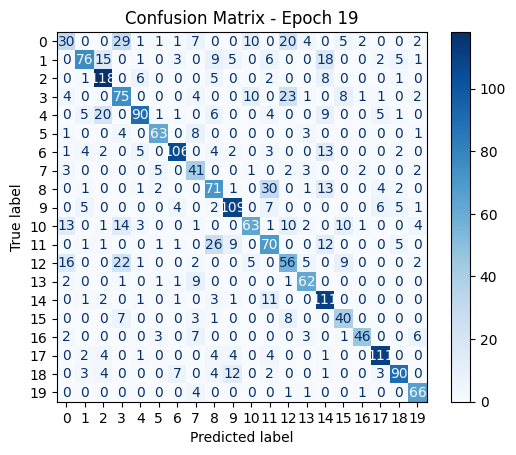

Epoch 19/75 - Train Loss: 1.6231, Train Acc: 0.5912, Val Loss: 1.3893, Val Acc: 0.6661, precision: 0.6728, recall: 0.6725, f1: 0.6651
Best model saved with val accuracy: 0.6661!
Epoch [20/75]

Epoch 20/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.8541, Accuracy: 58.91%
Batch 20/719, Loss: 1.5862, Accuracy: 58.75%
Batch 30/719, Loss: 1.8353, Accuracy: 57.71%
Batch 40/719, Loss: 1.6363, Accuracy: 58.52%
Batch 50/719, Loss: 1.5379, Accuracy: 58.50%
Batch 60/719, Loss: 1.5254, Accuracy: 59.11%
Batch 70/719, Loss: 1.6386, Accuracy: 58.95%
Batch 80/719, Loss: 1.7126, Accuracy: 58.69%
Batch 90/719, Loss: 1.5083, Accuracy: 58.77%
Batch 100/719, Loss: 1.6936, Accuracy: 58.56%
Batch 110/719, Loss: 1.4285, Accuracy: 58.68%
Batch 120/719, Loss: 1.5708, Accuracy: 58.80%
Batch 130/719, Loss: 1.7665, Accuracy: 58.73%
Batch 140/719, Loss: 1.5416, Accuracy: 58.84%
Batch 150/719, Loss: 1.5666, Accuracy: 58.74%
Batch 160/719, Loss: 1.3606, Accuracy: 58.91%
Batch 170/719, Loss: 1.4350, Accuracy: 58.

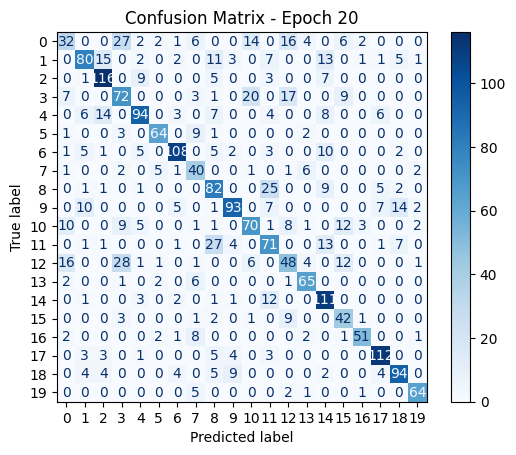

Epoch 20/75 - Train Loss: 1.6055, Train Acc: 0.5970, Val Loss: 1.3749, Val Acc: 0.6728, precision: 0.6773, recall: 0.6812, f1: 0.6742
Best model saved with val accuracy: 0.6728!
Epoch [21/75]

Epoch 21/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6803, Accuracy: 60.31%
Batch 20/719, Loss: 1.6668, Accuracy: 60.47%
Batch 30/719, Loss: 1.9487, Accuracy: 59.48%
Batch 40/719, Loss: 1.5244, Accuracy: 60.43%
Batch 50/719, Loss: 1.6430, Accuracy: 60.50%
Batch 60/719, Loss: 1.6442, Accuracy: 60.65%
Batch 70/719, Loss: 1.6009, Accuracy: 60.09%
Batch 80/719, Loss: 1.7788, Accuracy: 60.27%
Batch 90/719, Loss: 1.5140, Accuracy: 60.23%
Batch 100/719, Loss: 1.5255, Accuracy: 60.23%
Batch 110/719, Loss: 1.5451, Accuracy: 60.41%
Batch 120/719, Loss: 1.5416, Accuracy: 60.46%
Batch 130/719, Loss: 1.5131, Accuracy: 60.41%
Batch 140/719, Loss: 1.5263, Accuracy: 60.33%
Batch 150/719, Loss: 1.6399, Accuracy: 60.28%
Batch 160/719, Loss: 1.3550, Accuracy: 60.52%
Batch 170/719, Loss: 1.5560, Accuracy: 60.

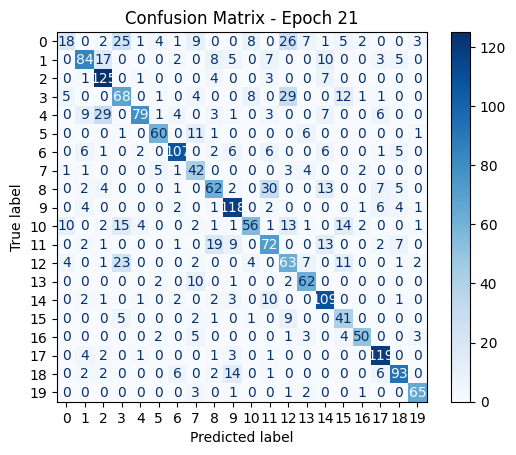

Epoch 21/75 - Train Loss: 1.5822, Train Acc: 0.6079, Val Loss: 1.3825, Val Acc: 0.6656, precision: 0.6699, recall: 0.6724, f1: 0.6582
Epoch [22/75]

Epoch 22/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7459, Accuracy: 61.56%
Batch 20/719, Loss: 1.5914, Accuracy: 60.94%
Batch 30/719, Loss: 1.8250, Accuracy: 60.62%
Batch 40/719, Loss: 1.5157, Accuracy: 61.05%
Batch 50/719, Loss: 1.7702, Accuracy: 61.19%
Batch 60/719, Loss: 1.4304, Accuracy: 61.28%
Batch 70/719, Loss: 1.5682, Accuracy: 61.52%
Batch 80/719, Loss: 1.5861, Accuracy: 61.45%
Batch 90/719, Loss: 1.6173, Accuracy: 61.25%
Batch 100/719, Loss: 1.5643, Accuracy: 61.27%
Batch 110/719, Loss: 1.4779, Accuracy: 61.58%
Batch 120/719, Loss: 1.6230, Accuracy: 61.30%
Batch 130/719, Loss: 1.7204, Accuracy: 61.08%
Batch 140/719, Loss: 1.4866, Accuracy: 61.06%
Batch 150/719, Loss: 1.6351, Accuracy: 60.91%
Batch 160/719, Loss: 1.3141, Accuracy: 61.12%
Batch 170/719, Loss: 1.5435, Accuracy: 61.21%
Batch 180/719, Loss: 1.5842, Accuracy: 6

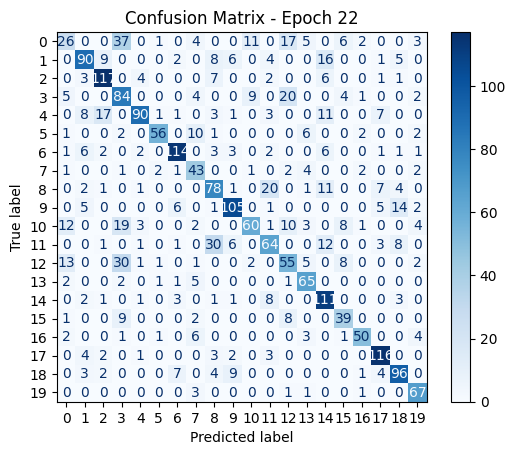

Epoch 22/75 - Train Loss: 1.5635, Train Acc: 0.6154, Val Loss: 1.3589, Val Acc: 0.6803, precision: 0.6840, recall: 0.6853, f1: 0.6769
Best model saved with val accuracy: 0.6803!
Epoch [23/75]

Epoch 23/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6163, Accuracy: 58.91%
Batch 20/719, Loss: 1.7098, Accuracy: 60.39%
Batch 30/719, Loss: 1.7743, Accuracy: 59.32%
Batch 40/719, Loss: 1.5943, Accuracy: 59.69%
Batch 50/719, Loss: 1.5642, Accuracy: 60.22%
Batch 60/719, Loss: 1.4877, Accuracy: 60.91%
Batch 70/719, Loss: 1.5640, Accuracy: 60.85%
Batch 80/719, Loss: 1.6029, Accuracy: 61.11%
Batch 90/719, Loss: 1.5480, Accuracy: 60.89%
Batch 100/719, Loss: 1.5975, Accuracy: 61.08%
Batch 110/719, Loss: 1.5331, Accuracy: 61.29%
Batch 120/719, Loss: 1.5133, Accuracy: 61.12%
Batch 130/719, Loss: 1.5763, Accuracy: 61.17%
Batch 140/719, Loss: 1.4750, Accuracy: 61.19%
Batch 150/719, Loss: 1.5122, Accuracy: 61.14%
Batch 160/719, Loss: 1.4567, Accuracy: 61.31%
Batch 170/719, Loss: 1.4169, Accuracy: 61.

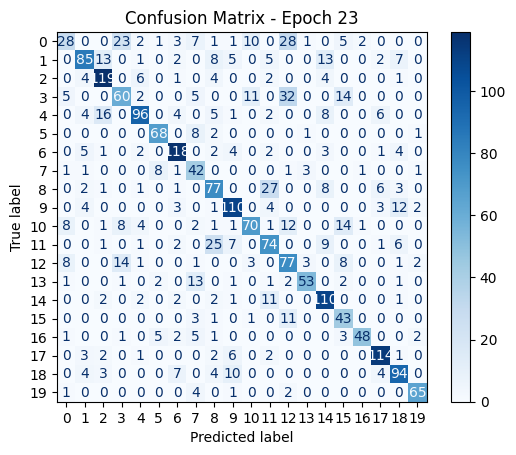

Epoch 23/75 - Train Loss: 1.5515, Train Acc: 0.6183, Val Loss: 1.3442, Val Acc: 0.6915, precision: 0.6995, recall: 0.6956, f1: 0.6884
Best model saved with val accuracy: 0.6915!
Epoch [24/75]

Epoch 24/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6152, Accuracy: 60.47%
Batch 20/719, Loss: 1.6140, Accuracy: 61.02%
Batch 30/719, Loss: 1.6682, Accuracy: 61.30%
Batch 40/719, Loss: 1.4839, Accuracy: 61.33%
Batch 50/719, Loss: 1.4397, Accuracy: 61.78%
Batch 60/719, Loss: 1.4648, Accuracy: 61.93%
Batch 70/719, Loss: 1.5896, Accuracy: 61.67%
Batch 80/719, Loss: 1.7024, Accuracy: 61.70%
Batch 90/719, Loss: 1.4705, Accuracy: 62.00%
Batch 100/719, Loss: 1.4245, Accuracy: 62.25%
Batch 110/719, Loss: 1.4689, Accuracy: 62.51%
Batch 120/719, Loss: 1.5089, Accuracy: 62.51%
Batch 130/719, Loss: 1.5919, Accuracy: 62.48%
Batch 140/719, Loss: 1.4278, Accuracy: 62.50%
Batch 150/719, Loss: 1.5855, Accuracy: 62.38%
Batch 160/719, Loss: 1.4164, Accuracy: 62.48%
Batch 170/719, Loss: 1.5099, Accuracy: 62.

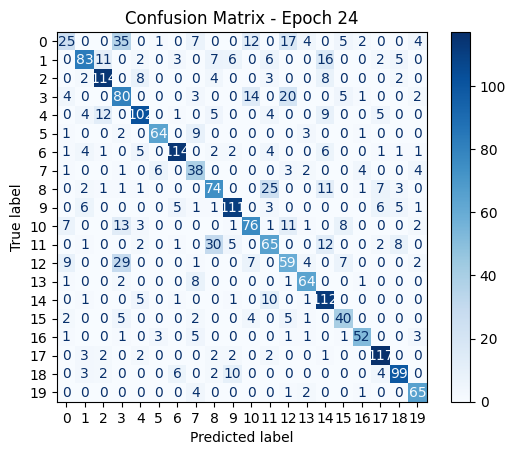

Epoch 24/75 - Train Loss: 1.5326, Train Acc: 0.6279, Val Loss: 1.3287, Val Acc: 0.6928, precision: 0.6921, recall: 0.6962, f1: 0.6886
Best model saved with val accuracy: 0.6928!
Epoch [25/75]

Epoch 25/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.7104, Accuracy: 62.19%
Batch 20/719, Loss: 1.5302, Accuracy: 62.58%
Batch 30/719, Loss: 1.6485, Accuracy: 62.24%
Batch 40/719, Loss: 1.5742, Accuracy: 62.30%
Batch 50/719, Loss: 1.7197, Accuracy: 62.38%
Batch 60/719, Loss: 1.4442, Accuracy: 62.86%
Batch 70/719, Loss: 1.6644, Accuracy: 63.06%
Batch 80/719, Loss: 1.7463, Accuracy: 63.11%
Batch 90/719, Loss: 1.4653, Accuracy: 63.12%
Batch 100/719, Loss: 1.4307, Accuracy: 63.39%
Batch 110/719, Loss: 1.3543, Accuracy: 63.85%
Batch 120/719, Loss: 1.4397, Accuracy: 63.71%
Batch 130/719, Loss: 1.3893, Accuracy: 63.64%
Batch 140/719, Loss: 1.5042, Accuracy: 63.65%
Batch 150/719, Loss: 1.5092, Accuracy: 63.50%
Batch 160/719, Loss: 1.3665, Accuracy: 63.65%
Batch 170/719, Loss: 1.6420, Accuracy: 63.

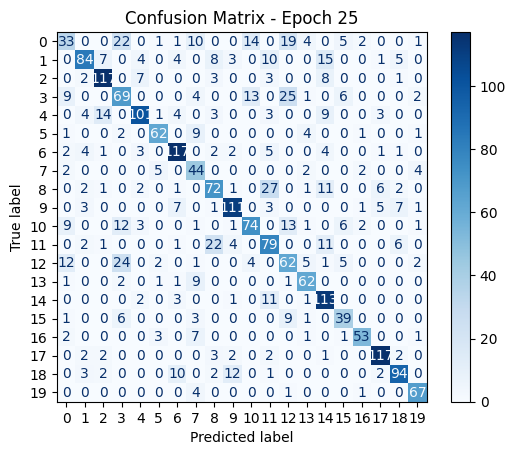

Epoch 25/75 - Train Loss: 1.5122, Train Acc: 0.6380, Val Loss: 1.3184, Val Acc: 0.7000, precision: 0.7013, recall: 0.7050, f1: 0.6983
Best model saved with val accuracy: 0.7000!
Epoch [26/75]

Epoch 26/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5750, Accuracy: 62.19%
Batch 20/719, Loss: 1.3248, Accuracy: 63.05%
Batch 30/719, Loss: 1.6036, Accuracy: 62.08%
Batch 40/719, Loss: 1.5263, Accuracy: 62.11%
Batch 50/719, Loss: 1.6005, Accuracy: 61.91%
Batch 60/719, Loss: 1.3451, Accuracy: 62.60%
Batch 70/719, Loss: 1.4236, Accuracy: 63.06%
Batch 80/719, Loss: 1.5307, Accuracy: 63.38%
Batch 90/719, Loss: 1.4054, Accuracy: 63.52%
Batch 100/719, Loss: 1.5378, Accuracy: 63.28%
Batch 110/719, Loss: 1.4090, Accuracy: 63.44%
Batch 120/719, Loss: 1.3758, Accuracy: 63.19%
Batch 130/719, Loss: 1.4242, Accuracy: 63.26%
Batch 140/719, Loss: 1.4925, Accuracy: 63.02%
Batch 150/719, Loss: 1.4488, Accuracy: 63.15%
Batch 160/719, Loss: 1.3903, Accuracy: 63.12%
Batch 170/719, Loss: 1.3499, Accuracy: 63.

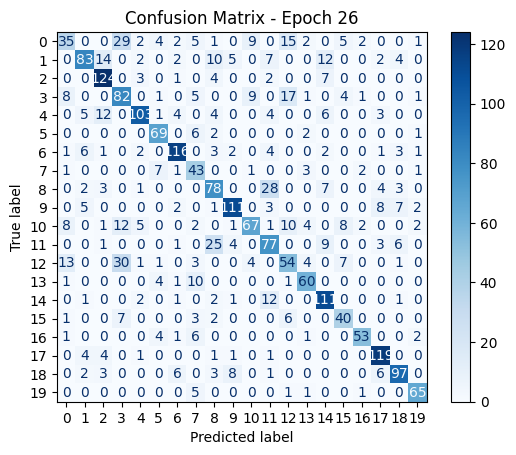

Epoch 26/75 - Train Loss: 1.4978, Train Acc: 0.6422, Val Loss: 1.3070, Val Acc: 0.7075, precision: 0.7076, recall: 0.7117, f1: 0.7041
Best model saved with val accuracy: 0.7075!
Epoch [27/75]

Epoch 27/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5857, Accuracy: 66.25%
Batch 20/719, Loss: 1.5294, Accuracy: 64.06%
Batch 30/719, Loss: 1.6301, Accuracy: 64.27%
Batch 40/719, Loss: 1.4892, Accuracy: 64.41%
Batch 50/719, Loss: 1.5449, Accuracy: 64.88%
Batch 60/719, Loss: 1.2651, Accuracy: 65.52%
Batch 70/719, Loss: 1.4227, Accuracy: 65.40%
Batch 80/719, Loss: 1.6276, Accuracy: 65.25%
Batch 90/719, Loss: 1.5155, Accuracy: 65.16%
Batch 100/719, Loss: 1.4490, Accuracy: 65.16%
Batch 110/719, Loss: 1.3905, Accuracy: 65.48%
Batch 120/719, Loss: 1.4897, Accuracy: 65.07%
Batch 130/719, Loss: 1.5602, Accuracy: 64.93%
Batch 140/719, Loss: 1.5107, Accuracy: 64.91%
Batch 150/719, Loss: 1.5746, Accuracy: 64.86%
Batch 160/719, Loss: 1.4710, Accuracy: 64.94%
Batch 170/719, Loss: 1.5725, Accuracy: 64.

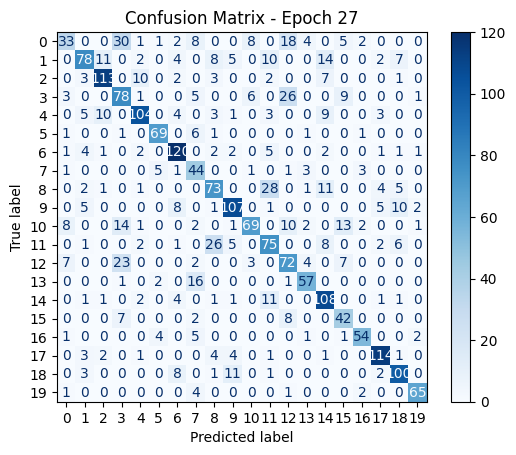

Epoch 27/75 - Train Loss: 1.4834, Train Acc: 0.6518, Val Loss: 1.3086, Val Acc: 0.7022, precision: 0.7083, recall: 0.7090, f1: 0.7013
Epoch [28/75]

Epoch 28/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5805, Accuracy: 65.47%
Batch 20/719, Loss: 1.5970, Accuracy: 64.06%
Batch 30/719, Loss: 1.6691, Accuracy: 63.54%
Batch 40/719, Loss: 1.5828, Accuracy: 63.09%
Batch 50/719, Loss: 1.4053, Accuracy: 63.59%
Batch 60/719, Loss: 1.4333, Accuracy: 64.04%
Batch 70/719, Loss: 1.4272, Accuracy: 63.82%
Batch 80/719, Loss: 1.6101, Accuracy: 63.48%
Batch 90/719, Loss: 1.5908, Accuracy: 63.66%
Batch 100/719, Loss: 1.5904, Accuracy: 64.05%
Batch 110/719, Loss: 1.3468, Accuracy: 64.46%
Batch 120/719, Loss: 1.5060, Accuracy: 64.21%
Batch 130/719, Loss: 1.4930, Accuracy: 64.17%
Batch 140/719, Loss: 1.4263, Accuracy: 64.19%
Batch 150/719, Loss: 1.5237, Accuracy: 64.22%
Batch 160/719, Loss: 1.4075, Accuracy: 64.44%
Batch 170/719, Loss: 1.4487, Accuracy: 64.44%
Batch 180/719, Loss: 1.4884, Accuracy: 6

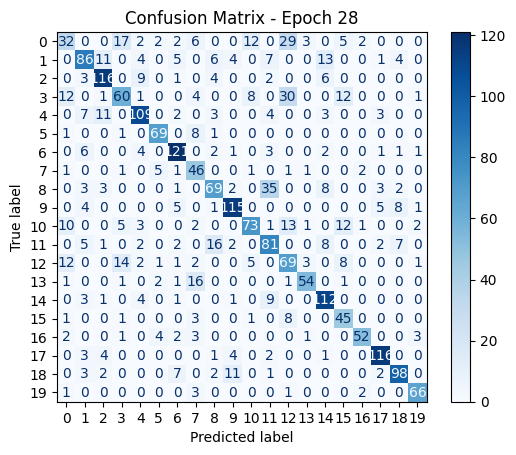

Epoch 28/75 - Train Loss: 1.4711, Train Acc: 0.6538, Val Loss: 1.2796, Val Acc: 0.7084, precision: 0.7104, recall: 0.7146, f1: 0.7065
Best model saved with val accuracy: 0.7084!
Epoch [29/75]

Epoch 29/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6393, Accuracy: 64.69%
Batch 20/719, Loss: 1.4374, Accuracy: 63.98%
Batch 30/719, Loss: 1.6050, Accuracy: 64.53%
Batch 40/719, Loss: 1.3475, Accuracy: 65.00%
Batch 50/719, Loss: 1.5914, Accuracy: 65.12%
Batch 60/719, Loss: 1.3632, Accuracy: 65.68%
Batch 70/719, Loss: 1.3769, Accuracy: 66.00%
Batch 80/719, Loss: 1.5394, Accuracy: 65.84%
Batch 90/719, Loss: 1.3032, Accuracy: 65.97%
Batch 100/719, Loss: 1.4071, Accuracy: 66.08%
Batch 110/719, Loss: 1.4497, Accuracy: 66.32%
Batch 120/719, Loss: 1.3625, Accuracy: 65.92%
Batch 130/719, Loss: 1.6588, Accuracy: 65.65%
Batch 140/719, Loss: 1.3902, Accuracy: 65.78%
Batch 150/719, Loss: 1.5562, Accuracy: 65.70%
Batch 160/719, Loss: 1.2541, Accuracy: 65.81%
Batch 170/719, Loss: 1.5807, Accuracy: 65.

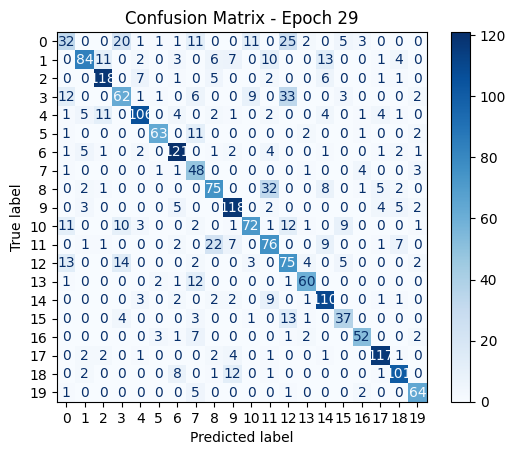

Epoch 29/75 - Train Loss: 1.4577, Train Acc: 0.6598, Val Loss: 1.2962, Val Acc: 0.7093, precision: 0.7113, recall: 0.7125, f1: 0.7054
Best model saved with val accuracy: 0.7093!
Epoch [30/75]

Epoch 30/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6461, Accuracy: 66.56%
Batch 20/719, Loss: 1.5842, Accuracy: 66.09%
Batch 30/719, Loss: 1.5919, Accuracy: 66.09%
Batch 40/719, Loss: 1.5113, Accuracy: 65.27%
Batch 50/719, Loss: 1.5623, Accuracy: 65.47%
Batch 60/719, Loss: 1.3705, Accuracy: 65.73%
Batch 70/719, Loss: 1.4267, Accuracy: 65.96%
Batch 80/719, Loss: 1.5201, Accuracy: 66.02%
Batch 90/719, Loss: 1.4190, Accuracy: 66.09%
Batch 100/719, Loss: 1.3606, Accuracy: 66.11%
Batch 110/719, Loss: 1.4110, Accuracy: 66.21%
Batch 120/719, Loss: 1.4686, Accuracy: 66.16%
Batch 130/719, Loss: 1.4957, Accuracy: 66.14%
Batch 140/719, Loss: 1.4182, Accuracy: 66.23%
Batch 150/719, Loss: 1.5289, Accuracy: 65.98%
Batch 160/719, Loss: 1.3332, Accuracy: 66.13%
Batch 170/719, Loss: 1.3242, Accuracy: 66.

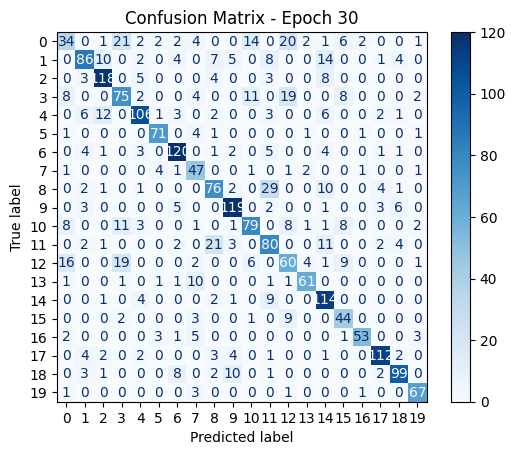

Epoch 30/75 - Train Loss: 1.4399, Train Acc: 0.6674, Val Loss: 1.2806, Val Acc: 0.7227, precision: 0.7246, recall: 0.7299, f1: 0.7229
Best model saved with val accuracy: 0.7227!
Epoch [31/75]

Epoch 31/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6496, Accuracy: 63.91%
Batch 20/719, Loss: 1.4736, Accuracy: 64.92%
Batch 30/719, Loss: 1.7140, Accuracy: 64.32%
Batch 40/719, Loss: 1.5000, Accuracy: 64.57%
Batch 50/719, Loss: 1.4486, Accuracy: 65.41%
Batch 60/719, Loss: 1.3620, Accuracy: 65.86%
Batch 70/719, Loss: 1.6108, Accuracy: 65.85%
Batch 80/719, Loss: 1.5570, Accuracy: 65.66%
Batch 90/719, Loss: 1.3846, Accuracy: 65.68%
Batch 100/719, Loss: 1.5268, Accuracy: 65.88%
Batch 110/719, Loss: 1.3648, Accuracy: 66.14%
Batch 120/719, Loss: 1.4005, Accuracy: 66.07%
Batch 130/719, Loss: 1.5096, Accuracy: 65.95%
Batch 140/719, Loss: 1.3146, Accuracy: 66.09%
Batch 150/719, Loss: 1.4430, Accuracy: 66.19%
Batch 160/719, Loss: 1.2860, Accuracy: 66.30%
Batch 170/719, Loss: 1.3719, Accuracy: 66.

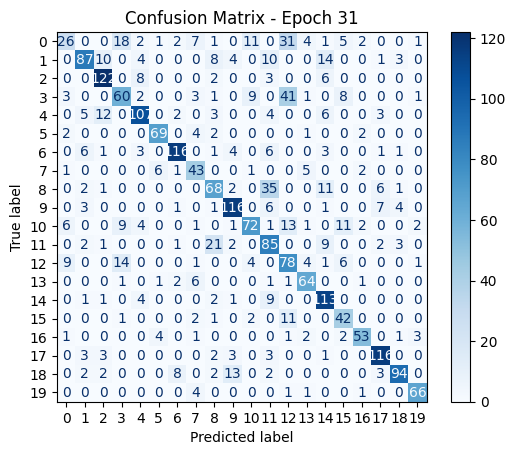

Epoch 31/75 - Train Loss: 1.4320, Train Acc: 0.6704, Val Loss: 1.2793, Val Acc: 0.7120, precision: 0.7180, recall: 0.7179, f1: 0.7101
Epoch [32/75]

Epoch 32/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5100, Accuracy: 68.44%
Batch 20/719, Loss: 1.5172, Accuracy: 67.73%
Batch 30/719, Loss: 1.7355, Accuracy: 67.76%
Batch 40/719, Loss: 1.5030, Accuracy: 67.23%
Batch 50/719, Loss: 1.4346, Accuracy: 67.44%
Batch 60/719, Loss: 1.3072, Accuracy: 67.76%
Batch 70/719, Loss: 1.3593, Accuracy: 67.81%
Batch 80/719, Loss: 1.5747, Accuracy: 67.95%
Batch 90/719, Loss: 1.3047, Accuracy: 68.16%
Batch 100/719, Loss: 1.3340, Accuracy: 68.03%
Batch 110/719, Loss: 1.5124, Accuracy: 68.28%
Batch 120/719, Loss: 1.3345, Accuracy: 68.24%
Batch 130/719, Loss: 1.3383, Accuracy: 68.22%
Batch 140/719, Loss: 1.3322, Accuracy: 68.19%
Batch 150/719, Loss: 1.5451, Accuracy: 67.94%
Batch 160/719, Loss: 1.2745, Accuracy: 67.90%
Batch 170/719, Loss: 1.3140, Accuracy: 67.88%
Batch 180/719, Loss: 1.2946, Accuracy: 6

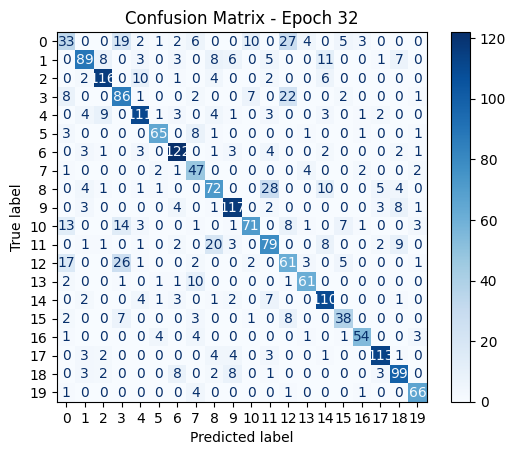

Epoch 32/75 - Train Loss: 1.4194, Train Acc: 0.6765, Val Loss: 1.2623, Val Acc: 0.7178, precision: 0.7183, recall: 0.7211, f1: 0.7161
Epoch [33/75]

Epoch 33/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.6196, Accuracy: 64.53%
Batch 20/719, Loss: 1.6554, Accuracy: 65.62%
Batch 30/719, Loss: 1.5869, Accuracy: 66.61%
Batch 40/719, Loss: 1.3896, Accuracy: 66.21%
Batch 50/719, Loss: 1.4580, Accuracy: 66.44%
Batch 60/719, Loss: 1.4101, Accuracy: 67.24%
Batch 70/719, Loss: 1.2626, Accuracy: 67.63%
Batch 80/719, Loss: 1.6284, Accuracy: 67.42%
Batch 90/719, Loss: 1.3519, Accuracy: 67.22%
Batch 100/719, Loss: 1.5156, Accuracy: 67.19%
Batch 110/719, Loss: 1.3486, Accuracy: 67.60%
Batch 120/719, Loss: 1.2829, Accuracy: 67.68%
Batch 130/719, Loss: 1.4920, Accuracy: 67.70%
Batch 140/719, Loss: 1.2938, Accuracy: 67.91%
Batch 150/719, Loss: 1.5636, Accuracy: 67.88%
Batch 160/719, Loss: 1.2651, Accuracy: 68.09%
Batch 170/719, Loss: 1.2952, Accuracy: 67.94%
Batch 180/719, Loss: 1.4238, Accuracy: 6

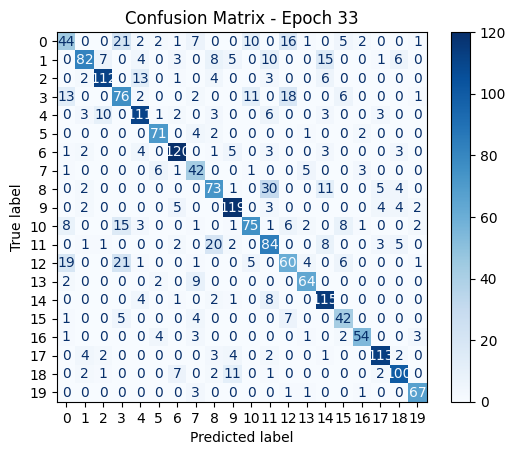

Epoch 33/75 - Train Loss: 1.4091, Train Acc: 0.6831, Val Loss: 1.2605, Val Acc: 0.7240, precision: 0.7240, recall: 0.7297, f1: 0.7235
Best model saved with val accuracy: 0.7240!
Epoch [34/75]

Epoch 34/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5448, Accuracy: 67.81%
Batch 20/719, Loss: 1.5605, Accuracy: 66.48%
Batch 30/719, Loss: 1.6909, Accuracy: 67.08%
Batch 40/719, Loss: 1.4152, Accuracy: 67.70%
Batch 50/719, Loss: 1.3579, Accuracy: 68.31%
Batch 60/719, Loss: 1.2688, Accuracy: 68.83%
Batch 70/719, Loss: 1.3532, Accuracy: 68.55%
Batch 80/719, Loss: 1.4308, Accuracy: 68.55%
Batch 90/719, Loss: 1.2632, Accuracy: 68.54%
Batch 100/719, Loss: 1.3341, Accuracy: 68.58%
Batch 110/719, Loss: 1.3591, Accuracy: 68.78%
Batch 120/719, Loss: 1.2253, Accuracy: 68.40%
Batch 130/719, Loss: 1.4000, Accuracy: 68.29%
Batch 140/719, Loss: 1.4308, Accuracy: 68.25%
Batch 150/719, Loss: 1.5284, Accuracy: 68.18%
Batch 160/719, Loss: 1.2546, Accuracy: 68.35%
Batch 170/719, Loss: 1.2558, Accuracy: 68.

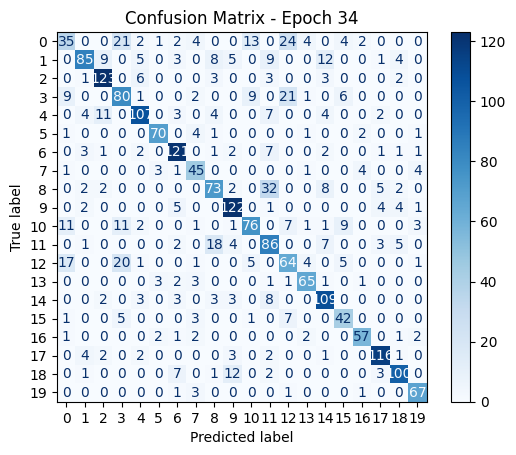

Epoch 34/75 - Train Loss: 1.3900, Train Acc: 0.6897, Val Loss: 1.2450, Val Acc: 0.7325, precision: 0.7332, recall: 0.7387, f1: 0.7328
Best model saved with val accuracy: 0.7325!
Epoch [35/75]

Epoch 35/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5078, Accuracy: 66.09%
Batch 20/719, Loss: 1.3696, Accuracy: 67.58%
Batch 30/719, Loss: 1.6921, Accuracy: 67.29%
Batch 40/719, Loss: 1.5387, Accuracy: 67.70%
Batch 50/719, Loss: 1.4642, Accuracy: 67.97%
Batch 60/719, Loss: 1.3049, Accuracy: 68.54%
Batch 70/719, Loss: 1.2959, Accuracy: 68.66%
Batch 80/719, Loss: 1.3660, Accuracy: 68.77%
Batch 90/719, Loss: 1.4086, Accuracy: 68.85%
Batch 100/719, Loss: 1.3182, Accuracy: 68.72%
Batch 110/719, Loss: 1.3209, Accuracy: 68.86%
Batch 120/719, Loss: 1.3332, Accuracy: 68.67%
Batch 130/719, Loss: 1.4987, Accuracy: 68.76%
Batch 140/719, Loss: 1.3215, Accuracy: 68.83%
Batch 150/719, Loss: 1.4377, Accuracy: 68.65%
Batch 160/719, Loss: 1.2832, Accuracy: 68.68%
Batch 170/719, Loss: 1.2683, Accuracy: 68.

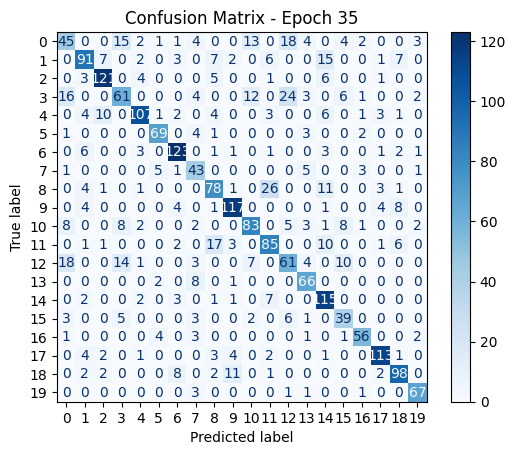

Epoch 35/75 - Train Loss: 1.3819, Train Acc: 0.6925, Val Loss: 1.2506, Val Acc: 0.7303, precision: 0.7233, recall: 0.7347, f1: 0.7263
Epoch [36/75]

Epoch 36/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4360, Accuracy: 69.53%
Batch 20/719, Loss: 1.5349, Accuracy: 68.20%
Batch 30/719, Loss: 1.5287, Accuracy: 68.75%
Batch 40/719, Loss: 1.4442, Accuracy: 68.71%
Batch 50/719, Loss: 1.3254, Accuracy: 69.31%
Batch 60/719, Loss: 1.3218, Accuracy: 69.90%
Batch 70/719, Loss: 1.2516, Accuracy: 70.09%
Batch 80/719, Loss: 1.5687, Accuracy: 69.77%
Batch 90/719, Loss: 1.4449, Accuracy: 69.50%
Batch 100/719, Loss: 1.3155, Accuracy: 69.56%
Batch 110/719, Loss: 1.3708, Accuracy: 69.59%
Batch 120/719, Loss: 1.2490, Accuracy: 69.44%
Batch 130/719, Loss: 1.3452, Accuracy: 69.47%
Batch 140/719, Loss: 1.3702, Accuracy: 69.58%
Batch 150/719, Loss: 1.5875, Accuracy: 69.44%
Batch 160/719, Loss: 1.3374, Accuracy: 69.63%
Batch 170/719, Loss: 1.3672, Accuracy: 69.49%
Batch 180/719, Loss: 1.4334, Accuracy: 6

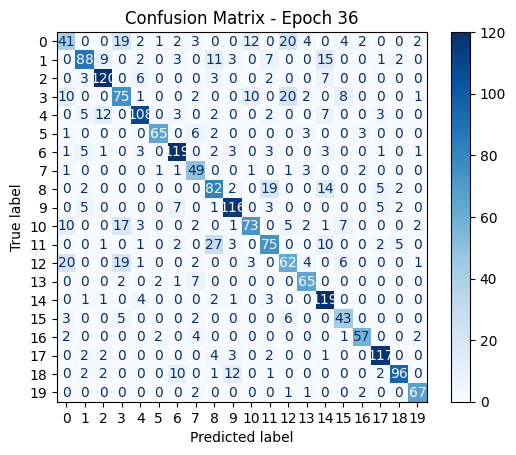

Epoch 36/75 - Train Loss: 1.3718, Train Acc: 0.6971, Val Loss: 1.2522, Val Acc: 0.7298, precision: 0.7328, recall: 0.7378, f1: 0.7316
Epoch [37/75]

Epoch 37/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4803, Accuracy: 69.84%
Batch 20/719, Loss: 1.4375, Accuracy: 68.52%
Batch 30/719, Loss: 1.5484, Accuracy: 67.92%
Batch 40/719, Loss: 1.2801, Accuracy: 68.59%
Batch 50/719, Loss: 1.2626, Accuracy: 69.16%
Batch 60/719, Loss: 1.3586, Accuracy: 69.77%
Batch 70/719, Loss: 1.2534, Accuracy: 69.64%
Batch 80/719, Loss: 1.4957, Accuracy: 69.63%
Batch 90/719, Loss: 1.3337, Accuracy: 69.70%
Batch 100/719, Loss: 1.4088, Accuracy: 69.92%
Batch 110/719, Loss: 1.3419, Accuracy: 70.23%
Batch 120/719, Loss: 1.2418, Accuracy: 70.29%
Batch 130/719, Loss: 1.3687, Accuracy: 70.20%
Batch 140/719, Loss: 1.3052, Accuracy: 70.08%
Batch 150/719, Loss: 1.3986, Accuracy: 70.05%
Batch 160/719, Loss: 1.2635, Accuracy: 70.26%
Batch 170/719, Loss: 1.2787, Accuracy: 70.20%
Batch 180/719, Loss: 1.2991, Accuracy: 7

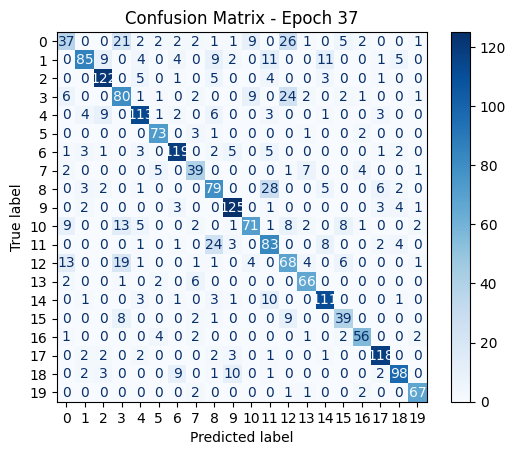

Epoch 37/75 - Train Loss: 1.3596, Train Acc: 0.7040, Val Loss: 1.2459, Val Acc: 0.7352, precision: 0.7347, recall: 0.7375, f1: 0.7325
Best model saved with val accuracy: 0.7352!
Epoch [38/75]

Epoch 38/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5576, Accuracy: 69.22%
Batch 20/719, Loss: 1.4279, Accuracy: 67.34%
Batch 30/719, Loss: 1.5574, Accuracy: 67.92%
Batch 40/719, Loss: 1.3311, Accuracy: 68.83%
Batch 50/719, Loss: 1.2697, Accuracy: 69.28%
Batch 60/719, Loss: 1.3174, Accuracy: 69.48%
Batch 70/719, Loss: 1.3866, Accuracy: 69.71%
Batch 80/719, Loss: 1.4530, Accuracy: 69.45%
Batch 90/719, Loss: 1.2157, Accuracy: 69.72%
Batch 100/719, Loss: 1.2913, Accuracy: 69.84%
Batch 110/719, Loss: 1.2907, Accuracy: 69.93%
Batch 120/719, Loss: 1.3401, Accuracy: 69.67%
Batch 130/719, Loss: 1.5361, Accuracy: 69.42%
Batch 140/719, Loss: 1.2700, Accuracy: 69.44%
Batch 150/719, Loss: 1.3941, Accuracy: 69.34%
Batch 160/719, Loss: 1.2786, Accuracy: 69.42%
Batch 170/719, Loss: 1.2562, Accuracy: 69.

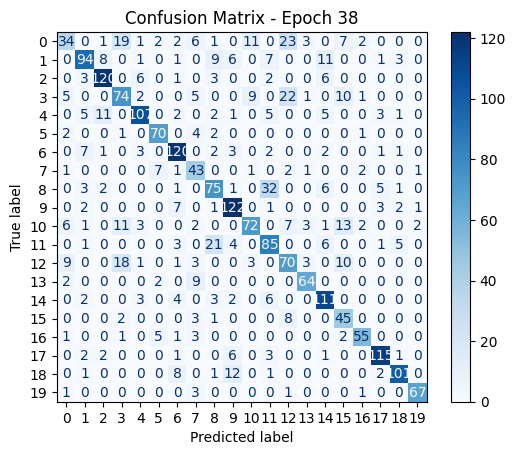

Epoch 38/75 - Train Loss: 1.3559, Train Acc: 0.7044, Val Loss: 1.2470, Val Acc: 0.7329, precision: 0.7329, recall: 0.7385, f1: 0.7302
Epoch [39/75]

Epoch 39/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5522, Accuracy: 70.94%
Batch 20/719, Loss: 1.5599, Accuracy: 69.45%
Batch 30/719, Loss: 1.5052, Accuracy: 69.17%
Batch 40/719, Loss: 1.4466, Accuracy: 69.30%
Batch 50/719, Loss: 1.3680, Accuracy: 69.97%
Batch 60/719, Loss: 1.3239, Accuracy: 70.16%
Batch 70/719, Loss: 1.3851, Accuracy: 70.31%
Batch 80/719, Loss: 1.4323, Accuracy: 70.47%
Batch 90/719, Loss: 1.1916, Accuracy: 70.38%
Batch 100/719, Loss: 1.3408, Accuracy: 70.14%
Batch 110/719, Loss: 1.3530, Accuracy: 70.31%
Batch 120/719, Loss: 1.3788, Accuracy: 70.20%
Batch 130/719, Loss: 1.3988, Accuracy: 70.08%
Batch 140/719, Loss: 1.3831, Accuracy: 70.17%
Batch 150/719, Loss: 1.2523, Accuracy: 70.07%
Batch 160/719, Loss: 1.0819, Accuracy: 70.18%
Batch 170/719, Loss: 1.3131, Accuracy: 70.10%
Batch 180/719, Loss: 1.1975, Accuracy: 7

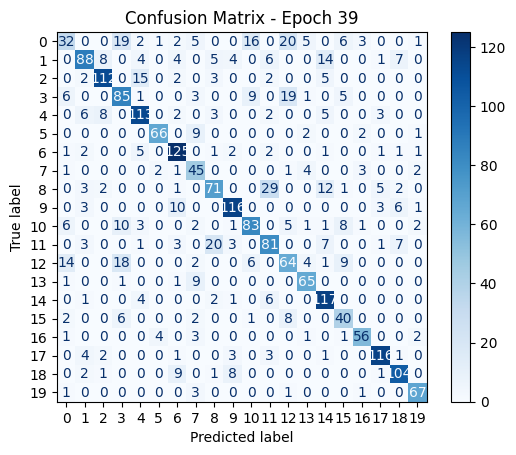

Epoch 39/75 - Train Loss: 1.3411, Train Acc: 0.7098, Val Loss: 1.2300, Val Acc: 0.7338, precision: 0.7291, recall: 0.7376, f1: 0.7292
Epoch [40/75]

Epoch 40/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4301, Accuracy: 71.09%
Batch 20/719, Loss: 1.4792, Accuracy: 70.31%
Batch 30/719, Loss: 1.4583, Accuracy: 70.68%
Batch 40/719, Loss: 1.4830, Accuracy: 70.59%
Batch 50/719, Loss: 1.2889, Accuracy: 70.97%
Batch 60/719, Loss: 1.1603, Accuracy: 71.56%
Batch 70/719, Loss: 1.2566, Accuracy: 71.63%
Batch 80/719, Loss: 1.2212, Accuracy: 71.54%
Batch 90/719, Loss: 1.2527, Accuracy: 71.35%
Batch 100/719, Loss: 1.3421, Accuracy: 71.41%
Batch 110/719, Loss: 1.1988, Accuracy: 71.62%
Batch 120/719, Loss: 1.3062, Accuracy: 71.58%
Batch 130/719, Loss: 1.3425, Accuracy: 71.41%
Batch 140/719, Loss: 1.3214, Accuracy: 71.42%
Batch 150/719, Loss: 1.2763, Accuracy: 71.50%
Batch 160/719, Loss: 1.2071, Accuracy: 71.66%
Batch 170/719, Loss: 1.3247, Accuracy: 71.49%
Batch 180/719, Loss: 1.2235, Accuracy: 7

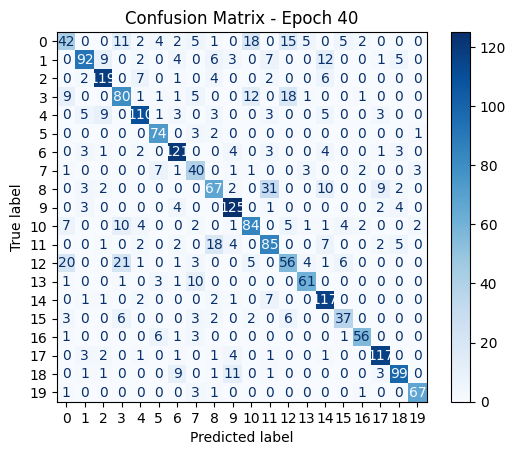

Epoch 40/75 - Train Loss: 1.3307, Train Acc: 0.7136, Val Loss: 1.2350, Val Acc: 0.7352, precision: 0.7317, recall: 0.7359, f1: 0.7307
Epoch [41/75]

Epoch 41/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3837, Accuracy: 69.38%
Batch 20/719, Loss: 1.4386, Accuracy: 69.77%
Batch 30/719, Loss: 1.6487, Accuracy: 69.69%
Batch 40/719, Loss: 1.3905, Accuracy: 70.20%
Batch 50/719, Loss: 1.3592, Accuracy: 70.19%
Batch 60/719, Loss: 1.0874, Accuracy: 70.81%
Batch 70/719, Loss: 1.2623, Accuracy: 71.09%
Batch 80/719, Loss: 1.3253, Accuracy: 71.13%
Batch 90/719, Loss: 1.3098, Accuracy: 71.04%
Batch 100/719, Loss: 1.2978, Accuracy: 71.27%
Batch 110/719, Loss: 1.1731, Accuracy: 71.56%
Batch 120/719, Loss: 1.2578, Accuracy: 71.22%
Batch 130/719, Loss: 1.3619, Accuracy: 71.21%
Batch 140/719, Loss: 1.4707, Accuracy: 71.28%
Batch 150/719, Loss: 1.3877, Accuracy: 71.34%
Batch 160/719, Loss: 1.2512, Accuracy: 71.56%
Batch 170/719, Loss: 1.0767, Accuracy: 71.53%
Batch 180/719, Loss: 1.3959, Accuracy: 7

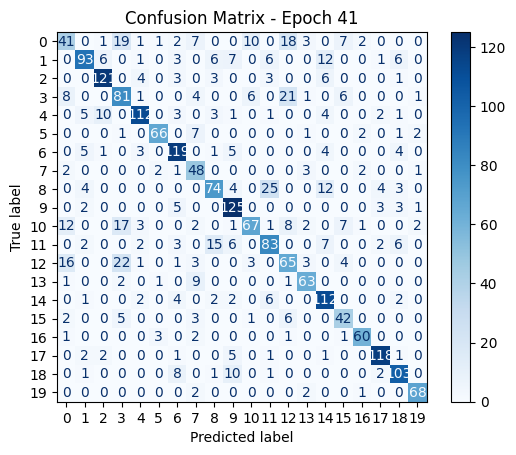

Epoch 41/75 - Train Loss: 1.3162, Train Acc: 0.7198, Val Loss: 1.2248, Val Acc: 0.7405, precision: 0.7421, recall: 0.7467, f1: 0.7399
Best model saved with val accuracy: 0.7405!
Epoch [42/75]

Epoch 42/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2833, Accuracy: 73.12%
Batch 20/719, Loss: 1.3816, Accuracy: 72.50%
Batch 30/719, Loss: 1.5312, Accuracy: 71.88%
Batch 40/719, Loss: 1.3281, Accuracy: 72.19%
Batch 50/719, Loss: 1.3879, Accuracy: 72.06%
Batch 60/719, Loss: 1.3000, Accuracy: 72.14%
Batch 70/719, Loss: 1.3982, Accuracy: 72.19%
Batch 80/719, Loss: 1.3725, Accuracy: 72.21%
Batch 90/719, Loss: 1.3562, Accuracy: 72.14%
Batch 100/719, Loss: 1.0910, Accuracy: 72.30%
Batch 110/719, Loss: 1.4269, Accuracy: 72.46%
Batch 120/719, Loss: 1.2405, Accuracy: 72.33%
Batch 130/719, Loss: 1.5984, Accuracy: 72.12%
Batch 140/719, Loss: 1.1006, Accuracy: 72.25%
Batch 150/719, Loss: 1.3545, Accuracy: 72.08%
Batch 160/719, Loss: 1.1542, Accuracy: 72.06%
Batch 170/719, Loss: 1.2385, Accuracy: 72.

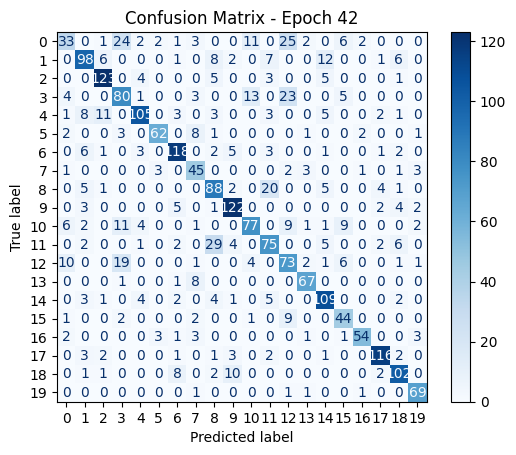

Epoch 42/75 - Train Loss: 1.3119, Train Acc: 0.7230, Val Loss: 1.2254, Val Acc: 0.7401, precision: 0.7418, recall: 0.7444, f1: 0.7389
Epoch [43/75]

Epoch 43/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5355, Accuracy: 71.56%
Batch 20/719, Loss: 1.4606, Accuracy: 71.09%
Batch 30/719, Loss: 1.4545, Accuracy: 71.09%
Batch 40/719, Loss: 1.4258, Accuracy: 71.91%
Batch 50/719, Loss: 1.2965, Accuracy: 72.09%
Batch 60/719, Loss: 1.1130, Accuracy: 72.55%
Batch 70/719, Loss: 1.3535, Accuracy: 72.41%
Batch 80/719, Loss: 1.2524, Accuracy: 72.50%
Batch 90/719, Loss: 1.2435, Accuracy: 72.57%
Batch 100/719, Loss: 1.2167, Accuracy: 72.47%
Batch 110/719, Loss: 1.4947, Accuracy: 72.51%
Batch 120/719, Loss: 1.2929, Accuracy: 72.37%
Batch 130/719, Loss: 1.4090, Accuracy: 72.27%
Batch 140/719, Loss: 1.3115, Accuracy: 72.44%
Batch 150/719, Loss: 1.1155, Accuracy: 72.40%
Batch 160/719, Loss: 1.2571, Accuracy: 72.50%
Batch 170/719, Loss: 1.3119, Accuracy: 72.34%
Batch 180/719, Loss: 1.2523, Accuracy: 7

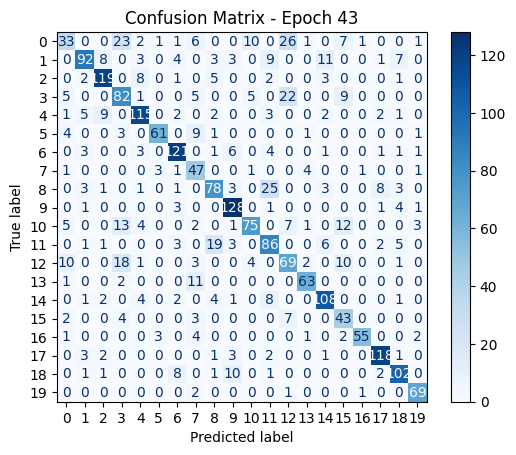

Epoch 43/75 - Train Loss: 1.3017, Train Acc: 0.7285, Val Loss: 1.2150, Val Acc: 0.7419, precision: 0.7437, recall: 0.7450, f1: 0.7380
Best model saved with val accuracy: 0.7419!
Epoch [44/75]

Epoch 44/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.5136, Accuracy: 72.19%
Batch 20/719, Loss: 1.5073, Accuracy: 71.09%
Batch 30/719, Loss: 1.6527, Accuracy: 72.03%
Batch 40/719, Loss: 1.4216, Accuracy: 72.89%
Batch 50/719, Loss: 1.3360, Accuracy: 72.72%
Batch 60/719, Loss: 1.4035, Accuracy: 73.18%
Batch 70/719, Loss: 1.2225, Accuracy: 73.35%
Batch 80/719, Loss: 1.4421, Accuracy: 73.16%
Batch 90/719, Loss: 1.2428, Accuracy: 73.00%
Batch 100/719, Loss: 1.2228, Accuracy: 73.16%
Batch 110/719, Loss: 1.2918, Accuracy: 73.64%
Batch 120/719, Loss: 1.3152, Accuracy: 73.40%
Batch 130/719, Loss: 1.2626, Accuracy: 73.41%
Batch 140/719, Loss: 1.1626, Accuracy: 73.40%
Batch 150/719, Loss: 1.2057, Accuracy: 73.34%
Batch 160/719, Loss: 1.2076, Accuracy: 73.25%
Batch 170/719, Loss: 1.2599, Accuracy: 73.

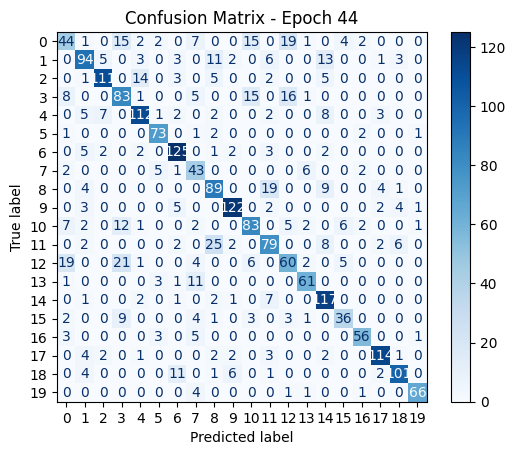

Epoch 44/75 - Train Loss: 1.2874, Train Acc: 0.7350, Val Loss: 1.2178, Val Acc: 0.7441, precision: 0.7445, recall: 0.7445, f1: 0.7416
Best model saved with val accuracy: 0.7441!
Epoch [45/75]

Epoch 45/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3769, Accuracy: 70.94%
Batch 20/719, Loss: 1.3197, Accuracy: 69.77%
Batch 30/719, Loss: 1.6430, Accuracy: 70.99%
Batch 40/719, Loss: 1.2748, Accuracy: 71.48%
Batch 50/719, Loss: 1.4291, Accuracy: 71.66%
Batch 60/719, Loss: 1.3380, Accuracy: 72.08%
Batch 70/719, Loss: 1.2092, Accuracy: 72.37%
Batch 80/719, Loss: 1.4074, Accuracy: 72.09%
Batch 90/719, Loss: 1.3703, Accuracy: 72.12%
Batch 100/719, Loss: 1.1525, Accuracy: 72.27%
Batch 110/719, Loss: 1.2174, Accuracy: 72.41%
Batch 120/719, Loss: 1.1391, Accuracy: 72.32%
Batch 130/719, Loss: 1.2796, Accuracy: 72.26%
Batch 140/719, Loss: 1.2447, Accuracy: 72.35%
Batch 150/719, Loss: 1.1830, Accuracy: 72.60%
Batch 160/719, Loss: 1.1550, Accuracy: 72.88%
Batch 170/719, Loss: 1.1570, Accuracy: 73.

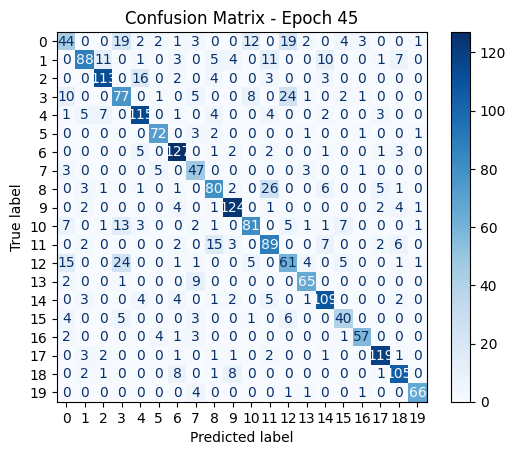

Epoch 45/75 - Train Loss: 1.2894, Train Acc: 0.7335, Val Loss: 1.2031, Val Acc: 0.7486, precision: 0.7490, recall: 0.7532, f1: 0.7487
Best model saved with val accuracy: 0.7486!
Epoch [46/75]

Epoch 46/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4254, Accuracy: 71.88%
Batch 20/719, Loss: 1.3627, Accuracy: 72.42%
Batch 30/719, Loss: 1.4720, Accuracy: 73.23%
Batch 40/719, Loss: 1.2430, Accuracy: 73.40%
Batch 50/719, Loss: 1.2732, Accuracy: 73.25%
Batch 60/719, Loss: 1.1436, Accuracy: 73.83%
Batch 70/719, Loss: 1.5125, Accuracy: 73.75%
Batch 80/719, Loss: 1.4159, Accuracy: 73.52%
Batch 90/719, Loss: 1.1953, Accuracy: 73.52%
Batch 100/719, Loss: 1.0990, Accuracy: 73.53%
Batch 110/719, Loss: 1.1550, Accuracy: 73.85%
Batch 120/719, Loss: 1.1886, Accuracy: 73.74%
Batch 130/719, Loss: 1.2211, Accuracy: 73.79%
Batch 140/719, Loss: 1.2146, Accuracy: 73.77%
Batch 150/719, Loss: 1.1143, Accuracy: 73.78%
Batch 160/719, Loss: 1.2695, Accuracy: 73.87%
Batch 170/719, Loss: 1.2559, Accuracy: 73.

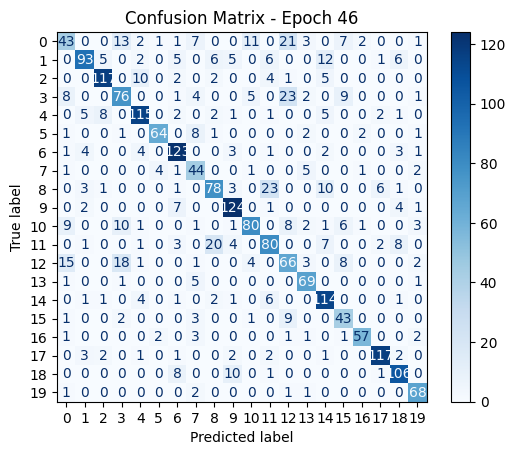

Epoch 46/75 - Train Loss: 1.2694, Train Acc: 0.7420, Val Loss: 1.2126, Val Acc: 0.7477, precision: 0.7445, recall: 0.7520, f1: 0.7445
Epoch [47/75]

Epoch 47/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4204, Accuracy: 74.06%
Batch 20/719, Loss: 1.4220, Accuracy: 73.75%
Batch 30/719, Loss: 1.5829, Accuracy: 73.49%
Batch 40/719, Loss: 1.2966, Accuracy: 74.73%
Batch 50/719, Loss: 1.3068, Accuracy: 74.91%
Batch 60/719, Loss: 1.2264, Accuracy: 74.74%
Batch 70/719, Loss: 1.2820, Accuracy: 75.22%
Batch 80/719, Loss: 1.3766, Accuracy: 74.73%
Batch 90/719, Loss: 1.2335, Accuracy: 74.74%
Batch 100/719, Loss: 1.1819, Accuracy: 74.73%
Batch 110/719, Loss: 1.3256, Accuracy: 74.91%
Batch 120/719, Loss: 1.2717, Accuracy: 74.66%
Batch 130/719, Loss: 1.2925, Accuracy: 74.56%
Batch 140/719, Loss: 1.1726, Accuracy: 74.64%
Batch 150/719, Loss: 1.2492, Accuracy: 74.52%
Batch 160/719, Loss: 1.1939, Accuracy: 74.57%
Batch 170/719, Loss: 1.1120, Accuracy: 74.50%
Batch 180/719, Loss: 1.1670, Accuracy: 7

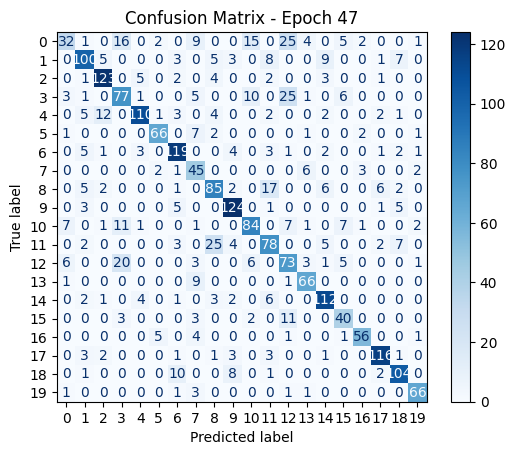

Epoch 47/75 - Train Loss: 1.2617, Train Acc: 0.7459, Val Loss: 1.2132, Val Acc: 0.7472, precision: 0.7453, recall: 0.7490, f1: 0.7417
Epoch [48/75]

Epoch 48/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2459, Accuracy: 71.72%
Batch 20/719, Loss: 1.4384, Accuracy: 71.64%
Batch 30/719, Loss: 1.5034, Accuracy: 72.76%
Batch 40/719, Loss: 1.3606, Accuracy: 73.16%
Batch 50/719, Loss: 1.3677, Accuracy: 73.66%
Batch 60/719, Loss: 1.2129, Accuracy: 73.57%
Batch 70/719, Loss: 1.2586, Accuracy: 73.73%
Batch 80/719, Loss: 1.3064, Accuracy: 73.81%
Batch 90/719, Loss: 0.9960, Accuracy: 73.91%
Batch 100/719, Loss: 1.0999, Accuracy: 73.94%
Batch 110/719, Loss: 1.3364, Accuracy: 74.29%
Batch 120/719, Loss: 1.1613, Accuracy: 74.21%
Batch 130/719, Loss: 1.3499, Accuracy: 74.05%
Batch 140/719, Loss: 1.2642, Accuracy: 74.11%
Batch 150/719, Loss: 1.2484, Accuracy: 74.10%
Batch 160/719, Loss: 1.1945, Accuracy: 74.39%
Batch 170/719, Loss: 1.1401, Accuracy: 74.47%
Batch 180/719, Loss: 1.1851, Accuracy: 7

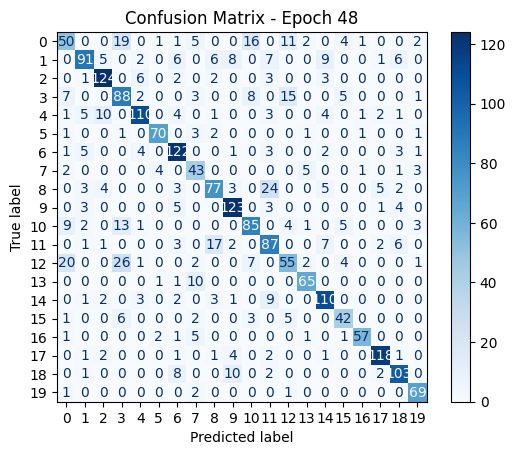

Epoch 48/75 - Train Loss: 1.2613, Train Acc: 0.7481, Val Loss: 1.2033, Val Acc: 0.7530, precision: 0.7544, recall: 0.7566, f1: 0.7528
Best model saved with val accuracy: 0.7530!
Epoch [49/75]

Epoch 49/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4441, Accuracy: 72.81%
Batch 20/719, Loss: 1.3455, Accuracy: 73.83%
Batch 30/719, Loss: 1.3707, Accuracy: 74.01%
Batch 40/719, Loss: 1.1859, Accuracy: 73.71%
Batch 50/719, Loss: 1.2287, Accuracy: 74.16%
Batch 60/719, Loss: 1.1019, Accuracy: 74.43%
Batch 70/719, Loss: 1.1910, Accuracy: 74.75%
Batch 80/719, Loss: 1.2646, Accuracy: 74.61%
Batch 90/719, Loss: 1.3152, Accuracy: 74.70%
Batch 100/719, Loss: 1.4767, Accuracy: 74.80%
Batch 110/719, Loss: 1.2518, Accuracy: 74.84%
Batch 120/719, Loss: 1.1244, Accuracy: 74.74%
Batch 130/719, Loss: 1.3893, Accuracy: 74.71%
Batch 140/719, Loss: 1.1551, Accuracy: 74.89%
Batch 150/719, Loss: 1.2443, Accuracy: 74.77%
Batch 160/719, Loss: 1.0168, Accuracy: 74.95%
Batch 170/719, Loss: 1.1031, Accuracy: 75.

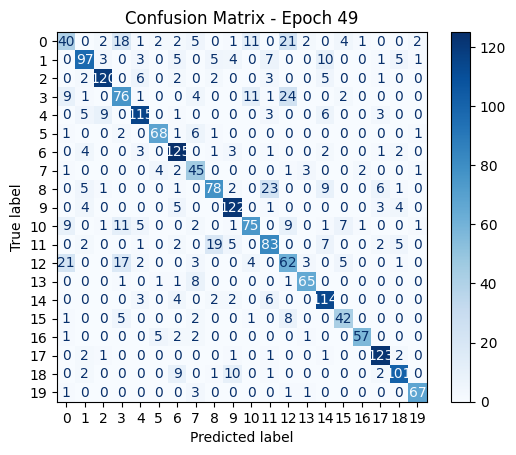

Epoch 49/75 - Train Loss: 1.2516, Train Acc: 0.7487, Val Loss: 1.2117, Val Acc: 0.7468, precision: 0.7483, recall: 0.7501, f1: 0.7466
Epoch [50/75]

Epoch 50/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3771, Accuracy: 75.31%
Batch 20/719, Loss: 1.2757, Accuracy: 76.25%
Batch 30/719, Loss: 1.3960, Accuracy: 76.09%
Batch 40/719, Loss: 1.2905, Accuracy: 76.09%
Batch 50/719, Loss: 1.2371, Accuracy: 76.16%
Batch 60/719, Loss: 1.1337, Accuracy: 76.46%
Batch 70/719, Loss: 1.1122, Accuracy: 76.54%
Batch 80/719, Loss: 1.3220, Accuracy: 76.45%
Batch 90/719, Loss: 1.1336, Accuracy: 76.25%
Batch 100/719, Loss: 1.1960, Accuracy: 76.05%
Batch 110/719, Loss: 1.3531, Accuracy: 76.11%
Batch 120/719, Loss: 1.2089, Accuracy: 75.81%
Batch 130/719, Loss: 1.2661, Accuracy: 75.62%
Batch 140/719, Loss: 1.2749, Accuracy: 75.61%
Batch 150/719, Loss: 1.2510, Accuracy: 75.61%
Batch 160/719, Loss: 1.0635, Accuracy: 75.63%
Batch 170/719, Loss: 1.1011, Accuracy: 75.57%
Batch 180/719, Loss: 1.3087, Accuracy: 7

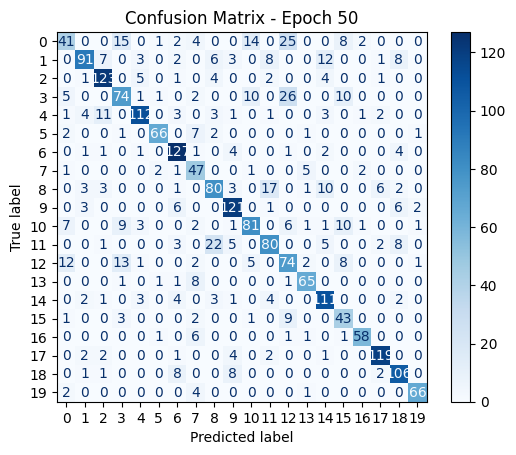

Epoch 50/75 - Train Loss: 1.2429, Train Acc: 0.7530, Val Loss: 1.2069, Val Acc: 0.7512, precision: 0.7521, recall: 0.7558, f1: 0.7491
Epoch [51/75]

Epoch 51/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2438, Accuracy: 75.31%
Batch 20/719, Loss: 1.6107, Accuracy: 73.20%
Batch 30/719, Loss: 1.3232, Accuracy: 74.79%
Batch 40/719, Loss: 1.3176, Accuracy: 74.96%
Batch 50/719, Loss: 1.2564, Accuracy: 75.94%
Batch 60/719, Loss: 1.1865, Accuracy: 75.83%
Batch 70/719, Loss: 1.2928, Accuracy: 76.03%
Batch 80/719, Loss: 1.4191, Accuracy: 75.78%
Batch 90/719, Loss: 1.3857, Accuracy: 75.40%
Batch 100/719, Loss: 1.2585, Accuracy: 75.28%
Batch 110/719, Loss: 1.4879, Accuracy: 75.40%
Batch 120/719, Loss: 1.2085, Accuracy: 75.10%
Batch 130/719, Loss: 1.2311, Accuracy: 75.07%
Batch 140/719, Loss: 1.2276, Accuracy: 75.15%
Batch 150/719, Loss: 1.1544, Accuracy: 75.08%
Batch 160/719, Loss: 1.1937, Accuracy: 75.18%
Batch 170/719, Loss: 1.2111, Accuracy: 75.06%
Batch 180/719, Loss: 1.2481, Accuracy: 7

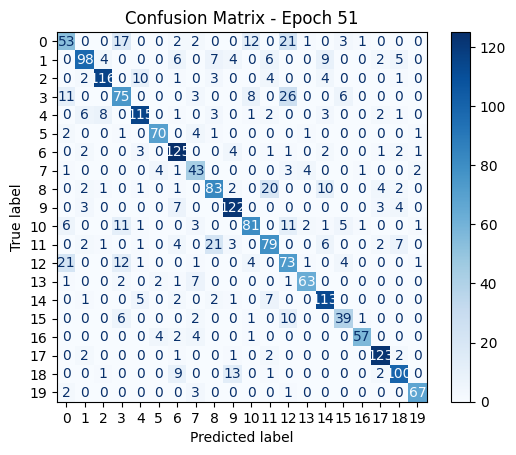

Epoch 51/75 - Train Loss: 1.2387, Train Acc: 0.7560, Val Loss: 1.1966, Val Acc: 0.7557, precision: 0.7606, recall: 0.7569, f1: 0.7567
Best model saved with val accuracy: 0.7557!
Epoch [52/75]

Epoch 52/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3643, Accuracy: 77.34%
Batch 20/719, Loss: 1.3335, Accuracy: 75.16%
Batch 30/719, Loss: 1.5340, Accuracy: 75.05%
Batch 40/719, Loss: 1.2255, Accuracy: 74.96%
Batch 50/719, Loss: 1.3450, Accuracy: 74.84%
Batch 60/719, Loss: 1.0359, Accuracy: 75.47%
Batch 70/719, Loss: 1.2732, Accuracy: 75.36%
Batch 80/719, Loss: 1.3617, Accuracy: 75.08%
Batch 90/719, Loss: 1.1624, Accuracy: 75.10%
Batch 100/719, Loss: 1.0884, Accuracy: 75.14%
Batch 110/719, Loss: 1.2352, Accuracy: 75.37%
Batch 120/719, Loss: 1.2146, Accuracy: 75.18%
Batch 130/719, Loss: 1.1981, Accuracy: 75.18%
Batch 140/719, Loss: 1.1834, Accuracy: 75.36%
Batch 150/719, Loss: 1.2979, Accuracy: 75.31%
Batch 160/719, Loss: 1.1452, Accuracy: 75.45%
Batch 170/719, Loss: 1.3524, Accuracy: 75.

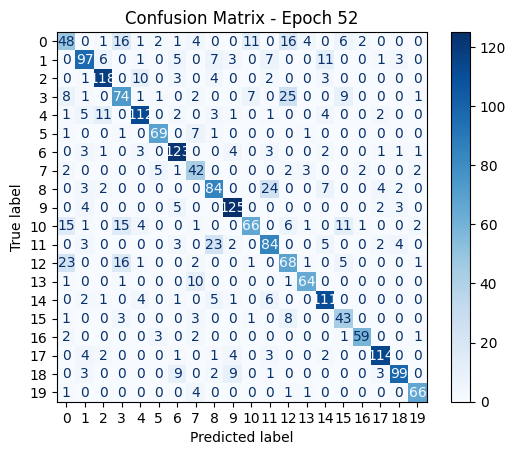

Epoch 52/75 - Train Loss: 1.2277, Train Acc: 0.7595, Val Loss: 1.2001, Val Acc: 0.7428, precision: 0.7438, recall: 0.7468, f1: 0.7426
Epoch [53/75]

Epoch 53/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4687, Accuracy: 74.22%
Batch 20/719, Loss: 1.4613, Accuracy: 74.84%
Batch 30/719, Loss: 1.4628, Accuracy: 75.21%
Batch 40/719, Loss: 1.4048, Accuracy: 75.20%
Batch 50/719, Loss: 1.1670, Accuracy: 76.00%
Batch 60/719, Loss: 1.2216, Accuracy: 76.09%
Batch 70/719, Loss: 1.2634, Accuracy: 76.00%
Batch 80/719, Loss: 1.1420, Accuracy: 75.90%
Batch 90/719, Loss: 1.1381, Accuracy: 76.02%
Batch 100/719, Loss: 1.2093, Accuracy: 75.78%
Batch 110/719, Loss: 1.2009, Accuracy: 76.01%
Batch 120/719, Loss: 1.1928, Accuracy: 75.91%
Batch 130/719, Loss: 1.2666, Accuracy: 75.95%
Batch 140/719, Loss: 1.3366, Accuracy: 76.05%
Batch 150/719, Loss: 1.3101, Accuracy: 76.02%
Batch 160/719, Loss: 1.2143, Accuracy: 76.14%
Batch 170/719, Loss: 1.0313, Accuracy: 76.28%
Batch 180/719, Loss: 1.3016, Accuracy: 7

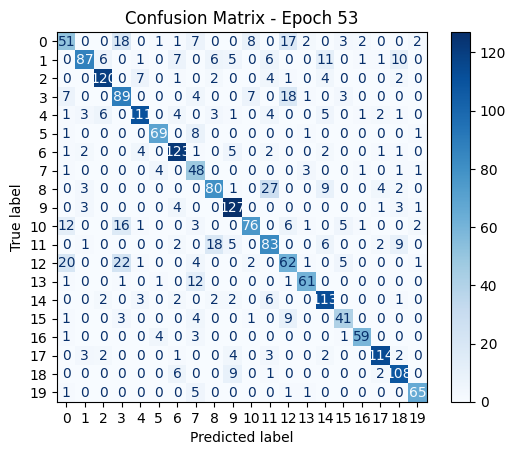

Epoch 53/75 - Train Loss: 1.2221, Train Acc: 0.7634, Val Loss: 1.2032, Val Acc: 0.7521, precision: 0.7574, recall: 0.7562, f1: 0.7518
Epoch [54/75]

Epoch 54/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3041, Accuracy: 76.56%
Batch 20/719, Loss: 1.2700, Accuracy: 76.88%
Batch 30/719, Loss: 1.3752, Accuracy: 76.51%
Batch 40/719, Loss: 1.2007, Accuracy: 76.60%
Batch 50/719, Loss: 1.2556, Accuracy: 76.53%
Batch 60/719, Loss: 1.2980, Accuracy: 76.82%
Batch 70/719, Loss: 1.1508, Accuracy: 77.21%
Batch 80/719, Loss: 1.1566, Accuracy: 77.23%
Batch 90/719, Loss: 1.2878, Accuracy: 76.79%
Batch 100/719, Loss: 1.2896, Accuracy: 76.72%
Batch 110/719, Loss: 1.0592, Accuracy: 77.03%
Batch 120/719, Loss: 1.3164, Accuracy: 76.86%
Batch 130/719, Loss: 1.2463, Accuracy: 76.94%
Batch 140/719, Loss: 1.2098, Accuracy: 77.01%
Batch 150/719, Loss: 1.1621, Accuracy: 76.85%
Batch 160/719, Loss: 1.2387, Accuracy: 76.93%
Batch 170/719, Loss: 1.1316, Accuracy: 76.75%
Batch 180/719, Loss: 1.1830, Accuracy: 7

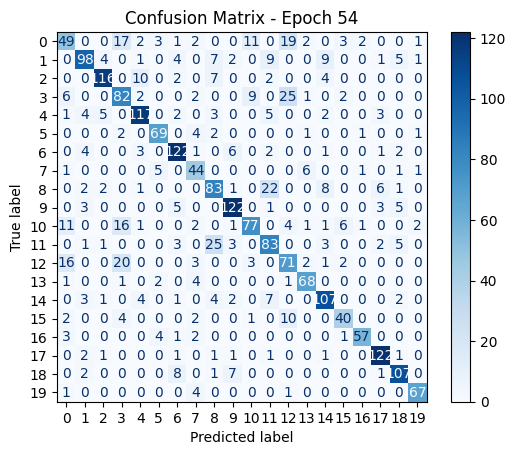

Epoch 54/75 - Train Loss: 1.2180, Train Acc: 0.7651, Val Loss: 1.1854, Val Acc: 0.7584, precision: 0.7619, recall: 0.7610, f1: 0.7598
Best model saved with val accuracy: 0.7584!
Epoch [55/75]

Epoch 55/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3368, Accuracy: 78.91%
Batch 20/719, Loss: 1.3575, Accuracy: 77.11%
Batch 30/719, Loss: 1.4846, Accuracy: 76.77%
Batch 40/719, Loss: 1.1644, Accuracy: 77.34%
Batch 50/719, Loss: 1.3354, Accuracy: 77.31%
Batch 60/719, Loss: 1.2507, Accuracy: 77.08%
Batch 70/719, Loss: 1.1446, Accuracy: 77.03%
Batch 80/719, Loss: 1.3413, Accuracy: 77.09%
Batch 90/719, Loss: 1.1094, Accuracy: 77.00%
Batch 100/719, Loss: 1.2283, Accuracy: 76.94%
Batch 110/719, Loss: 1.2177, Accuracy: 76.92%
Batch 120/719, Loss: 1.2412, Accuracy: 76.71%
Batch 130/719, Loss: 1.1218, Accuracy: 76.72%
Batch 140/719, Loss: 1.2487, Accuracy: 76.72%
Batch 150/719, Loss: 1.2723, Accuracy: 76.57%
Batch 160/719, Loss: 1.1603, Accuracy: 76.70%
Batch 170/719, Loss: 1.2214, Accuracy: 76.

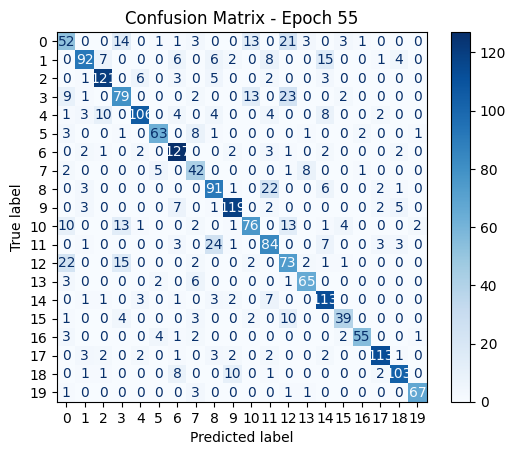

Epoch 55/75 - Train Loss: 1.2075, Train Acc: 0.7704, Val Loss: 1.1974, Val Acc: 0.7490, precision: 0.7582, recall: 0.7492, f1: 0.7509
Epoch [56/75]

Epoch 56/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2958, Accuracy: 76.09%
Batch 20/719, Loss: 1.3689, Accuracy: 75.00%
Batch 30/719, Loss: 1.5007, Accuracy: 75.36%
Batch 40/719, Loss: 1.3471, Accuracy: 75.23%
Batch 50/719, Loss: 1.3916, Accuracy: 75.44%
Batch 60/719, Loss: 1.2899, Accuracy: 75.34%
Batch 70/719, Loss: 1.2547, Accuracy: 75.80%
Batch 80/719, Loss: 1.2071, Accuracy: 75.96%
Batch 90/719, Loss: 1.1804, Accuracy: 75.71%
Batch 100/719, Loss: 1.1662, Accuracy: 75.72%
Batch 110/719, Loss: 1.1473, Accuracy: 75.92%
Batch 120/719, Loss: 1.2453, Accuracy: 75.70%
Batch 130/719, Loss: 1.2622, Accuracy: 75.58%
Batch 140/719, Loss: 1.1966, Accuracy: 75.68%
Batch 150/719, Loss: 1.2776, Accuracy: 75.81%
Batch 160/719, Loss: 1.2412, Accuracy: 75.83%
Batch 170/719, Loss: 1.1581, Accuracy: 75.95%
Batch 180/719, Loss: 1.1009, Accuracy: 7

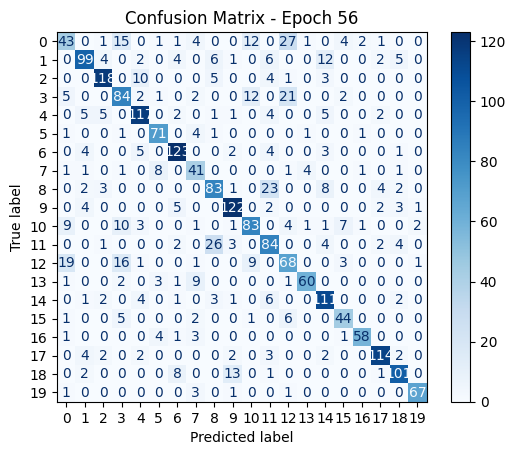

Epoch 56/75 - Train Loss: 1.2060, Train Acc: 0.7683, Val Loss: 1.1861, Val Acc: 0.7539, precision: 0.7570, recall: 0.7558, f1: 0.7546
Epoch [57/75]

Epoch 57/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3850, Accuracy: 75.00%
Batch 20/719, Loss: 1.2813, Accuracy: 75.23%
Batch 30/719, Loss: 1.3015, Accuracy: 76.09%
Batch 40/719, Loss: 1.1335, Accuracy: 76.72%
Batch 50/719, Loss: 1.0597, Accuracy: 77.31%
Batch 60/719, Loss: 1.2956, Accuracy: 76.93%
Batch 70/719, Loss: 1.1911, Accuracy: 76.94%
Batch 80/719, Loss: 1.3330, Accuracy: 77.07%
Batch 90/719, Loss: 1.1220, Accuracy: 77.36%
Batch 100/719, Loss: 1.1419, Accuracy: 77.33%
Batch 110/719, Loss: 1.1699, Accuracy: 77.37%
Batch 120/719, Loss: 1.1725, Accuracy: 77.40%
Batch 130/719, Loss: 1.3545, Accuracy: 77.48%
Batch 140/719, Loss: 1.2510, Accuracy: 77.31%
Batch 150/719, Loss: 1.2960, Accuracy: 77.45%
Batch 160/719, Loss: 0.9973, Accuracy: 77.65%
Batch 170/719, Loss: 1.1127, Accuracy: 77.77%
Batch 180/719, Loss: 1.3157, Accuracy: 7

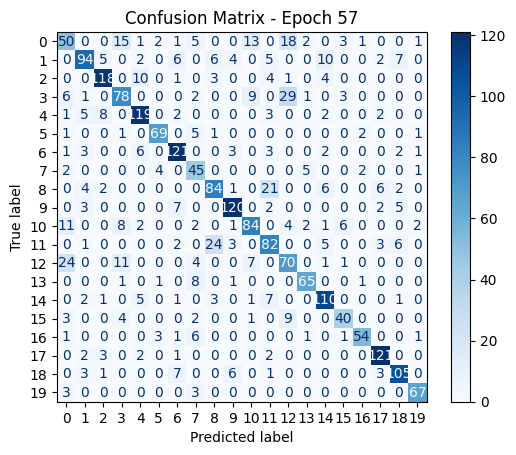

Epoch 57/75 - Train Loss: 1.1970, Train Acc: 0.7741, Val Loss: 1.1921, Val Acc: 0.7561, precision: 0.7581, recall: 0.7579, f1: 0.7562
Epoch [58/75]

Epoch 58/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2626, Accuracy: 76.25%
Batch 20/719, Loss: 1.3916, Accuracy: 75.78%
Batch 30/719, Loss: 1.3732, Accuracy: 76.67%
Batch 40/719, Loss: 1.3033, Accuracy: 77.38%
Batch 50/719, Loss: 1.1162, Accuracy: 77.44%
Batch 60/719, Loss: 1.2105, Accuracy: 77.24%
Batch 70/719, Loss: 1.1259, Accuracy: 77.14%
Batch 80/719, Loss: 1.1504, Accuracy: 77.17%
Batch 90/719, Loss: 1.0039, Accuracy: 77.00%
Batch 100/719, Loss: 1.2141, Accuracy: 76.77%
Batch 110/719, Loss: 1.0931, Accuracy: 76.97%
Batch 120/719, Loss: 1.0984, Accuracy: 76.84%
Batch 130/719, Loss: 1.1540, Accuracy: 76.78%
Batch 140/719, Loss: 1.0689, Accuracy: 76.99%
Batch 150/719, Loss: 1.2470, Accuracy: 77.06%
Batch 160/719, Loss: 1.2492, Accuracy: 77.20%
Batch 170/719, Loss: 1.0028, Accuracy: 77.18%
Batch 180/719, Loss: 1.1168, Accuracy: 7

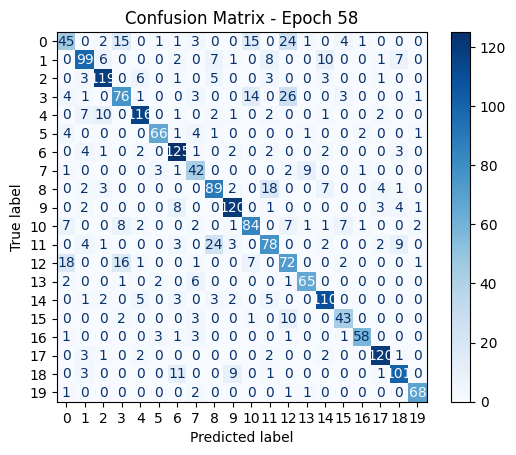

Epoch 58/75 - Train Loss: 1.1975, Train Acc: 0.7727, Val Loss: 1.1814, Val Acc: 0.7561, precision: 0.7582, recall: 0.7584, f1: 0.7568
Epoch [59/75]

Epoch 59/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2075, Accuracy: 76.88%
Batch 20/719, Loss: 1.3576, Accuracy: 77.34%
Batch 30/719, Loss: 1.3259, Accuracy: 77.45%
Batch 40/719, Loss: 1.3340, Accuracy: 78.09%
Batch 50/719, Loss: 1.2424, Accuracy: 78.00%
Batch 60/719, Loss: 1.2162, Accuracy: 77.92%
Batch 70/719, Loss: 1.1791, Accuracy: 77.88%
Batch 80/719, Loss: 1.2828, Accuracy: 77.44%
Batch 90/719, Loss: 1.0593, Accuracy: 77.55%
Batch 100/719, Loss: 1.2132, Accuracy: 77.48%
Batch 110/719, Loss: 1.1353, Accuracy: 77.64%
Batch 120/719, Loss: 1.2381, Accuracy: 77.43%
Batch 130/719, Loss: 1.2544, Accuracy: 77.18%
Batch 140/719, Loss: 1.2348, Accuracy: 77.06%
Batch 150/719, Loss: 1.1426, Accuracy: 76.96%
Batch 160/719, Loss: 1.1541, Accuracy: 77.14%
Batch 170/719, Loss: 1.2082, Accuracy: 77.17%
Batch 180/719, Loss: 1.1309, Accuracy: 7

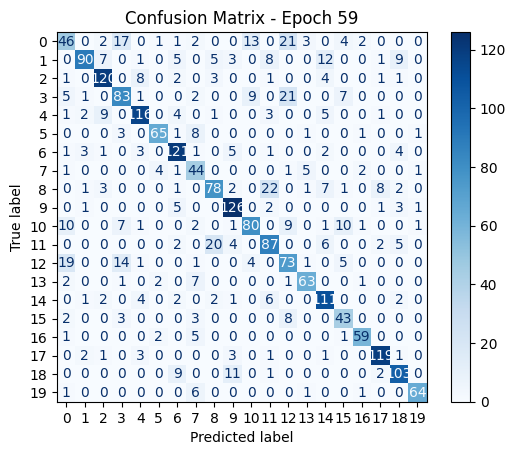

Epoch 59/75 - Train Loss: 1.1935, Train Acc: 0.7740, Val Loss: 1.1863, Val Acc: 0.7539, precision: 0.7547, recall: 0.7560, f1: 0.7519
Epoch [60/75]

Epoch 60/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2846, Accuracy: 76.72%
Batch 20/719, Loss: 1.2293, Accuracy: 77.73%
Batch 30/719, Loss: 1.3321, Accuracy: 76.93%
Batch 40/719, Loss: 1.3123, Accuracy: 76.95%
Batch 50/719, Loss: 1.3705, Accuracy: 77.44%
Batch 60/719, Loss: 1.2228, Accuracy: 77.60%
Batch 70/719, Loss: 1.1831, Accuracy: 77.70%
Batch 80/719, Loss: 1.1983, Accuracy: 77.77%
Batch 90/719, Loss: 1.1402, Accuracy: 77.83%
Batch 100/719, Loss: 1.1467, Accuracy: 77.72%
Batch 110/719, Loss: 1.1955, Accuracy: 77.94%
Batch 120/719, Loss: 1.2190, Accuracy: 77.70%
Batch 130/719, Loss: 1.1706, Accuracy: 77.73%
Batch 140/719, Loss: 1.1112, Accuracy: 77.78%
Batch 150/719, Loss: 1.0299, Accuracy: 77.69%
Batch 160/719, Loss: 1.0706, Accuracy: 77.92%
Batch 170/719, Loss: 1.2496, Accuracy: 77.73%
Batch 180/719, Loss: 1.1526, Accuracy: 7

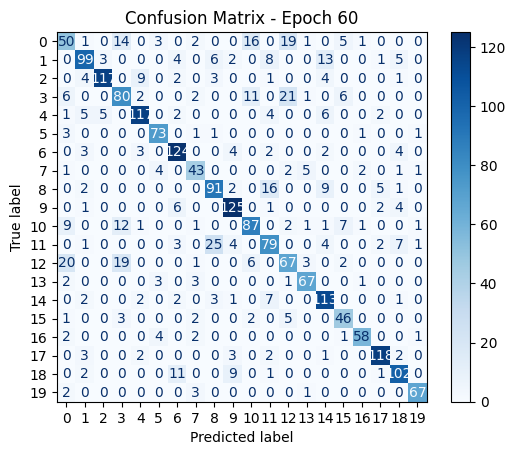

Epoch 60/75 - Train Loss: 1.1828, Train Acc: 0.7807, Val Loss: 1.1766, Val Acc: 0.7682, precision: 0.7694, recall: 0.7727, f1: 0.7699
Best model saved with val accuracy: 0.7682!
Epoch [61/75]

Epoch 61/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2995, Accuracy: 76.72%
Batch 20/719, Loss: 1.2798, Accuracy: 76.80%
Batch 30/719, Loss: 1.2927, Accuracy: 77.03%
Batch 40/719, Loss: 1.2533, Accuracy: 77.50%
Batch 50/719, Loss: 1.2210, Accuracy: 78.34%
Batch 60/719, Loss: 1.3904, Accuracy: 77.79%
Batch 70/719, Loss: 1.2413, Accuracy: 77.66%
Batch 80/719, Loss: 1.3841, Accuracy: 77.89%
Batch 90/719, Loss: 1.1878, Accuracy: 77.71%
Batch 100/719, Loss: 1.1510, Accuracy: 77.73%
Batch 110/719, Loss: 1.1575, Accuracy: 77.81%
Batch 120/719, Loss: 1.2044, Accuracy: 77.60%
Batch 130/719, Loss: 1.1558, Accuracy: 77.44%
Batch 140/719, Loss: 1.2703, Accuracy: 77.48%
Batch 150/719, Loss: 1.0805, Accuracy: 77.39%
Batch 160/719, Loss: 1.1220, Accuracy: 77.57%
Batch 170/719, Loss: 1.1685, Accuracy: 77.

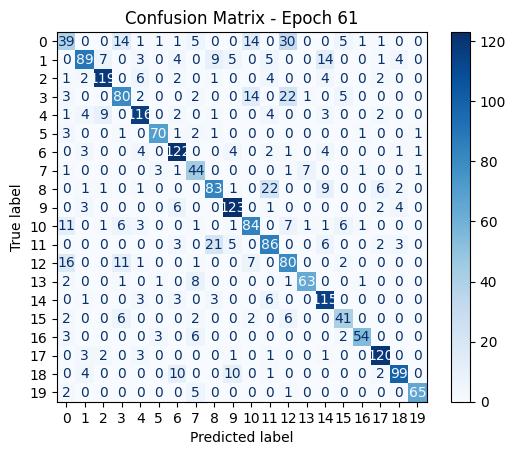

Epoch 61/75 - Train Loss: 1.1755, Train Acc: 0.7833, Val Loss: 1.1945, Val Acc: 0.7543, precision: 0.7586, recall: 0.7552, f1: 0.7540
Epoch [62/75]

Epoch 62/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2198, Accuracy: 79.22%
Batch 20/719, Loss: 1.2417, Accuracy: 77.34%
Batch 30/719, Loss: 1.3356, Accuracy: 77.24%
Batch 40/719, Loss: 1.1093, Accuracy: 77.70%
Batch 50/719, Loss: 1.1716, Accuracy: 78.00%
Batch 60/719, Loss: 1.0218, Accuracy: 77.94%
Batch 70/719, Loss: 1.1422, Accuracy: 77.99%
Batch 80/719, Loss: 1.1440, Accuracy: 78.05%
Batch 90/719, Loss: 1.2165, Accuracy: 77.88%
Batch 100/719, Loss: 1.0347, Accuracy: 77.91%
Batch 110/719, Loss: 1.1158, Accuracy: 78.00%
Batch 120/719, Loss: 1.1454, Accuracy: 77.81%
Batch 130/719, Loss: 1.0934, Accuracy: 77.78%
Batch 140/719, Loss: 1.0959, Accuracy: 77.99%
Batch 150/719, Loss: 1.3491, Accuracy: 77.85%
Batch 160/719, Loss: 1.0088, Accuracy: 77.98%
Batch 170/719, Loss: 1.0312, Accuracy: 77.93%
Batch 180/719, Loss: 1.2584, Accuracy: 7

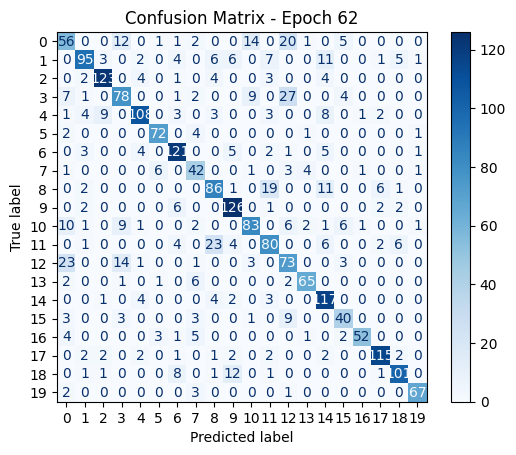

Epoch 62/75 - Train Loss: 1.1702, Train Acc: 0.7850, Val Loss: 1.1886, Val Acc: 0.7579, precision: 0.7646, recall: 0.7585, f1: 0.7590
Epoch [63/75]

Epoch 63/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1870, Accuracy: 78.28%
Batch 20/719, Loss: 1.2945, Accuracy: 77.58%
Batch 30/719, Loss: 1.4694, Accuracy: 76.77%
Batch 40/719, Loss: 1.1545, Accuracy: 77.38%
Batch 50/719, Loss: 1.2922, Accuracy: 77.66%
Batch 60/719, Loss: 1.0357, Accuracy: 78.10%
Batch 70/719, Loss: 1.2133, Accuracy: 78.35%
Batch 80/719, Loss: 1.3445, Accuracy: 78.18%
Batch 90/719, Loss: 1.1428, Accuracy: 78.09%
Batch 100/719, Loss: 1.0465, Accuracy: 78.19%
Batch 110/719, Loss: 1.1781, Accuracy: 78.22%
Batch 120/719, Loss: 1.2057, Accuracy: 78.09%
Batch 130/719, Loss: 1.1220, Accuracy: 78.11%
Batch 140/719, Loss: 1.0845, Accuracy: 78.10%
Batch 150/719, Loss: 1.1552, Accuracy: 78.06%
Batch 160/719, Loss: 1.0500, Accuracy: 78.17%
Batch 170/719, Loss: 0.9669, Accuracy: 78.24%
Batch 180/719, Loss: 1.2425, Accuracy: 7

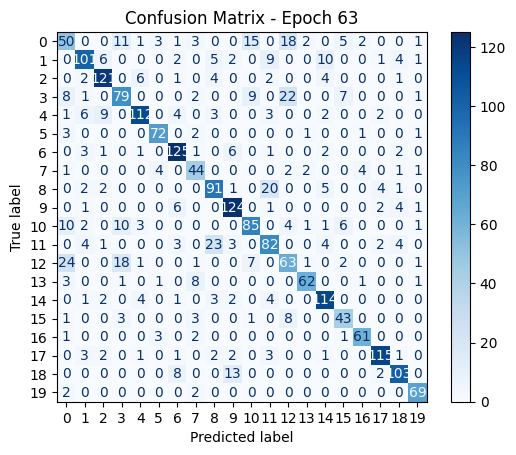

Epoch 63/75 - Train Loss: 1.1682, Train Acc: 0.7858, Val Loss: 1.1662, Val Acc: 0.7650, precision: 0.7644, recall: 0.7690, f1: 0.7657
Epoch [64/75]

Epoch 64/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2197, Accuracy: 79.06%
Batch 20/719, Loss: 1.2884, Accuracy: 78.83%
Batch 30/719, Loss: 1.3614, Accuracy: 79.43%
Batch 40/719, Loss: 1.2176, Accuracy: 79.53%
Batch 50/719, Loss: 1.0976, Accuracy: 79.41%
Batch 60/719, Loss: 1.1046, Accuracy: 79.48%
Batch 70/719, Loss: 1.0740, Accuracy: 79.49%
Batch 80/719, Loss: 1.2003, Accuracy: 79.49%
Batch 90/719, Loss: 1.0287, Accuracy: 79.38%
Batch 100/719, Loss: 1.0697, Accuracy: 79.33%
Batch 110/719, Loss: 1.1724, Accuracy: 79.25%
Batch 120/719, Loss: 1.1275, Accuracy: 79.09%
Batch 130/719, Loss: 1.2942, Accuracy: 79.07%
Batch 140/719, Loss: 1.0525, Accuracy: 79.16%
Batch 150/719, Loss: 1.2156, Accuracy: 79.14%
Batch 160/719, Loss: 1.0724, Accuracy: 79.06%
Batch 170/719, Loss: 1.1698, Accuracy: 79.05%
Batch 180/719, Loss: 1.2023, Accuracy: 7

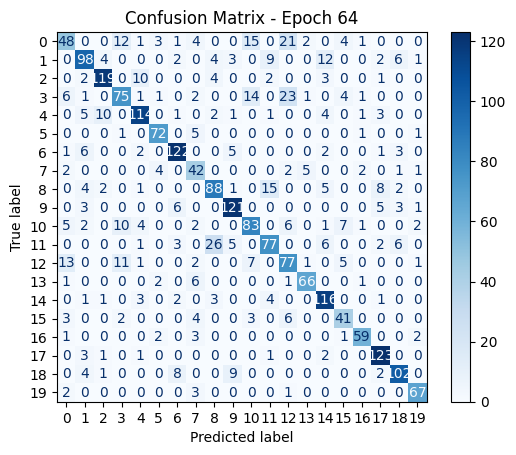

Epoch 64/75 - Train Loss: 1.1640, Train Acc: 0.7899, Val Loss: 1.1697, Val Acc: 0.7624, precision: 0.7593, recall: 0.7651, f1: 0.7601
Epoch [65/75]

Epoch 65/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2329, Accuracy: 76.56%
Batch 20/719, Loss: 1.3095, Accuracy: 76.72%
Batch 30/719, Loss: 1.2669, Accuracy: 78.07%
Batch 40/719, Loss: 1.1456, Accuracy: 78.55%
Batch 50/719, Loss: 1.1877, Accuracy: 78.97%
Batch 60/719, Loss: 1.0847, Accuracy: 79.04%
Batch 70/719, Loss: 1.1817, Accuracy: 79.33%
Batch 80/719, Loss: 1.2455, Accuracy: 79.57%
Batch 90/719, Loss: 1.0670, Accuracy: 79.72%
Batch 100/719, Loss: 1.1007, Accuracy: 79.66%
Batch 110/719, Loss: 1.1682, Accuracy: 79.91%
Batch 120/719, Loss: 1.1429, Accuracy: 79.65%
Batch 130/719, Loss: 1.2935, Accuracy: 79.35%
Batch 140/719, Loss: 1.2403, Accuracy: 79.33%
Batch 150/719, Loss: 1.2093, Accuracy: 79.18%
Batch 160/719, Loss: 0.9546, Accuracy: 79.38%
Batch 170/719, Loss: 1.2236, Accuracy: 79.26%
Batch 180/719, Loss: 1.0899, Accuracy: 7

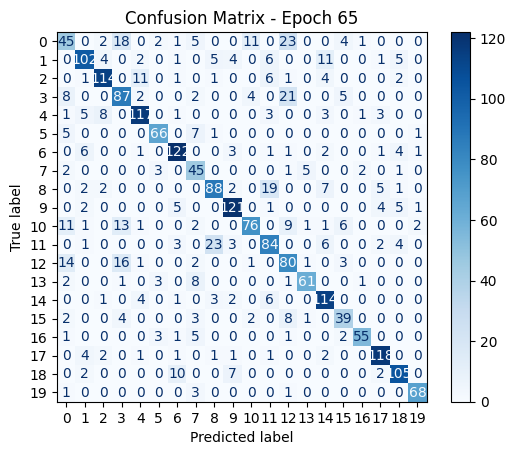

Epoch 65/75 - Train Loss: 1.1521, Train Acc: 0.7938, Val Loss: 1.1732, Val Acc: 0.7610, precision: 0.7641, recall: 0.7604, f1: 0.7594
Epoch [66/75]

Epoch 66/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2788, Accuracy: 76.88%
Batch 20/719, Loss: 1.2715, Accuracy: 78.20%
Batch 30/719, Loss: 1.2367, Accuracy: 78.54%
Batch 40/719, Loss: 1.1426, Accuracy: 78.01%
Batch 50/719, Loss: 1.1934, Accuracy: 78.38%
Batch 60/719, Loss: 1.1857, Accuracy: 78.88%
Batch 70/719, Loss: 1.2743, Accuracy: 78.86%
Batch 80/719, Loss: 1.2859, Accuracy: 78.87%
Batch 90/719, Loss: 1.1287, Accuracy: 79.03%
Batch 100/719, Loss: 1.0719, Accuracy: 78.98%
Batch 110/719, Loss: 1.1686, Accuracy: 79.36%
Batch 120/719, Loss: 1.0525, Accuracy: 79.18%
Batch 130/719, Loss: 1.1651, Accuracy: 79.21%
Batch 140/719, Loss: 1.1961, Accuracy: 79.32%
Batch 150/719, Loss: 1.0996, Accuracy: 79.16%
Batch 160/719, Loss: 1.0499, Accuracy: 79.35%
Batch 170/719, Loss: 1.1258, Accuracy: 79.30%
Batch 180/719, Loss: 1.2024, Accuracy: 7

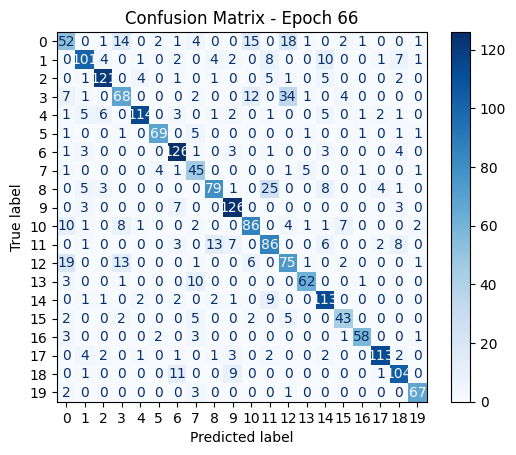

Epoch 66/75 - Train Loss: 1.1464, Train Acc: 0.7949, Val Loss: 1.1767, Val Acc: 0.7615, precision: 0.7657, recall: 0.7644, f1: 0.7622
Epoch [67/75]

Epoch 67/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.3146, Accuracy: 79.69%
Batch 20/719, Loss: 1.1479, Accuracy: 78.59%
Batch 30/719, Loss: 1.3622, Accuracy: 78.59%
Batch 40/719, Loss: 1.0234, Accuracy: 78.36%
Batch 50/719, Loss: 1.3384, Accuracy: 78.41%
Batch 60/719, Loss: 1.0452, Accuracy: 78.98%
Batch 70/719, Loss: 1.1518, Accuracy: 79.11%
Batch 80/719, Loss: 1.1099, Accuracy: 79.18%
Batch 90/719, Loss: 1.2451, Accuracy: 78.87%
Batch 100/719, Loss: 1.0994, Accuracy: 78.91%
Batch 110/719, Loss: 1.1760, Accuracy: 79.11%
Batch 120/719, Loss: 1.2072, Accuracy: 79.01%
Batch 130/719, Loss: 1.1061, Accuracy: 78.95%
Batch 140/719, Loss: 1.1027, Accuracy: 78.95%
Batch 150/719, Loss: 1.1757, Accuracy: 78.82%
Batch 160/719, Loss: 1.0464, Accuracy: 79.09%
Batch 170/719, Loss: 1.0875, Accuracy: 79.03%
Batch 180/719, Loss: 1.1214, Accuracy: 7

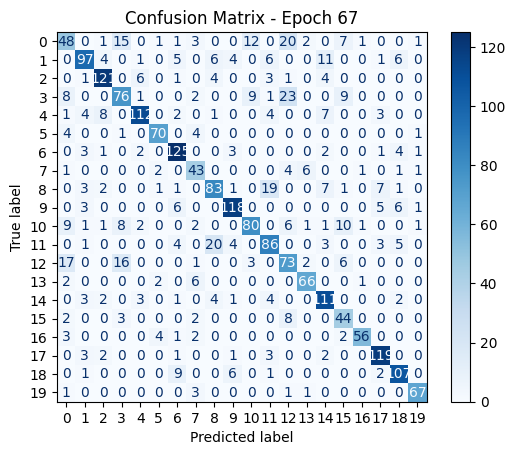

Epoch 67/75 - Train Loss: 1.1440, Train Acc: 0.7970, Val Loss: 1.1749, Val Acc: 0.7588, precision: 0.7592, recall: 0.7623, f1: 0.7584
Epoch [68/75]

Epoch 68/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1929, Accuracy: 79.53%
Batch 20/719, Loss: 1.0207, Accuracy: 79.45%
Batch 30/719, Loss: 1.2018, Accuracy: 79.74%
Batch 40/719, Loss: 1.0792, Accuracy: 79.96%
Batch 50/719, Loss: 1.1424, Accuracy: 80.03%
Batch 60/719, Loss: 1.0807, Accuracy: 80.36%
Batch 70/719, Loss: 1.1612, Accuracy: 80.51%
Batch 80/719, Loss: 1.0034, Accuracy: 80.49%
Batch 90/719, Loss: 1.0788, Accuracy: 80.38%
Batch 100/719, Loss: 1.0828, Accuracy: 80.20%
Batch 110/719, Loss: 1.2046, Accuracy: 80.13%
Batch 120/719, Loss: 1.1338, Accuracy: 79.93%
Batch 130/719, Loss: 1.1163, Accuracy: 79.86%
Batch 140/719, Loss: 1.1596, Accuracy: 79.67%
Batch 150/719, Loss: 1.1300, Accuracy: 79.60%
Batch 160/719, Loss: 1.0012, Accuracy: 79.79%
Batch 170/719, Loss: 1.0668, Accuracy: 79.91%
Batch 180/719, Loss: 1.1554, Accuracy: 7

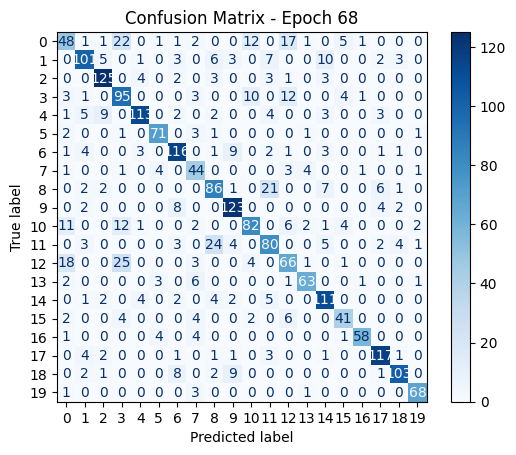

Epoch 68/75 - Train Loss: 1.1402, Train Acc: 0.8000, Val Loss: 1.1667, Val Acc: 0.7628, precision: 0.7666, recall: 0.7649, f1: 0.7638
Epoch [69/75]

Epoch 69/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4260, Accuracy: 80.47%
Batch 20/719, Loss: 1.2850, Accuracy: 79.92%
Batch 30/719, Loss: 1.2451, Accuracy: 80.26%
Batch 40/719, Loss: 1.0519, Accuracy: 79.92%
Batch 50/719, Loss: 1.3069, Accuracy: 79.94%
Batch 60/719, Loss: 1.2521, Accuracy: 80.16%
Batch 70/719, Loss: 1.1261, Accuracy: 80.29%
Batch 80/719, Loss: 1.2432, Accuracy: 80.06%
Batch 90/719, Loss: 1.0683, Accuracy: 80.10%
Batch 100/719, Loss: 1.1663, Accuracy: 79.92%
Batch 110/719, Loss: 1.1040, Accuracy: 80.17%
Batch 120/719, Loss: 1.1146, Accuracy: 80.04%
Batch 130/719, Loss: 1.1905, Accuracy: 79.99%
Batch 140/719, Loss: 1.0738, Accuracy: 80.01%
Batch 150/719, Loss: 1.2779, Accuracy: 79.85%
Batch 160/719, Loss: 0.9663, Accuracy: 79.96%
Batch 170/719, Loss: 1.1445, Accuracy: 79.92%
Batch 180/719, Loss: 1.1702, Accuracy: 7

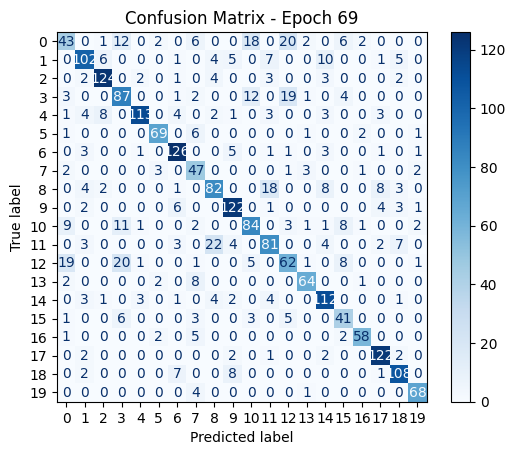

Epoch 69/75 - Train Loss: 1.1348, Train Acc: 0.8012, Val Loss: 1.1718, Val Acc: 0.7646, precision: 0.7596, recall: 0.7669, f1: 0.7606
Epoch [70/75]

Epoch 70/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2124, Accuracy: 78.59%
Batch 20/719, Loss: 1.0793, Accuracy: 78.36%
Batch 30/719, Loss: 1.1719, Accuracy: 79.48%
Batch 40/719, Loss: 1.2522, Accuracy: 79.84%
Batch 50/719, Loss: 1.1524, Accuracy: 80.12%
Batch 60/719, Loss: 1.0884, Accuracy: 79.53%
Batch 70/719, Loss: 1.0813, Accuracy: 79.55%
Batch 80/719, Loss: 1.1805, Accuracy: 79.45%
Batch 90/719, Loss: 0.9908, Accuracy: 79.70%
Batch 100/719, Loss: 0.9597, Accuracy: 80.09%
Batch 110/719, Loss: 1.1278, Accuracy: 80.17%
Batch 120/719, Loss: 1.0010, Accuracy: 80.09%
Batch 130/719, Loss: 1.3001, Accuracy: 80.17%
Batch 140/719, Loss: 1.1223, Accuracy: 80.29%
Batch 150/719, Loss: 1.1053, Accuracy: 80.22%
Batch 160/719, Loss: 0.9908, Accuracy: 80.34%
Batch 170/719, Loss: 1.1966, Accuracy: 80.38%
Batch 180/719, Loss: 1.0532, Accuracy: 8

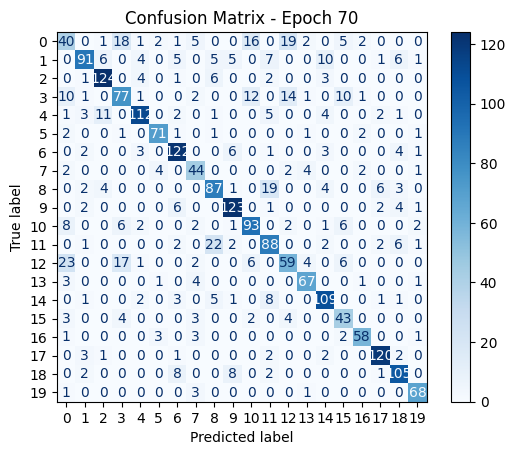

Epoch 70/75 - Train Loss: 1.1315, Train Acc: 0.8024, Val Loss: 1.1719, Val Acc: 0.7584, precision: 0.7531, recall: 0.7627, f1: 0.7561
Epoch [71/75]

Epoch 71/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.4376, Accuracy: 78.28%
Batch 20/719, Loss: 1.2035, Accuracy: 79.30%
Batch 30/719, Loss: 1.2619, Accuracy: 79.69%
Batch 40/719, Loss: 1.1781, Accuracy: 79.18%
Batch 50/719, Loss: 1.1709, Accuracy: 79.19%
Batch 60/719, Loss: 1.0740, Accuracy: 79.11%
Batch 70/719, Loss: 1.1397, Accuracy: 79.02%
Batch 80/719, Loss: 1.2206, Accuracy: 79.16%
Batch 90/719, Loss: 1.1191, Accuracy: 79.29%
Batch 100/719, Loss: 1.1738, Accuracy: 79.42%
Batch 110/719, Loss: 1.2034, Accuracy: 79.72%
Batch 120/719, Loss: 1.1525, Accuracy: 79.61%
Batch 130/719, Loss: 1.2133, Accuracy: 79.46%
Batch 140/719, Loss: 1.0256, Accuracy: 79.77%
Batch 150/719, Loss: 0.9879, Accuracy: 79.78%
Batch 160/719, Loss: 1.0213, Accuracy: 79.94%
Batch 170/719, Loss: 1.0231, Accuracy: 79.93%
Batch 180/719, Loss: 1.0706, Accuracy: 8

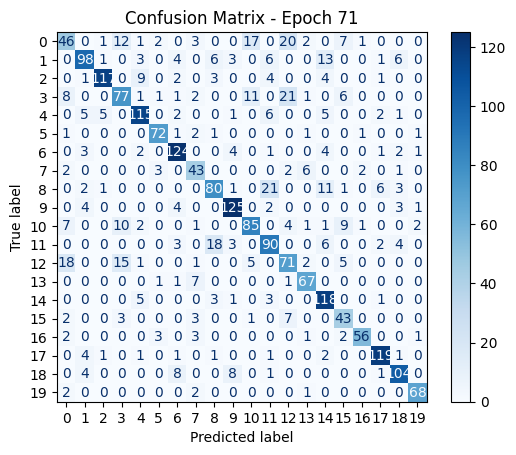

Epoch 71/75 - Train Loss: 1.1260, Train Acc: 0.8040, Val Loss: 1.1717, Val Acc: 0.7659, precision: 0.7640, recall: 0.7687, f1: 0.7641
Epoch [72/75]

Epoch 72/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2223, Accuracy: 79.53%
Batch 20/719, Loss: 1.2511, Accuracy: 80.08%
Batch 30/719, Loss: 1.3412, Accuracy: 80.21%
Batch 40/719, Loss: 1.1459, Accuracy: 79.80%
Batch 50/719, Loss: 1.2350, Accuracy: 79.97%
Batch 60/719, Loss: 1.0716, Accuracy: 79.64%
Batch 70/719, Loss: 1.1704, Accuracy: 79.55%
Batch 80/719, Loss: 1.0712, Accuracy: 79.59%
Batch 90/719, Loss: 1.0470, Accuracy: 79.88%
Batch 100/719, Loss: 1.0916, Accuracy: 79.94%
Batch 110/719, Loss: 1.1723, Accuracy: 80.13%
Batch 120/719, Loss: 1.1453, Accuracy: 80.00%
Batch 130/719, Loss: 1.1664, Accuracy: 80.11%
Batch 140/719, Loss: 1.0130, Accuracy: 80.13%
Batch 150/719, Loss: 1.1477, Accuracy: 80.12%
Batch 160/719, Loss: 1.0314, Accuracy: 80.22%
Batch 170/719, Loss: 1.0957, Accuracy: 80.12%
Batch 180/719, Loss: 1.2169, Accuracy: 8

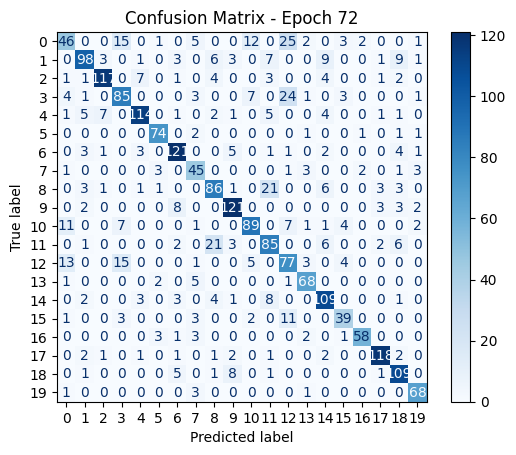

Epoch 72/75 - Train Loss: 1.1216, Train Acc: 0.8043, Val Loss: 1.1644, Val Acc: 0.7700, precision: 0.7711, recall: 0.7734, f1: 0.7699
Best model saved with val accuracy: 0.7700!
Epoch [73/75]

Epoch 73/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.0914, Accuracy: 83.28%
Batch 20/719, Loss: 1.1725, Accuracy: 80.78%
Batch 30/719, Loss: 1.3568, Accuracy: 80.16%
Batch 40/719, Loss: 1.1279, Accuracy: 80.35%
Batch 50/719, Loss: 1.2861, Accuracy: 80.03%
Batch 60/719, Loss: 1.0168, Accuracy: 80.23%
Batch 70/719, Loss: 0.9182, Accuracy: 80.54%
Batch 80/719, Loss: 1.0194, Accuracy: 80.72%
Batch 90/719, Loss: 1.0566, Accuracy: 80.75%
Batch 100/719, Loss: 1.0560, Accuracy: 80.66%
Batch 110/719, Loss: 1.2962, Accuracy: 80.62%
Batch 120/719, Loss: 1.1589, Accuracy: 80.56%
Batch 130/719, Loss: 1.2134, Accuracy: 80.64%
Batch 140/719, Loss: 1.1042, Accuracy: 80.67%
Batch 150/719, Loss: 1.1392, Accuracy: 80.73%
Batch 160/719, Loss: 1.0866, Accuracy: 80.92%
Batch 170/719, Loss: 1.1870, Accuracy: 80.

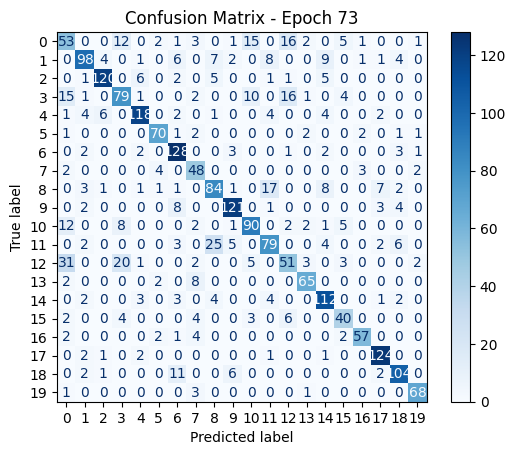

Epoch 73/75 - Train Loss: 1.1153, Train Acc: 0.8100, Val Loss: 1.1734, Val Acc: 0.7619, precision: 0.7608, recall: 0.7650, f1: 0.7609
Epoch [74/75]

Epoch 74/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.1407, Accuracy: 80.94%
Batch 20/719, Loss: 1.1998, Accuracy: 81.17%
Batch 30/719, Loss: 1.1281, Accuracy: 80.47%
Batch 40/719, Loss: 1.1450, Accuracy: 80.27%
Batch 50/719, Loss: 1.1860, Accuracy: 80.75%
Batch 60/719, Loss: 1.0619, Accuracy: 80.91%
Batch 70/719, Loss: 1.2155, Accuracy: 80.92%
Batch 80/719, Loss: 1.1538, Accuracy: 81.04%
Batch 90/719, Loss: 1.0526, Accuracy: 81.22%
Batch 100/719, Loss: 0.9978, Accuracy: 81.17%
Batch 110/719, Loss: 1.0830, Accuracy: 81.34%
Batch 120/719, Loss: 0.9842, Accuracy: 81.16%
Batch 130/719, Loss: 1.2890, Accuracy: 81.12%
Batch 140/719, Loss: 1.0057, Accuracy: 81.24%
Batch 150/719, Loss: 1.1818, Accuracy: 81.07%
Batch 160/719, Loss: 0.9938, Accuracy: 81.21%
Batch 170/719, Loss: 1.0758, Accuracy: 81.16%
Batch 180/719, Loss: 1.1552, Accuracy: 8

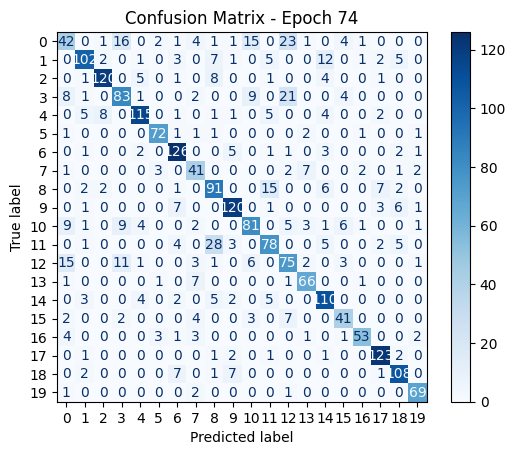

Epoch 74/75 - Train Loss: 1.1087, Train Acc: 0.8116, Val Loss: 1.1737, Val Acc: 0.7650, precision: 0.7620, recall: 0.7648, f1: 0.7614
Epoch [75/75]

Epoch 75/75 - Learning Rate: 0.000400
Batch 10/719, Loss: 1.2955, Accuracy: 79.38%
Batch 20/719, Loss: 1.2550, Accuracy: 79.30%
Batch 30/719, Loss: 1.4672, Accuracy: 79.79%
Batch 40/719, Loss: 1.2345, Accuracy: 80.16%
Batch 50/719, Loss: 1.1805, Accuracy: 80.25%
Batch 60/719, Loss: 1.0958, Accuracy: 80.44%
Batch 70/719, Loss: 1.0867, Accuracy: 80.51%
Batch 80/719, Loss: 1.0691, Accuracy: 80.49%
Batch 90/719, Loss: 1.0242, Accuracy: 80.62%
Batch 100/719, Loss: 1.2615, Accuracy: 80.66%
Batch 110/719, Loss: 1.0055, Accuracy: 80.88%
Batch 120/719, Loss: 1.1668, Accuracy: 80.62%
Batch 130/719, Loss: 1.0187, Accuracy: 80.58%
Batch 140/719, Loss: 1.1055, Accuracy: 80.61%
Batch 150/719, Loss: 1.0961, Accuracy: 80.59%
Batch 160/719, Loss: 1.3408, Accuracy: 80.63%
Batch 170/719, Loss: 1.1687, Accuracy: 80.67%
Batch 180/719, Loss: 1.1111, Accuracy: 8

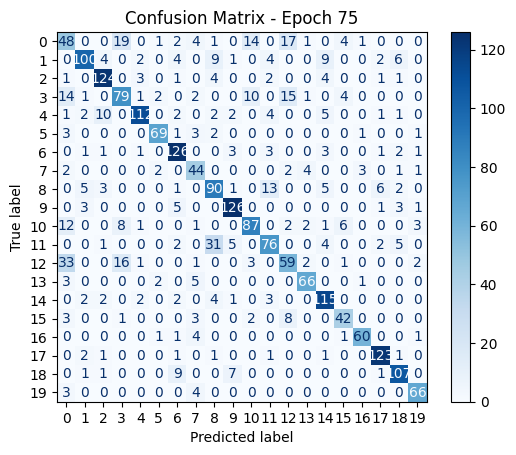

Epoch 75/75 - Train Loss: 1.1145, Train Acc: 0.8107, Val Loss: 1.1646, Val Acc: 0.7664, precision: 0.7680, recall: 0.7683, f1: 0.7663


In [10]:
model = vggmodel
num_epochs = 75
criterion = LabelSmoothingCrossEntropy(smoothing=0.10)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.009)
scheduler = OneCycleLR(optimizer, max_lr=0.01,
                       steps_per_epoch=len(train_loader), epochs=num_epochs,
                       pct_start=0.2, div_factor=25.0, final_div_factor=1e4)
scaler = GradScaler()
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

historyvgg, modelvgg = train_classification_model(vggmodel, train_loader2, val_loader2,0, optimizer, criterion,
                              scheduler=scheduler, num_epochs=num_epochs, device='cuda',
                              use_mixed_precision=False, patience=15, model_name="modelvgg")

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F

class WeightedEnsemble(nn.Module):
    def __init__(self, vgg_model, modelResnet, modelResnet3, modelResnet2):
        super().__init__()
        self.modelResnet = modelResnet
        self.modelResnet2 = modelResnet2
        self.modelResnet3 = modelResnet3
        self.vgg_model = vgg_model        
        self.weights = nn.Parameter(torch.ones(4)/4)
        
    def forward(self, x):
        out1 = self.vgg_model(x)
        out2 = self.modelResnet(x)
        out3 = self.modelResnet2(x)
        out4 = self.modelResnet3(x)
        norm_weights = F.softmax(self.weights, dim=0)
        
        ensemble_output = (
            norm_weights[0] * out1 + 
            norm_weights[1] * out2 +
            norm_weights[2] * out3 +
            norm_weights[2] * out4
        )
        
        return ensemble_output

    def predict(self, x):
        """Effettua la predizione e restituisce gli indici delle classi"""
        outputs = self.forward(x)
        _, predicted = torch.max(outputs, 1)
        return predicted



device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

modelResnet = Resnet().to('cuda')
modelResnet2 = Resnet().to('cuda')
modelResnet3 = Resnet().to('cuda')
modelvgg  = VGGStyleClassifier(num_classes=20, dropout=0.50).to(device)

# Load the checkpoint

checkpointvgg = torch.load('/kaggle/working/modelvgg.pt')
checkpointres = torch.load('/kaggle/working/resnetModel.pt')
checkpointres3 = torch.load('/kaggle/working/resnetModel3.pt')
checkpointres2 = torch.load('/kaggle/working/resnetModel2.pt')


# Load the model state dict
modelvgg.load_state_dict(checkpointvgg['model_state_dict'])
modelResnet.load_state_dict(checkpointres['model_state_dict'])  # If you have both models in the same checkpoint
modelResnet3.load_state_dict(checkpointres3['model_state_dict'])  # If you have both models in the same checkpoint
modelResnet2.load_state_dict(checkpointres2['model_state_dict'])  # If you have both models in the same checkpoint

# Set the models to evaluation mode
modelvgg.eval()
modelResnet.eval()
modelResnet3.eval()
modelResnet2.eval()
# Move the models to the appropriate device
modelvgg.to(device)
modelResnet.to(device)
modelResnet3.to(device)
modelResnet2.to(device)

# If you're using the ensemble model, load that too (as before)
ensemble_model = WeightedEnsemble(modelvgg, modelResnet, modelResnet3, modelResnet2).to(device)
ensemble_model.eval()  # Important: evaluation mode


/tmp/ipykernel_19/3490745712.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpointvgg = torch.load('/kaggle/working/modelvgg.pt')
/tmp/ipykernel_19/3490745712.py:5

WeightedEnsemble(
  (modelResnet): Resnet(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (layer1): Sequential(
      (0): ResidualBlock(
        (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (se): Block(
          (fc): Sequential(
            (0): AdaptiveAvgPool2d(output_size=1)
            (1): Conv2d(64, 4, kernel_size=(1, 1), stride=(1, 1))
            (2): ReLU(inplace=True)
            (3): Conv2d(4, 64, kernel_size=(1, 1), stride=(1, 1))
            (4): Sigmoid()
          )
        )
        (shortcut): Sequenti

In [12]:
def evaluate_ensemble(ensemble, test_loader, device):
    correct = 0
    total = 0
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            
            # Get predictions directly as class indices
            predictions = ensemble.predict(images)
            
            total += labels.size(0)
            correct += (predictions == labels).sum().item()
    
    accuracy = 100 * correct / total
    print(f'Ensemble Accuracy: {accuracy:.2f}%')
    return accuracy

# Create a confusion matrix for your ensemble
def get_ensemble_confusion_matrix(ensemble, test_loader, num_classes=20, device='cuda'):
    confusion_matrix = torch.zeros(num_classes, num_classes)
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            predictions = ensemble.predict(images)
            
            for i in range(labels.size(0)):
                confusion_matrix[labels[i], predictions[i]] += 1
    
    return confusion_matrix
def generate_predictions(model, loader, device):
    model.eval()
    results = []
    with torch.no_grad():
        for imgs, ids in loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            preds   = outputs.argmax(dim=1).cpu().numpy()
            results.extend(zip(ids, preds))
    return results

test_preds   = generate_predictions(ensemble_model, test_loader, device)
print(test_preds)
submission_df= pd.DataFrame(test_preds, columns=['id','label'])
submission_df.to_csv('submission.csv', index=False)

[('22430', 0), ('22431', 8), ('22432', 10), ('22433', 6), ('22434', 8), ('22435', 10), ('22436', 3), ('22437', 5), ('22438', 13), ('22439', 17), ('22440', 17), ('22441', 9), ('22442', 12), ('22443', 19), ('22444', 2), ('22445', 1), ('22446', 11), ('22447', 5), ('22448', 6), ('22449', 9), ('22450', 8), ('22451', 4), ('22452', 3), ('22453', 13), ('22454', 1), ('22455', 6), ('22456', 9), ('22457', 17), ('22458', 7), ('22459', 3), ('22460', 1), ('22461', 14), ('22462', 14), ('22463', 11), ('22464', 15), ('22465', 8), ('22466', 17), ('22467', 18), ('22468', 12), ('22469', 1), ('22470', 6), ('22471', 9), ('22472', 6), ('22473', 18), ('22474', 9), ('22475', 8), ('22476', 19), ('22477', 10), ('22478', 9), ('22479', 16), ('22480', 19), ('22481', 17), ('22482', 15), ('22483', 12), ('22484', 7), ('22485', 11), ('22486', 9), ('22487', 7), ('22488', 6), ('22489', 17), ('22490', 3), ('22491', 16), ('22492', 9), ('22493', 3), ('22494', 7), ('22495', 19), ('22496', 2), ('22497', 10), ('22498', 14), ('